### 온라인 매출 판매 분석(**Who's the VIP?**)
- 데이터엔지니어 과정
- 분석 기간 : 04/15 ~ 04/30

## 프로젝트 설명

**목표**

- 온라인 전문 교육기관인 패스트캠퍼스의 21년 3월~ 21년 9월 사이 결제 데이터를 분석
- 강의를 환불하지 않은 **`고객(순구매자)`** 데이터를 타겟 변수로 지정 (Purchased)
- VIP의 **기준**을 정한 뒤, 이들의 특성을 파악
- **시각화**를 이용하여 비교분석한 후, 그에 따른 판매 전략 제시

**진행 계획**

* **결측치, 이상치 전처리**
* **타겟 변수 선정**(`순 구매 테이블`)
* 타겟 변수를 가지고 **EDA** 진행
* VIP 조건 설정
* 다양한 방면에서 분석 후 판매 전략 수립

## 초기 설정

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# %matplotlib inline
# 주피터 노트북에 최적화 된 그래프 설정(코랩 사용불가)

# %matplotlib notebook
# 인터렉티브 그래프 가능(코랩 사용불가)

In [ ]:
%config InlineBackend.figure_format = 'retina'

**주피터 노트북 matplotlib 한글 설정**

In [ ]:
# import os

# # Mac OS의 경우와 그 외 OS의 경우로 나누어 설정
# if os.name == 'posix':
#     plt.rc("font", family="AppleGothic")
# else:
#     plt.rc("font", family="Malgun Gothic")

**코랩 matplotlib 한글 설정**

In [ ]:
# 네이버 나눔 폰트 설치
# !sudo apt-get install -y fonts-nanum
# !sudo fc-cache -fv
# !rm ~/.cache/matplotlib -rf
# 실행 후 런타입 재실행

In [ ]:
# 런타임 재실행 후 적용
plt.rc('font', family='NanumBarunGothic') 

**엑셀 불러오기 설정**

In [ ]:
!pip install openpyxl

테이블 시트 위치 설정

In [ ]:
%%html
<style>
  table {margin-left: 0 !important;}
</style>

## 변수 설명

---

-Columns

---

|Columns|Content|
|:---|:---|
|id|해당 거래내역에 대한 ID(PK)|
|customer_id|결제한 고객 ID|
|course_id|강의 ID (프로모션에 대해서는 값이 할당X)|
|type|거래의 종류|
|state|거래에 대한 상태|
|course_title|강의 제목|
|category_title|대분류|
|format|온라인 강의의 기획 종류|
|completed_at|state가 COMPLETED로 변경된 시점|
|transaction_amount|최종 결제 금액|
|coupon_title|쿠폰 종류|
|coupon_discount_amount|쿠폰 할인 금액|
|sale_price|판매 금액|
|tax_free_amount|보안상 공유가 힘듦|
|pg|PG사 종류|
|method|결제 방식|
|subcategory_title|중분류|
|marketing_start_at|강의 판매 시점|

---

-Type 유형

---

|type|유형|
|:---|:---|
|<span style="color: red">ORDER</span>|<span style="color: red">DEPRECATED</span>|
|PAYMENT|결제|
|<span style="color: red">TRANSACTION</span>|<span style="color: red">B2B 계약결제(무시해도 좋음)</span>|
|REFUND|환불|

---

-State 유형

---

|state|상태|
|:---|:---|
|COMPLETED|결제 완료|
|REQUESTED|고객에게 결제 요청|
|<span style="color: red">PENDING</span>|<span style="color: red">보안 이슈로 공개X</span>|
|<span style="color: red">CANCELLED</span>|<span style="color: red">보안 이슈로 공개X</span>|
|<span style="color: red">HIDDEN</span>|<span style="color: red">보안 이슈로 공개X</span>|
|<span style="color: red">DELETE</span>|<span style="color: red">보안 이슈로 공개X</span>|

# 데이터 분석

## 데이터 전처리

In [ ]:
# 데이터 불러오기
# for colab

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
train = pd.read_excel("/content/drive/MyDrive/Colab Notebooks/yds/FC_EDA/파이널프로젝트_RAW_210329_210926.xlsx")

In [ ]:
df = train.copy()

In [ ]:
df.head()

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
0,970634,504760.0,201435.0,ORDER,CANCELLED,올인원 패키지 : 알고리즘 기술면접 완전 정복,프로그래밍,올인원,2021-03-28 15:00:11,90500,NaN,NaN,110500.0,110500.0,NaN,VBANK,개발자 커리어,NaT
1,970650,432862.0,203178.0,ORDER,CANCELLED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-03-28 15:16:53,96000,NaN,NaN,116000.0,116000.0,NaN,CARD,영상 편집,2020-12-02
2,970657,72297.0,204246.0,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,171810,[10% 할인] 시크릿코드 실무 완성편,19090.0,190900.0,190900.0,NaN,CARD,NaN,2021-03-04
3,970656,72297.0,204246.0,ORDER,CANCELLED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,171810,NaN,NaN,190900.0,190900.0,NaN,CARD,NaN,2021-03-04
4,970658,478028.0,201797.0,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무 생산성,올인원,2021-03-28 15:21:54,97500,[웰컴쿠폰] 올인원 패키지 2만원 할인 쿠폰,20000.0,117500.0,117500.0,NaN,CARD,PPT/보고서,2019-11-14


### 결측값 확인 및 전처리

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105419 entries, 0 to 105418
Data columns (total 18 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      105419 non-null  int64         
 1   customer_id             105416 non-null  float64       
 2   course_id               100212 non-null  float64       
 3   type                    105419 non-null  object        
 4   state                   105419 non-null  object        
 5   course_title            105403 non-null  object        
 6   category_title          105395 non-null  object        
 7   format                  105403 non-null  object        
 8   completed_at            105419 non-null  datetime64[ns]
 9   transaction_amount      105419 non-null  int64         
 10  coupon_title            31817 non-null   object        
 11  coupon_discount_amount  31817 non-null   float64       
 12  sale_price              104291

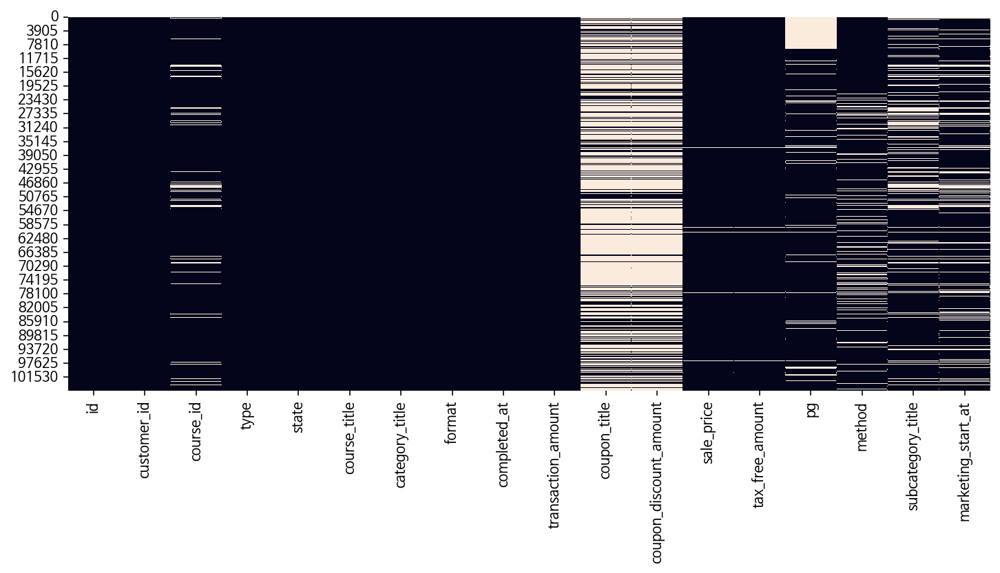

In [ ]:
# 시각 자료를 이용해 결측치 확인
plt.figure(figsize=(12,5))
sns.heatmap(df.isnull(), cbar=False)
plt.show()

**확인 결과**
- 컬럼별로 결측치가 많은 것을 확인할 수 있다.

**대안**
- 컬럼별로 결측치를 확인 진행

### customer_id

In [ ]:
# 결측치 검색
df[df['customer_id'].isnull()]

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
12133,1011200,NaN,NaN,TRANSACTION,COMPLETED,NaN,NaN,NaN,2021-04-12 11:40:00,0,NaN,NaN,NaN,NaN,NaN,B2B_CONTRACT,NaN,NaT
36367,1066932,NaN,NaN,TRANSACTION,COMPLETED,NaN,NaN,NaN,2021-05-17 16:12:00,0,NaN,NaN,NaN,NaN,NaN,B2B_CONTRACT,NaN,NaT
91500,1299115,NaN,NaN,TRANSACTION,COMPLETED,NaN,NaN,NaN,2021-08-20 20:05:00,0,NaN,NaN,NaN,NaN,NaN,B2B_CONTRACT,NaN,NaT


- customer_id 의 결측치는 대부분 NaN이므로 삭제

In [ ]:
df = df[df['customer_id'].isnull()==False] # 결측치 제거
df['customer_id'] = df['customer_id'].astype(int) # 정수형 변환

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


### course_id

In [ ]:
df[df['course_id'].isnull()].head()

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
6,970614,477910,NaN,ORDER,CANCELLED,프로모션 : 2021 내 커리어 지켜 줄 UX/UI 디자인 한끝세트 (3월 프리패스),크리에이티브,올인원,2021-03-28 15:22:36,299000,NaN,NaN,299000.0,299000.0,NaN,CARD,NaN,NaT
12,970670,429291,NaN,ORDER,CANCELLED,프로모션 : 코딩 LEVEL UP 웹 개발 풀스텍 한끝세트 (3월 프리패스),프로그래밍,올인원,2021-03-28 15:27:29,299000,NaN,NaN,299000.0,299000.0,NaN,CARD,NaN,NaT
13,970672,429291,NaN,ORDER,CANCELLED,프로모션 : 코딩 LEVEL UP 웹 개발 풀스텍 한끝세트 (3월 프리패스),프로그래밍,올인원,2021-03-28 15:30:05,299000,NaN,NaN,299000.0,299000.0,NaN,CARD,NaN,NaT
16,970677,429291,NaN,ORDER,CANCELLED,프로모션 : 코딩 LEVEL UP 웹 개발 풀스텍 한끝세트 (3월 프리패스),프로그래밍,올인원,2021-03-28 15:31:29,299000,NaN,NaN,299000.0,299000.0,NaN,CARD,NaN,NaT
18,970682,478031,NaN,PAYMENT,COMPLETED,프로모션 : 기초부터 시작하는 데이터분석 한끝세트 (3월 프리패스),데이터사이언스,올인원,2021-03-28 15:33:28,299000,NaN,NaN,299000.0,299000.0,NaN,CARD,NaN,NaT


- 강의와 관련된 값 빼고 다른 값들이 정상적으로 들어있는 것을 확인할 수 있다.<br>
※강의가 삭제되면서 데이터가 지워진 것으로 추정※

- 결측치를 채우거나 삭제할 필요 X

### course_title
- 결측치 및 테스트 데이터 제거

1. course_title 결측치 확인

In [ ]:
# 일부 값 빼고 전부 deleted
df[df['course_title'].isnull()]

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
9002,996843,490139,NaN,PAYMENT,DELETED,NaN,NaN,NaN,2021-04-07 15:05:06,480000,NaN,NaN,NaN,NaN,NaN,TRANSFER,NaN,NaT
9003,996793,490089,NaN,PAYMENT,DELETED,NaN,NaN,NaN,2021-04-07 15:05:06,600000,NaN,NaN,NaN,NaN,NaN,TRANSFER,NaN,NaT
9004,996842,490138,NaN,PAYMENT,DELETED,NaN,NaN,NaN,2021-04-07 15:05:06,600000,NaN,NaN,NaN,NaN,NaN,TRANSFER,NaN,NaT
9005,996851,490149,NaN,PAYMENT,DELETED,NaN,NaN,NaN,2021-04-07 15:05:06,600000,NaN,NaN,NaN,NaN,NaN,TRANSFER,NaN,NaT
12181,1006736,291328,NaN,PAYMENT,DELETED,NaN,NaN,NaN,2021-04-12 13:10:10,967000,NaN,NaN,NaN,NaN,NaN,TRANSFER,NaN,NaT
13754,1012747,498414,NaN,PAYMENT,DELETED,NaN,NaN,NaN,2021-04-15 20:40:35,170000,NaN,NaN,NaN,NaN,NaN,TRANSFER,NaN,NaT
31192,1063323,524510,NaN,PAYMENT,DELETED,NaN,NaN,NaN,2021-05-10 18:04:33,35000,NaN,NaN,NaN,NaN,NaN,TRANSFER,NaN,NaT
38944,1093777,539708,NaN,PAYMENT,DELETED,NaN,NaN,NaN,2021-05-22 10:57:39,127500,NaN,NaN,NaN,NaN,NaN,TRANSFER,NaN,NaT
40377,1093780,539709,NaN,PAYMENT,DELETED,NaN,NaN,NaN,2021-05-24 09:18:48,110000,NaN,NaN,NaN,NaN,NaN,TRANSFER,NaN,NaT
40378,1093784,539709,NaN,PAYMENT,DELETED,NaN,NaN,NaN,2021-05-24 09:18:48,110000,NaN,NaN,NaN,NaN,NaN,TRANSFER,NaN,NaT


In [ ]:
# Payment-Completed 건이 있으나 문의 결과 제거해도 무관하다 하여 제거
df = df.dropna(subset=['course_title'])

2. "TEST", "테스트용" "검수용" 등은 실제 구매 데이터가 아님. 처리 필요

2-1. 테스트용, TEST, 샘플 제거

In [ ]:
# 해당 조건에 맞는 값 추출
t = df[df["course_title"].str.contains("TEST") | df["course_title"].str.contains("테스트용") | df['course_title'].str.contains("샘플")]
t

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
20875,1034021,49600,205142.0,PAYMENT,COMPLETED,스프링 아카데미아 15개 영상강의 코스(5월) - 샘플 강의 제공용,프로그래밍,스쿨 온라인,2021-04-27 19:03:10,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,NaT
20899,1034100,270040,205142.0,PAYMENT,COMPLETED,스프링 아카데미아 15개 영상강의 코스(5월) - 샘플 강의 제공용,프로그래밍,스쿨 온라인,2021-04-27 19:50:54,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,NaT
20900,1034101,470930,205142.0,PAYMENT,COMPLETED,스프링 아카데미아 15개 영상강의 코스(5월) - 샘플 강의 제공용,프로그래밍,스쿨 온라인,2021-04-27 19:50:57,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,NaT
20901,1034102,33271,205142.0,PAYMENT,COMPLETED,스프링 아카데미아 15개 영상강의 코스(5월) - 샘플 강의 제공용,프로그래밍,스쿨 온라인,2021-04-27 19:51:05,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,NaT
20902,1034104,144798,205142.0,PAYMENT,COMPLETED,스프링 아카데미아 15개 영상강의 코스(5월) - 샘플 강의 제공용,프로그래밍,스쿨 온라인,2021-04-27 19:51:24,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51406,1129889,496508,NaN,ORDER,CANCELLED,(테스트용) 프로모션 : 기초부터 시작하는 데이터분석 프리패스 (5월 삼성 패키지 ...,데이터사이언스,올인원,2021-06-09 15:51:44,990000,NaN,NaN,990000.0,176000.0,NAVER,NaN,NaN,NaT
51435,1129971,496508,NaN,PAYMENT,COMPLETED,(테스트용) 프로모션 : 기초부터 시작하는 데이터분석 프리패스 (5월 삼성 패키지 ...,데이터사이언스,올인원,2021-06-09 16:32:25,990000,NaN,NaN,990000.0,176000.0,NAVER,CARD,NaN,NaT
51782,1131318,496508,NaN,REFUND,COMPLETED,(테스트용) 프로모션 : 기초부터 시작하는 데이터분석 프리패스 (5월 삼성 패키지 ...,데이터사이언스,올인원,2021-06-10 11:20:35,-990000,NaN,NaN,990000.0,176000.0,NAVER,CARD,NaN,NaT
56001,1146954,496508,NaN,ORDER,CANCELLED,(테스트용) 프로모션 : 기초부터 시작하는 데이터분석 프리패스 (5월 삼성 패키지 ...,데이터사이언스,올인원,2021-06-17 13:50:43,990000,NaN,NaN,990000.0,176000.0,NAVER,NaN,NaN,NaT


In [ ]:
# 추려낸 이상치 값 전부 drop
df = df.drop(list(t.index))

2-2. 'A/B테스트', '코딩테스트' 제외한 '테스트' 항목 추가 제거
- 'A/B테스트', '코딩테스트'가 포함된 course_title의 경우, 실제 강의명 (테스트용이 아님)
- 해당 강의들을 제외하고 나머지 '테스트'가 포함된 row 제거

In [ ]:
# 해당 단어가 포함된 course_id 검색
df[df["course_title"].str.contains("테스트")]["course_title"].unique()

array(['초격차 패키지 : 한 번에 끝내는 코딩테스트 369 Java편',
       '네카라쿠배 프론트엔드 취업완성 스쿨 2기_1차 테스트',
       '올인원 패키지 : A/B 테스트 탑재, 개인화 마케팅 끝장내기',
       '프로모션 : 2+2 코딩테스트 결과를 바꾸는 전공생 코딩 PASS (6월 프리패스)',
       '네카라쿠배 프론트엔드 취업완성 스쿨 2기_2차 테스트', '(B2B) 경남대학교_코딩 테스트 대비반',
       '프로모션 : 코딩테스트 결과를 바꾸는 전공생 코딩 BEST PASS (7월 프리패스)',
       '(초격차변경)프로모션 : 코딩테스트 결과를 바꾸는 전공생 코딩 BEST PASS (7월 프리패스)',
       '프로모션 : 코딩테스트 결과를 바꾸는 전공생 코딩 iPad 패키지 (7월 현물 프리패스)',
       'The RED : 고객 경험을 개선하는 A/B테스트 기반 모바일 앱 개발 by 이승민'], dtype=object)

In [ ]:
# 해당 강의의 transaction_amount 0원, sale_price는 1원이라 이상치라 판단, drop
df[df["course_title"].str.contains("네카라쿠배 프론트엔드 취업완성 스쿨")]

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
30770,1062130,523886,205237.0,PAYMENT,COMPLETED,네카라쿠배 프론트엔드 취업완성 스쿨 2기_1차 테스트,프로그래밍,스쿨,2021-05-10 10:58:57,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,2019-04-19
30783,1062160,84972,205237.0,PAYMENT,COMPLETED,네카라쿠배 프론트엔드 취업완성 스쿨 2기_1차 테스트,프로그래밍,스쿨,2021-05-10 11:11:21,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,2019-04-19
30814,1062222,513608,205237.0,PAYMENT,COMPLETED,네카라쿠배 프론트엔드 취업완성 스쿨 2기_1차 테스트,프로그래밍,스쿨,2021-05-10 11:39:56,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,2019-04-19
30822,1062238,438870,205237.0,PAYMENT,COMPLETED,네카라쿠배 프론트엔드 취업완성 스쿨 2기_1차 테스트,프로그래밍,스쿨,2021-05-10 11:50:03,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,2019-04-19
30824,1062248,523942,205237.0,PAYMENT,COMPLETED,네카라쿠배 프론트엔드 취업완성 스쿨 2기_1차 테스트,프로그래밍,스쿨,2021-05-10 11:55:30,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,2019-04-19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54402,1141156,546174,205715.0,PAYMENT,COMPLETED,네카라쿠배 프론트엔드 취업완성 스쿨 2기_2차 테스트,프로그래밍,스쿨,2021-06-14 12:34:02,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,2021-02-08
54447,1141335,67113,205715.0,PAYMENT,COMPLETED,네카라쿠배 프론트엔드 취업완성 스쿨 2기_2차 테스트,프로그래밍,스쿨,2021-06-14 14:25:11,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,2021-02-08
54491,1141485,523266,205715.0,PAYMENT,COMPLETED,네카라쿠배 프론트엔드 취업완성 스쿨 2기_2차 테스트,프로그래밍,스쿨,2021-06-14 15:46:16,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,2021-02-08
54611,1141900,560997,205237.0,PAYMENT,COMPLETED,네카라쿠배 프론트엔드 취업완성 스쿨 2기_1차 테스트,프로그래밍,스쿨,2021-06-14 19:25:34,0,NaN,NaN,1.0,1.0,NaN,PROMOTION,NaN,2019-04-19


In [ ]:
# 해당 강의들을 제외한 '테스트' 포함된 row 추려내기
t = df[~(df["course_title"].str.contains("A/B테스트"))&~(df["course_title"].str.contains("A/B 테스트"))&~(df["course_title"].str.contains("코딩 테스트"))&~(df["course_title"].str.contains("코딩테스트"))&df["course_title"].str.contains("테스트")]

In [ ]:
# 추려낸 이상치 drop
df = df.drop(list(t.index))

### category_title

- category_title의 경우, null 값이 존재하나 값을 유추할 수 있는 row들이 존재
- 해당 값들은 따로 전처리
- 이 값들을 제외하고 drop

In [ ]:
df[df['category_title'].isnull()]

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
41878,1078156,62566,NaN,REFUND,COMPLETED,프로모션 : 자유이용권 (3월),NaN,온라인,2021-05-26 22:06:00,-199000,NaN,NaN,199000.0,199000.0,NaN,TRANSFER,NaN,NaT
72639,1212937,591404,NaN,PAYMENT,COMPLETED,프로모션 : 풀스택 데이터 사이언티스트를 위한 필수 iPad 패키지 (7월 현물 프...,NaN,올인원,2021-07-12 23:38:42,990000,NaN,NaN,990000.0,272800.0,INICIS,CARD,NaN,NaT
74973,1223470,598011,NaN,ORDER,CANCELLED,프로모션 : 풀스택 데이터 사이언티스트를 위한 필수 iPad 패키지 (7월 현물 프...,NaN,올인원,2021-07-18 12:26:46,990000,NaN,NaN,990000.0,272800.0,INICIS,CARD,NaN,NaT
74975,1223480,598011,NaN,PAYMENT,COMPLETED,프로모션 : 풀스택 데이터 사이언티스트를 위한 필수 iPad 패키지 (7월 현물 프...,NaN,올인원,2021-07-18 12:31:01,990000,NaN,NaN,990000.0,272800.0,INICIS,CARD,NaN,NaT
74980,1223479,598011,NaN,ORDER,COMPLETED,프로모션 : 풀스택 데이터 사이언티스트를 위한 필수 iPad 패키지 (7월 현물 프...,NaN,올인원,2021-07-18 12:40:08,990000,NaN,NaN,990000.0,272800.0,INICIS,CARD,NaN,NaT
104056,1356347,561379,NaN,PAYMENT,CANCELLED,프로모션 : 영상편집 맥북 pro 패스(9월 현물 프리패스),NaN,올인원,2021-09-20 18:15:02,1800000,NaN,NaN,1800000.0,295200.0,INICIS,CARD,NaN,NaT
104318,1358067,617692,NaN,PAYMENT,CANCELLED,프로모션 : 영상편집 맥북 pro 패스(9월 현물 프리패스),NaN,올인원,2021-09-22 00:57:03,1800000,NaN,NaN,1800000.0,295200.0,NAVER,NaN,NaN,NaT
105189,1363817,83845,NaN,PAYMENT,CANCELLED,프로모션 : 영상편집 맥북 pro 패스(9월 현물 프리패스),NaN,올인원,2021-09-24 15:36:27,1800000,NaN,NaN,1800000.0,295200.0,INICIS,CARD,NaN,NaT


- customer_id = 62556 case
- course_title에 '자유이용권'이 포함되는 경우는 해당 row가 유일하며, 카테고리 분류가 애매하므로 해당 row는 drop.

- customer_id = 591404, 598011 case
- category_title 값 외에 다른 값들은 존재
- course_title에 '데이터사이언티스트' 란 단어가 포함되어 있음
- category_title을 '데이터사이언스'로 변경

In [ ]:
# 인덱스(72639, 74945) 으로 접근
df.loc[72639, "category_title"] = "데이터사이언스"
df.loc[74975, "category_title"] = "데이터사이언스"

- 이 외의 값들은 유추가 어렵거나 불가능, 실제 거래도 X
- 불필요한 값이므로 drop

In [ ]:
df = df.dropna(subset=["category_title"])

'데이터 사이언스' 공백 문자 제거 필요

In [ ]:
def func(x):
    return x.replace(" ", "")

df['category_title'] = df['category_title'].apply(func)

In [ ]:
df['category_title'].value_counts() # .nunique()

프로그래밍      33238
데이터사이언스    14082
업무생산성      13323
디자인        12009
영상/3D      10260
마케팅         9857
부동산/금융      5523
투자/재테크      2501
크리에이티브      2250
교육          1031
지식콘텐츠         56
비즈니스          42
파이낸스          25
일러스트           1
Name: category_title, dtype: int64

### subcategory_title

In [ ]:
df[df['subcategory_title'].isnull()].head()

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
2,970657,72297,204246.0,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,171810,[10% 할인] 시크릿코드 실무 완성편,19090.0,190900.0,190900.0,NaN,CARD,NaN,2021-03-04
3,970656,72297,204246.0,ORDER,CANCELLED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,171810,NaN,NaN,190900.0,190900.0,NaN,CARD,NaN,2021-03-04
6,970614,477910,NaN,ORDER,CANCELLED,프로모션 : 2021 내 커리어 지켜 줄 UX/UI 디자인 한끝세트 (3월 프리패스),크리에이티브,올인원,2021-03-28 15:22:36,299000,NaN,NaN,299000.0,299000.0,NaN,CARD,NaN,NaT
10,970671,469860,203644.0,PAYMENT,COMPLETED,올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 기초(평생소장),부동산/금융,올인원,2021-03-28 15:27:17,263000,NaN,NaN,263000.0,263000.0,NaN,CARD,NaN,2020-11-27
11,970668,469860,203644.0,ORDER,CANCELLED,올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 기초(평생소장),부동산/금융,올인원,2021-03-28 15:27:17,263000,NaN,NaN,263000.0,263000.0,NaN,CARD,NaN,2020-11-27


- 서브카테고리가 null일 경우, 상위 카테고리로 대체 가능
- 결측치 상위 카테고리로 대체

In [ ]:
df.loc[df['subcategory_title'].isnull(),"subcategory_title"] = df.loc[df['subcategory_title'].isnull(),"category_title"]

### PAYMENT, REFUND (타겟 변수)

In [ ]:
df['purchased'] = (df['type'] == 'PAYMENT') & (df['state'] == 'COMPLETED')

- payment-completed인 값 purchased column에 추가 (bool)

In [ ]:
pt = df[(df['type']=='PAYMENT')&(df['state']=='COMPLETED')] # 구매 데이터
rt = df[(df['type']=='REFUND')&(df['state']=='COMPLETED')] # 환불 데이터

- 환불 데이터는 구매 데이터에 포함됨

In [ ]:
paid = list(zip(pt['customer_id'].astype(float), pt['course_id'].astype(float)))
ref = list(zip(rt['customer_id'].astype(float), rt['course_id'].astype(float), rt['id']))

- 전처리를 위한 필요 컬럼데이터 추출

In [ ]:
# 중요!!!
# [customer_id],[course_id]가 일치하는 값 = 환불 후 재구매하지 않은 케이스
# 이 외의 다른 케이스는 쿠폰 등을 사용하여 재결제 했을 가능성 있음 -> 순수 환불이 아니다.
# 'payment-completed'와 'refund-completed'의 [customer_id],[course_id] 비교
# 결과 값을 real_ref에 담아둔다 

real_ref = []
for i in range(len(paid)):
  for j in range(len(ref)):
    if paid[i][0] == ref[j][0] and paid[i][1] == ref[j][1]:
      real_ref.append(ref[j])
      ref.remove(ref[j])
      break

In [ ]:
print(len(paid),len(real_ref),len(ref))

51707 1927 1893


- 총 결제 수 / 순수 환불 건수 / order-refund pair, 재구매, 기업강의환불 등 기타 이유

payment-completed 의 refund-completed (순수 환불) 환불데이터만  따로 분리

In [ ]:
# real_refund (순수 환불 건수) Data 확인
t = np.array(real_ref)
rt = rt[rt['id'].isin(t[:,2])]
rt

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at,purchased
759,972662,271507,204246.0,REFUND,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-29 10:28:46,-171810,NaN,NaN,190900.0,190900.0,NaN,CARD,프로그래밍,2021-03-04 00:00:00,False
1165,973680,498409,203782.0,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 모션그래픽,영상/3D,올인원,2021-03-29 14:39:49,-139000,NaN,NaN,139000.0,139000.0,NaN,CARD,모션그래픽,2021-01-22 00:00:00,False
1170,973686,462160,203328.0,REFUND,COMPLETED,올인원 패키지 : 디자이너 몰래 듣는 압축 포토샵,디자인,올인원,2021-03-29 14:41:27,-77600,NaN,NaN,87600.0,87600.0,NaN,CARD,디자인툴,2020-10-23 00:00:00,False
1198,973764,474332,203720.0,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-03-29 14:58:53,-111000,NaN,NaN,111000.0,111000.0,NaN,CARD,프론트엔드 개발,2021-02-02 00:00:00,False
1367,974226,475655,204037.0,REFUND,COMPLETED,매주)서비스 기획서 완성 온라인 완주반 2101,크리에이티브,온라인 완주반,2021-03-29 17:23:15,-367000,NaN,NaN,417000.0,417000.0,NaN,CARD,크리에이티브,2021-01-14 00:00:00,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105133,1363558,656066,205761.0,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 디지털 마케팅,마케팅,올인원,2021-09-24 13:33:08,-213000,NaN,NaN,233000.0,233000.0,INICIS,CARD,디지털마케팅,2021-08-17 00:00:00,False
105139,1363576,648937,204013.0,REFUND,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-09-24 13:43:57,-72000,NaN,NaN,174000.0,174000.0,NAVER,CARD,시각디자인,2021-03-16 00:00:00,False
105168,1363704,670215,204670.0,REFUND,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-09-24 14:32:43,-171000,NaN,NaN,171000.0,171000.0,NAVER,TRANS,글쓰기/카피라이팅,2021-06-18 17:00:00,False
105245,1364149,604077,205569.0,REFUND,COMPLETED,올인원 패키지 : 공여사와 무작정 풀어보는 엑셀 실무,업무생산성,올인원,2021-09-24 17:09:30,-109000,NaN,NaN,129000.0,129000.0,KAKAO,POINT,엑셀/VBA,2021-08-17 00:00:00,False


In [ ]:
51707-1927

49780

payment-completed 테이블에서 이와 짝이 맞는 refund 값을 빼주면 49816이 나와야 한다

In [ ]:
for i in range(len(df)):
  a = float(df.iloc[i,1]) # = customer_id
  b = float(df.iloc[i,2]) # = course_id
  if df.iloc[i,18] == True: # = purchased = True인 값
    for j in range(len(real_ref)): # 값 비교
      if real_ref[j][0] == a and real_ref[j][1] == b: # 환불 리스트에 해당 customer_id, course_id 있을 경우
          df.iloc[i,18] = False # True에서 False로 변경
          real_ref.remove(real_ref[j]) # 중복 방지를 위해 해당 값 삭제
          break

* purchased = True 값 중 환불이 이뤄진 경우 -> 최종적으로 구매한 값 X
* 데이터 내 purchased = True인 값 중 real_ref와 값이 겹칠 경우 False로 바꿈

In [ ]:
df['purchased'].value_counts()

False    54418
True     49780
Name: purchased, dtype: int64

- 성공적으로 줄어든 모습 확인

In [ ]:
# 순 구매 건 확인
pt = df[df['purchased'] == True]
pt

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at,purchased
2,970657,72297,204246.0,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,171810,[10% 할인] 시크릿코드 실무 완성편,19090.0,190900.0,190900.0,NaN,CARD,프로그래밍,2021-03-04,True
4,970658,478028,201797.0,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무생산성,올인원,2021-03-28 15:21:54,97500,[웰컴쿠폰] 올인원 패키지 2만원 할인 쿠폰,20000.0,117500.0,117500.0,NaN,CARD,PPT/보고서,2019-11-14,True
8,970669,478033,203178.0,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-03-28 15:26:47,96000,[웰컴쿠폰] 올인원 패키지 2만원 할인 쿠폰,20000.0,116000.0,116000.0,NaN,CARD,영상 편집,2020-12-02,True
10,970671,469860,203644.0,PAYMENT,COMPLETED,올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 기초(평생소장),부동산/금융,올인원,2021-03-28 15:27:17,263000,NaN,NaN,263000.0,263000.0,NaN,CARD,부동산/금융,2020-11-27,True
18,970682,478031,NaN,PAYMENT,COMPLETED,프로모션 : 기초부터 시작하는 데이터분석 한끝세트 (3월 프리패스),데이터사이언스,올인원,2021-03-28 15:33:28,299000,NaN,NaN,299000.0,299000.0,NaN,CARD,데이터사이언스,NaT,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105411,1364969,669238,204286.0,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 3D 디자인 툴,디자인,올인원,2021-09-25 13:39:26,212000,[미래투자금] 온라인 강의 2만원 할인쿠폰,20000.0,232000.0,232000.0,INICIS,CARD,디자인툴,2021-04-23,True
105412,1364976,384003,203178.0,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-09-25 13:46:29,149000,NaN,NaN,149000.0,149000.0,KAKAO,CARD,영상 편집,2020-12-02,True
105413,1364991,670891,203935.0,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발,프로그래밍,올인원,2021-09-25 14:01:26,159000,[미래투자금] 온라인 강의 2만원 할인쿠폰,20000.0,179000.0,179000.0,INICIS,CARD,백엔드 개발,2021-05-31,True
105416,1364996,640697,205365.0,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 유튜브 크리에이터 되기,영상/3D,올인원,2021-09-25 14:17:41,96000,[WELCOME] 온라인 강의 2만원 할인쿠폰,20000.0,116000.0,116000.0,INICIS,VBANK,영상 편집,2021-06-15,True


### price
- 일반적으로 강의를 결제할 경우 tax_free_amount와 sale price 가격이 동일하나, 일부 강의의 경우 서로 가격이 다른 경우가 있음
- 세전 금액과 sale_price가 다른경우(예시 : 현물프리패스 등) 실수익은 세전금액이라고 예측 가능
- 'revenue'란 컬럼 생성하여 쿠폰이 없는 경우에는 tax_free_amount, 있는 경우에는 transaction_amount 로 대체하여 실제 거래 가격을 넣어줌
- 쿠폰을 사용한 경우와 사용하지 않은 경우를 나누고, 사은품을 끼워서 판매한 강의도 나눔
- 사은품을 끼워 판 강의는 판매가격과 실제 수익이 다름

In [ ]:
pt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49780 entries, 2 to 105418
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      49780 non-null  int64         
 1   customer_id             49780 non-null  int64         
 2   course_id               47802 non-null  float64       
 3   type                    49780 non-null  object        
 4   state                   49780 non-null  object        
 5   course_title            49780 non-null  object        
 6   category_title          49780 non-null  object        
 7   format                  49780 non-null  object        
 8   completed_at            49780 non-null  datetime64[ns]
 9   transaction_amount      49780 non-null  int64         
 10  coupon_title            22928 non-null  object        
 11  coupon_discount_amount  22928 non-null  float64       
 12  sale_price              48715 non-null  float

In [ ]:
# taxfreeamount와 saleprice 가 다른 강좌들은 모두 쿠폰이 없음
pt[(pt["sale_price"]!= pt["tax_free_amount"]) & (~pt["coupon_title"].isnull())]

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at,purchased
90776,1294906,636868,207018.0,PAYMENT,COMPLETED,K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용),프로그래밍,B2G,2021-08-18 17:06:15,0,K-Digital Credit 빅데이터분석 첫걸음 시작하기_1기(평생소장용),300000.0,300000.0,0.0,NaN,PROMOTION,프로그래밍,NaT,True
91173,1297293,576889,207018.0,PAYMENT,COMPLETED,K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용),프로그래밍,B2G,2021-08-19 21:18:31,0,K-Digital Credit 빅데이터분석 첫걸음 시작하기_1기(평생소장용),300000.0,300000.0,0.0,NaN,PROMOTION,프로그래밍,NaT,True
91235,1297690,551722,207018.0,PAYMENT,COMPLETED,K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용),프로그래밍,B2G,2021-08-20 00:58:38,0,K-Digital Credit 빅데이터분석 첫걸음 시작하기_1기(평생소장용),300000.0,300000.0,0.0,NaN,PROMOTION,프로그래밍,NaT,True
91340,1298260,465057,207018.0,PAYMENT,COMPLETED,K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용),프로그래밍,B2G,2021-08-20 13:31:48,0,K-Digital Credit 빅데이터분석 첫걸음 시작하기_1기(평생소장용),300000.0,300000.0,0.0,NaN,PROMOTION,프로그래밍,NaT,True
91450,1298849,43421,207018.0,PAYMENT,COMPLETED,K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용),프로그래밍,B2G,2021-08-20 17:38:33,0,K-Digital Credit 빅데이터분석 첫걸음 시작하기_1기(평생소장용),300000.0,300000.0,0.0,NaN,PROMOTION,프로그래밍,NaT,True
91648,1299763,567768,207018.0,PAYMENT,COMPLETED,K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용),프로그래밍,B2G,2021-08-21 12:55:36,0,K-Digital Credit 빅데이터분석 첫걸음 시작하기_1기(평생소장용),300000.0,300000.0,0.0,NaN,PROMOTION,프로그래밍,NaT,True
91657,1299787,145454,207018.0,PAYMENT,COMPLETED,K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용),프로그래밍,B2G,2021-08-21 13:31:01,0,K-Digital Credit 빅데이터분석 첫걸음 시작하기_1기(평생소장용),300000.0,300000.0,0.0,NaN,PROMOTION,프로그래밍,NaT,True
91773,1300260,558182,207018.0,PAYMENT,COMPLETED,K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용),프로그래밍,B2G,2021-08-21 21:25:46,0,K-Digital Credit 빅데이터분석 첫걸음 시작하기_1기(평생소장용),300000.0,300000.0,0.0,NaN,PROMOTION,프로그래밍,NaT,True
92616,1303890,559793,207018.0,PAYMENT,COMPLETED,K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용),프로그래밍,B2G,2021-08-24 09:41:40,0,K-Digital Credit 빅데이터분석 첫걸음 시작하기_1기(평생소장용),300000.0,300000.0,0.0,NaN,PROMOTION,프로그래밍,NaT,True
92914,1305377,577873,207018.0,PAYMENT,COMPLETED,K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용),프로그래밍,B2G,2021-08-25 00:03:00,0,K-Digital Credit 빅데이터분석 첫걸음 시작하기_1기(평생소장용),300000.0,300000.0,0.0,NaN,PROMOTION,프로그래밍,NaT,True


In [ ]:
# sale_pric와 tax_free_amount가 다른 경우
pt[(pt["sale_price"]!= pt["tax_free_amount"])]["course_title"].value_counts()

데이터 사이언스 취업완성 스쿨 17기                               79
스프링 아카데미아                                          36
K-Digital Credit 빅데이터 분석 첫걸음 시작하기_1기(평생소장용)        14
프로모션 : 개발자를 위한 코딩 만능 백과사전 iPad 패키지 (7월 현물 프리패스)     8
프로모션 : 아이패드 200%활용 드로잉 만랩 iPad 패키지 (7월 현물 프리패스)     8
                                                   ..
(B2B) 노스글로벌 온라인 구독 올 플랜 - 비대면바우처                    1
(B2B) 일모작 온라인 구독 올 플랜 - 비대면바우처                      1
(B2B) (주)창소프트아이앤아이 온라인 구독 올 플랜 - 비대면바우처             1
(B2B) 주식회사 폴몬 온라인 구독 올 플랜 - 비대면바우처                  1
(B2B) (주)오디 온라인 구독 올 플랜 - 비대면바우처                    1
Name: course_title, Length: 985, dtype: int64

In [ ]:
# 현물 프리패스
pt[(pt["course_title"].str.contains("현물"))]["course_title"].value_counts()

프로모션 : 아이패드 200%활용 드로잉 만랩 iPad 패키지 (7월 현물 프리패스)                   8
프로모션 : 개발자를 위한 코딩 만능 백과사전 iPad 패키지 (7월 현물 프리패스)                   8
프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스)                               7
프로모션 : 나를 위한  데이터사이언스 백과사전  iPad 패키지 (7월 현물 프리패스)                 6
프로모션 : 디자인 맥북 pro 패스(9월 현물 프리패스)                                  4
프로모션 : 영상 퀄리티를 높이는  전문가 편집스킬 iPad 패키지 (7월 현물 프리패스)                4
프로모션 : 직장인 필수 스킬 맥북 pro 패스(9월 현물 프리패스)                            3
프로모션 : 초봉을 바꾸는 주니어를 위한 개발 iPad 패키지 (7월 현물 프리패스)                   3
프로모션 : 유튜버 따라잡고 실버버튼 받는 영상 iPad 패키지 (7월 현물 프리패스)                  3
프로모션 : 트렌드 완벽정복! 일잘러 마케터  iPad 패키지 (7월 현물 프리패스)                   3
프로모션 : 기초부터 다지는 데이터분석 iPad 패키지 (7월 현물 프리패스)                       3
프로모션 : 풀스택 개발자 맥북 air 패스(9월 현물 프리패스)                              3
프로모션 : 프론트엔드 맥북 pro 패스 (9월 현물 프리패스)                               3
프로모션 : 콘텐츠 디자이너를 위한 커리어 백과사전 iPad 패키지 (7월 현물 프리패스)                2
프로모션 : 풀스택 마케터를 위한 마케팅 iPad 패키지 (7월 현물 프리패스)    

In [ ]:
# 타겟변수 다시 정제
pt["revenue"] = pt["coupon_title"].isnull() * pt["tax_free_amount"] + ~pt["coupon_title"].isnull() *pt["transaction_amount"]
# revenue가 null값인 경우 transaction amount 로 값 변경(쿠폰은 없지만 tax_free_amount가 null인경우.. 주로 b2b)
pt.loc[pt["revenue"].isnull(),"revenue"] = pt.loc[pt["revenue"].isnull(),"transaction_amount"]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [ ]:
# 수익과 구매 횟수별 pivot table
t = pt.groupby("customer_id").agg({"revenue": "sum","id":'count'}).sort_values(by=["id","revenue"], ascending=False)
t

,revenue,id
customer_id,,
98685,7040750.0,53
427973,0.0,47
158374,0.0,42
50769,4979110.0,39
3189,0.0,39
...,...,...
658695,0.0,1
659634,0.0,1
659805,0.0,1


### coupon_title
- course_title과 마찬가지로, 테스트 값 존재
- 해당 값들 선별 후 drop

#### 테스트

In [ ]:
t = pt[~pt["coupon_title"].isnull()]
t1 = t[t['coupon_title'].str.contains("검수용")] # 검수용
t2 = t[t['coupon_title'].str.contains("테스트") | t['coupon_title'].str.contains("TEST")] # 테스트

- coupon_title에 "검수용"이 포함된 경우 drop

In [ ]:
pt = pt.drop(list(t1.index))

- coupon_title에 "테스트","TEST"가 포함된 경우


- '테스트'가 포함된 값들 중에 테스트용이 아닌 값들 존재
- 해당 값들 제외하고 drop

In [ ]:
t2['coupon_title'].unique()

array(['[무료수강권] CRM팀 테스트용_김경진 개인계정 (이메일 인증 안 된 계정)', '[내부직원] 테스트용 결제 쿠폰',
       '테스트쿠폰', 'TEST이제너두_직장인을 위한 파이썬 데이터 분석', 'TEST',
       '[무료수강권] 초격차 패키지: 한 번에 끝내는 코딩테스트 369 Java편_이준희 강사님', '호준 테스트',
       '이웅모 강사님 강의 준비용 쿠폰 발급_초격차 패키지 : 한 번에 끝내는 코딩테스트 369 Java편',
       '[테스트쿠폰] 네이버 페이 간편결제 테스트용 쿠폰', '테스트_전지현', '[CX] 관리자 외 계정 테스트용',
       '테스트', '[cs팀] 테스트 결제 위한 쿠폰 발급',
       '[30%쿠폰] The RED 고객 경험을 개선하는 A/B테스트 기반 모바일 앱 개발 신규 강의 할인'],
      dtype=object)

- '30%쿠폰~', '초격차 패키지: 한 번에 끝내는 코딩테스트 369 Java편_이준희 강사님' 
- 두 케이스는 실제 강의 이므로 해당 강의들 제외하고 Drop

In [ ]:
t3 = t2.loc[~t2['coupon_title'].str.startswith("[30%쿠폰]")]
t3 = t3.drop(33173) # 이준희 강사

In [ ]:
pt = pt.drop(list(t3.index))

#### 내부자용 쿠폰제거
- 최종 결제 가격이 0원인 거래들 다수 발견
- 정상 거래가 아니라 판단되어 해당 조건으로 검색 결과 쿠폰명에 일반 쿠폰과 다른 이름들 발견
- 해당 거래들 조회하여 제거

In [ ]:
df[df["transaction_amount"]==0]["coupon_title"].unique()

array(['한 번에 끝내는 Java/Sring 웹 개발 마스터 초격차 패키지 무료 쿠폰 (-2/28)',
       '수강생 50만명 돌파 기념 감사제 쿠폰', '[웰컴쿠폰] 올인원 패키지 1만원 할인 쿠폰',
       '올인원 패키지 : 타이포그래피와 편집디자인 강의 수강권', '[무료수강권] 강의 검수용_이호상 PM님',
       '패캐머_온라인 쿠폰 !',
       '[무료수강권] 파이낸스 카테고리 올인원 패키지_대체투자 자산운용 실무 영상 오픈 일정 변경',
       '한 번에 끝내는 반복 업무 자동화 초격차 패키지 사용 가능 쿠폰', 'crm 검수용 쿠폰 aop',
       '[럭키룰렛] 올인원패키지', '[무료수강권] 강의검수용_강사님 쿠폰_박혜린 강사님', '신해동 발행 쿠폰',
       '[무료수강권] 강사님 제공용 RED', '[무료수강권] 강사님 제공용', '[무료수강권] 내부직원 검수용 RED',
       '[무료수강권] 올인원 패키지 : 인스타를 성장시킨 50명의 성공 방정식 강의검수용_강사님 쿠폰',
       '[무료수강권] 내부직원 강의 검수용',
       '[무료수강권] 권오상 회계사의 자금조달 분석 및 가치평가_23기 신동현 수강생님', nan,
       '[무료수강권] 완주반 후기 리워드', 'Vue.js 압축 완성 강의',
       '[무료수강권] CRM팀 테스트용_김경진 개인계정 (이메일 인증 안 된 계정)',
       '이지웰 쿠폰_직장인 필수 스킬 3종 세트 MAX', '올인원 패키지 보상 쿠폰 1', '올인원 패키지 보상 쿠폰 2',
       '[무료수강권] 파이썬 웹 개발 올인원 패키지_조성준 강사님', '[폐강 보상] 온라인 완주반 100% 할인 쿠폰',
       '[무료수강권] 권오상 회계사의 금융 아카데미 - 재무제표 기초',
       '[무료수강권] 머신러닝과 데이터 분석 A to Z', '패캐머_온라인 쿠폰',
       '서포터즈 1기 리워드 (유니

- "패캐머"

In [ ]:
t = pt[~pt["coupon_title"].isnull()]
t_del = t[t['coupon_title'].str.contains("패캐머")]
t_del["coupon_title"].unique()

array(['패캐머_온라인 쿠폰 !', '패캐머_온라인 쿠폰', '패캐머_온라인 쿠폰! (CRM팀)'], dtype=object)

In [ ]:
pt = pt.drop(list(t_del.index))

- "제공용"

In [ ]:
t = pt[(~pt["coupon_title"].isnull())&(pt["transaction_amount"]==0)]
t_del = t[t['coupon_title'].str.contains("제공")]
t_del["coupon_title"].unique()

array(['[무료수강권] 강사님 제공용 RED', '[무료수강권] 강사님 제공용', '[무료수강권] 강사님 지인 제공용',
       '[무료수강권] 강사님 제공용_올인원 패키지', '글담X패스트캠퍼스 무료수강권 제공 이벤트 쿠폰',
       '[무료수강권] 강사님 제공 무료 수강권', '[무료수강권] 강사님 제공용_The RED 김민태',
       '[무료수강권] 강의 제공용 발행', '[무료 수강권] 강사제공용 쿠폰',
       '[무료수강권] 강사님 제공용_The RED', '[무료수강권] 외주업체 제공용',
       '[무료수강권] 강사 소속법인 임직원 제공', '[무료수강권] 강사님 제공용_AWS로DevOps'],
      dtype=object)

In [ ]:
pt = pt.drop(list(t_del.index))

- "샘플"

In [ ]:
t = pt[(~pt["coupon_title"].isnull())&(pt["transaction_amount"]==0)]
t_del = t[t['coupon_title'].str.contains("샘플")]
t_del["coupon_title"].unique()

array(['샘플'], dtype=object)

In [ ]:
pt = pt.drop(list(t_del.index))

- "내부"

In [ ]:
t = pt[(~pt["coupon_title"].isnull())&(pt["transaction_amount"]==0)]
t_del = t[t['coupon_title'].str.contains("내부")]
t_del["coupon_title"].unique()

array(['[무료수강권] 내부직원용', '[무료수강권] 내부 직원용_김준홍님',
       '[무료수강권] 내부직원용_AOP_허지은 PD님', '[무료수강권] 내부직원용_AOP_김인지 PD님',
       '[무료수강권] 내부직원용_RED_성정화 PD님', '[무료수강권] 내부직원용_RED_허지은 PD님',
       '[무료수강권] 내부직원용_RED_김인지 PD님', '[무료수강권] 내부직원용_AOP_성정화 PD님'],
      dtype=object)

In [ ]:
pt = pt.drop(list(t_del.index))

- "참고용"

In [ ]:
t = pt[(~pt["coupon_title"].isnull())&(pt["transaction_amount"]==0)]
t_del = t[t['coupon_title'].str.contains("참고용")]
t_del["coupon_title"].unique()

array(['강의 제작 참고용 (강사님)', '[무료수강권] 강의 참고용 발행_강사님', '강의 제작 참고용',
       'RED 이동주님 강의 참고용 쿠폰', '강의 참고용 쿠폰 : 최현우님', 'RED 강의 참고용 쿠폰',
       '[무료수강권] 강의 참고용 발행_양세열 강사님', 'RED 강연 참고용 쿠폰 (김상우님)',
       '[무료수강권] 강의 참고용 발행_다회권', '[무료수강권] 강의 참고용 발행_안성훈 강사님'], dtype=object)

In [ ]:
pt = pt.drop(list(t_del.index))

- "신해동 (대표이사)"

In [ ]:
t = pt[(~pt["coupon_title"].isnull())&(pt["transaction_amount"]==0)]
t_del = t[t['coupon_title'].str.contains("신해동")]
t_del["coupon_title"].unique()

array(['신해동 발행 쿠폰', '신해동 쿠폰', '특별 할인 쿠폰(신해동)', '신해동 발행 쿠폰 (~21. 08. 31)',
       '신해동 100% 할인 쿠폰'], dtype=object)

In [ ]:
pt = pt.drop(list(t_del.index))

In [ ]:
t = pt[(~pt["coupon_title"].isnull())&(pt["transaction_amount"]==0)]
t_del = t[t['coupon_title'].str.contains("예외")]
t_del["coupon_title"].unique()

array(['[예외처리]연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+'], dtype=object)

In [ ]:
pt = pt.drop(list(t_del.index))

- "업무용"

In [ ]:
t = pt[(~pt["coupon_title"].isnull())&(pt["transaction_amount"]==0)]
t_del = t[t['coupon_title'].str.contains("업무용")]
t_del["coupon_title"].unique()

array(['업무용'], dtype=object)

In [ ]:
pt = pt.drop(list(t_del.index))

- "매니저"

In [ ]:
t = pt[(~pt["coupon_title"].isnull())&(pt["transaction_amount"]==0)]
t_del = t[t['coupon_title'].str.contains("매니저")]
t_del["coupon_title"].unique()

array(['[무료수강권] 올인원 패키지 : 소금툰과 함께 캐릭터 드로잉/굿즈/임티/컷툰_장혜리 매니저님'],
      dtype=object)

In [ ]:
pt = pt.drop(list(t_del.index))

- "PD"

In [ ]:
t = pt[(~pt["coupon_title"].isnull())&(pt["transaction_amount"]==0)]
t_del = t[t['coupon_title'].str.contains("PD")]
t_del["coupon_title"].unique()

array(['[무료수강권] AOP 수강권_이동근 PD님'], dtype=object)

In [ ]:
pt = pt.drop(list(t_del.index))

- "강사님"

In [ ]:
t = pt[(~pt["coupon_title"].isnull())&(pt["transaction_amount"]==0)]
t_del = t[t['coupon_title'].str.contains("강사님")]
t_del["coupon_title"].unique()

array(['[무료수강권] 파이썬 웹 개발 올인원 패키지_조성준 강사님',
       '[무료수강권] 한번에 끝내는 UX/UI 디자인 초격차_김수윤 강사님',
       '[무료수강권] 데이터 기반 마케팅_박선민 강사님', '[무료수강권] 엑셀언니의 사무실용 엑셀뿌수기_황인영 강사님',
       '[무료수강권] 기업가치평가와 M&A 전략 실무_황인영 강사님',
       '[무료수강권] 마디아의 UX/UI 포트폴리오_마디아(이승훈) 강사님',
       '[무료수강권] 파이썬 웹 개발 올인원 패키지_이은찬 강사님',
       '[무료수강권] 모두를 위한 SQL/DB 올인원 패키지_박원빈 강사님',
       '[무료수강권] 소금툰과 함께 캐릭터 드로잉/굿즈/임티/컷툰_진정민 강사님',
       '[무료수강권] 한 번에 끝내는 데이터 분석 툴 초격차 패키지_김유석 강사님',
       '[무료수강권] 모두를 위한 SQL/DB 올인원 패키지_김유석 강사님',
       '[무료수강권] 시각디자인 기초_이진우, 최세진 강사님',
       '[무료수강권] 모델 성능 개선으로 익히는 강화 학습_김성제 강사님',
       '[무료수강권] 김민태의 프론트 아카데미 제 1강_박은종 강사님',
       '[무료수강권] 초격차 패키지: 한 번에 끝내는 코딩테스트 369 Java편_이준희 강사님',
       '[무료수강권] 초격차 패키지: 한 번에 끝내는 디자인 툴_이우철 강사님',
       '[무료수강권] 완전정복! 시각디자인 기초_박부미 강사님',
       '이웅모 강사님 강의 준비용 쿠폰 발급_올인원 패키지 : 김민태의 프론트엔드 아카데미 : 제 1강 JavaScript & TypeScript Essential',
       '이웅모 강사님 강의 준비용 쿠폰 발급_초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍',
       '[무료수강권] 초격차 패키지: 30개 프로젝트로 배우는 Android 앱 개발 wit

In [ ]:
pt = pt.drop(list(t_del.index))

### format

- B2B, B2G의 경우 개인 구매가 아니기 때문에 구매 횟수와 금액에 대하여 개인과 다른 양상을 보임.
- 스쿨, 캠프, 온라인 완주반은 패스트캠퍼스 내부 프로그램으로, 개별 강의와 다르므로 분리
- 따로 분석할 필요가 있음

- format == 'B2B','B2G' 따로 추출

In [ ]:
# format의 경우 null값이 없음 -> 곧바로 전처리
pt.isnull().sum()

id                            0
customer_id                   0
course_id                  1978
type                          0
state                         0
course_title                  0
category_title                0
format                        0
completed_at                  0
transaction_amount            0
coupon_title              26852
coupon_discount_amount    26852
sale_price                 1065
tax_free_amount            1065
pg                         7916
method                        0
subcategory_title             0
marketing_start_at         8773
purchased                     0
revenue                       0
dtype: int64

In [ ]:
# b2b 테이블 추출
df_b2b = pt[pt['format'].str.contains("B2B")]
df_b2b

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at,purchased,revenue
631,972364,478743,204039.0,PAYMENT,COMPLETED,(B2B) 힐코코리아 온라인 구독 올 플랜 - 패파입주사,교육,B2B 온라인,2021-03-29 08:52:36,100000,NaN,NaN,NaN,NaN,NaN,TRANSFER,교육,NaT,True,100000.0
633,972365,478745,203352.0,PAYMENT,COMPLETED,(B2B) 주식회사 루나 온라인 구독 ALL PLAN - 패파입주사,교육,B2B 온라인,2021-03-29 08:57:12,750000,NaN,NaN,NaN,NaN,NaN,TRANSFER,교육,NaT,True,750000.0
1035,973331,479082,204387.0,PAYMENT,COMPLETED,(B2B) 현대백화점 온라인 구독 올 플랜,교육,B2B 온라인,2021-03-29 13:01:32,600000,NaN,NaN,600000.0,600000.0,NaN,CARD,교육,NaT,True,600000.0
1046,973363,474327,204387.0,PAYMENT,COMPLETED,(B2B) 현대백화점 온라인 구독 올 플랜,교육,B2B 온라인,2021-03-29 13:08:38,600000,NaN,NaN,600000.0,600000.0,NaN,CARD,교육,NaT,True,600000.0
1135,973592,479185,204387.0,PAYMENT,COMPLETED,(B2B) 현대백화점 온라인 구독 올 플랜,교육,B2B 온라인,2021-03-29 14:13:27,600000,NaN,NaN,600000.0,600000.0,NaN,CARD,교육,NaT,True,600000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104831,1361297,669386,207667.0,PAYMENT,COMPLETED,(B2B) 건강한선택권 온라인 구독 올 플랜 - 비대면바우처,교육,B2B 온라인,2021-09-23 15:04:56,390000,NaN,NaN,NaN,NaN,NaN,TRANSFER,교육,NaT,True,390000.0
104832,1361312,669400,207555.0,PAYMENT,COMPLETED,(B2B) 케리케이온 온라인 구독 올 플랜 - 비대면바우처,교육,B2B 온라인,2021-09-23 15:04:56,1200000,NaN,NaN,NaN,NaN,NaN,TRANSFER,교육,NaT,True,1200000.0
104905,1367252,672301,207714.0,PAYMENT,COMPLETED,(B2B) (주)공정씨컴퍼니 온라인 구독 올 플랜 - 비대면바우처,교육,B2B 온라인,2021-09-23 17:33:18,2000000,NaN,NaN,NaN,NaN,NaN,ONSITE,교육,NaT,True,2000000.0
105163,1367258,672307,207731.0,PAYMENT,COMPLETED,(B2B) 그린오션스 온라인 구독 올 플랜 - 비대면바우처,교육,B2B 온라인,2021-09-24 14:26:08,600000,NaN,NaN,NaN,NaN,NaN,ONSITE,교육,NaT,True,600000.0


In [ ]:
# b2g 테이블 추출
df_b2g = pt[pt['format'].str.contains("B2G")]
df_b2g

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at,purchased,revenue
76521,1228790,467567,205419.0,PAYMENT,COMPLETED,(B2B) K-Digital Training 핀테크 서비스 프론트엔드 개발 과정 1기,프로그래밍,B2G,2021-07-20 12:32:15,859290,NaN,NaN,859290.0,859290.0,INICIS,CARD,프로그래밍,NaT,True,859290.0
84609,1267969,623766,206746.0,PAYMENT,COMPLETED,(B2B) K-Digital Credit 프로그래밍 첫걸음 시작하기_4기,프로그래밍,B2G,2021-08-06 07:36:20,20000,NaN,NaN,20000.0,20000.0,KAKAO,CARD,프로그래밍,NaT,True,20000.0
84732,1268687,622246,206847.0,PAYMENT,COMPLETED,(B2B) K-Digital Credit 빅데이터 분석 첫걸음 시작하기_4기,프로그래밍,B2G,2021-08-06 15:01:04,30000,NaN,NaN,30000.0,30000.0,INICIS,CARD,프로그래밍,NaT,True,30000.0
84819,1269278,33540,206847.0,PAYMENT,COMPLETED,(B2B) K-Digital Credit 빅데이터 분석 첫걸음 시작하기_4기,프로그래밍,B2G,2021-08-06 19:35:52,30000,NaN,NaN,30000.0,30000.0,INICIS,CARD,프로그래밍,NaT,True,30000.0
84944,1270030,625050,206847.0,PAYMENT,COMPLETED,(B2B) K-Digital Credit 빅데이터 분석 첫걸음 시작하기_4기,프로그래밍,B2G,2021-08-07 13:12:13,30000,NaN,NaN,30000.0,30000.0,INICIS,CARD,프로그래밍,NaT,True,30000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105215,1363994,670297,207651.0,PAYMENT,COMPLETED,(B2B) K-Digital Credit 빅데이터 분석 첫걸음 시작하기_6기,프로그래밍,B2G,2021-09-24 16:29:55,30000,NaN,NaN,30000.0,30000.0,INICIS,CARD,프로그래밍,NaT,True,30000.0
105255,1364240,277200,207654.0,PAYMENT,COMPLETED,(B2B) K-Digital Credit Java & SpringBoot로 시작하는...,프로그래밍,B2G,2021-09-24 17:48:08,40000,NaN,NaN,40000.0,40000.0,INICIS,CARD,프로그래밍,NaT,True,40000.0
105330,1364604,668910,207652.0,PAYMENT,COMPLETED,(B2B) K-Digital Credit 머신러닝 & AI 첫걸음 시작하기_6기,프로그래밍,B2G,2021-09-24 23:39:18,30000,NaN,NaN,30000.0,30000.0,KAKAO,CARD,프로그래밍,NaT,True,30000.0
105392,1364863,666665,207652.0,PAYMENT,COMPLETED,(B2B) K-Digital Credit 머신러닝 & AI 첫걸음 시작하기_6기,프로그래밍,B2G,2021-09-25 11:21:54,30000,NaN,NaN,30000.0,30000.0,INICIS,CARD,프로그래밍,NaT,True,30000.0


In [ ]:
# 온라인 완주반 테이블 추출
df_finish = pt[pt['format'].str.contains("온라인 완주반")]
df_finish

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at,purchased,revenue
37,970726,148541,204264.0,PAYMENT,COMPLETED,데이터분석 프로젝트+자격증 온라인 완주반 3기,데이터사이언스,온라인 완주반,2021-03-28 16:11:35,340000,NaN,NaN,340000.0,340000.0,NaN,CARD,데이터사이언스,2021-03-08,True,340000.0
56,970787,478105,204264.0,PAYMENT,COMPLETED,데이터분석 프로젝트+자격증 온라인 완주반 3기,데이터사이언스,온라인 완주반,2021-03-28 16:51:29,290000,[웰컴쿠폰] 온라인 완주반 5만원 할인 쿠폰,50000.0,340000.0,340000.0,NaN,CARD,데이터사이언스,2021-03-08,True,290000.0
99,970962,120463,204266.0,PAYMENT,COMPLETED,컴퓨터 공학 전공자 따라잡기 온라인 완주반 3기,프로그래밍,온라인 완주반,2021-03-28 18:20:07,400000,NaN,NaN,400000.0,400000.0,NaN,CARD,프로그래밍,2021-01-12,True,400000.0
180,971203,478276,204266.0,PAYMENT,COMPLETED,컴퓨터 공학 전공자 따라잡기 온라인 완주반 3기,프로그래밍,온라인 완주반,2021-03-28 20:13:07,350000,[웰컴쿠폰] 온라인 완주반 5만원 할인 쿠폰,50000.0,400000.0,400000.0,NaN,CARD,프로그래밍,2021-01-12,True,350000.0
183,971210,278861,204082.0,PAYMENT,COMPLETED,밑바닥부터 배포까지 클론코딩 온라인 완주반 1기,프로그래밍,온라인 완주반,2021-03-28 20:16:52,410000,[럭키룰렛] 완주반,50000.0,460000.0,460000.0,NaN,CARD,프로그래밍,2021-01-28,True,410000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57750,1153647,286143,205414.0,PAYMENT,COMPLETED,매주)SQL 100제 + 자격증 완성 온라인 완주반,데이터사이언스,온라인 완주반,2021-06-20 22:12:16,320000,NaN,NaN,320000.0,320000.0,KAKAO,CARD,데이터사이언스,2021-05-21,True,320000.0
57797,1153766,566216,203996.0,PAYMENT,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-06-20 22:36:43,595000,NaN,NaN,595000.0,595000.0,INICIS,CARD,마케팅,2021-01-06,True,595000.0
57811,1153798,566742,205414.0,PAYMENT,COMPLETED,매주)SQL 100제 + 자격증 완성 온라인 완주반,데이터사이언스,온라인 완주반,2021-06-20 22:42:58,320000,NaN,NaN,320000.0,320000.0,INICIS,CARD,데이터사이언스,2021-05-21,True,320000.0
57904,1154013,554621,205090.0,PAYMENT,COMPLETED,매주) 컴퓨터 공학 전공자 따라잡기 온라인 완주반,프로그래밍,온라인 완주반,2021-06-20 23:18:57,390000,NaN,NaN,390000.0,390000.0,INICIS,CARD,프로그래밍,2021-04-26,True,390000.0


In [ ]:
# 캠프 테이블 추출
df_camp = pt[pt['format'].str.contains("캠프")]
df_camp

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at,purchased,revenue
2622,977693,99366,204262.0,PAYMENT,COMPLETED,권오상 회계사의 자금조달 분석 및 가치평가,부동산/금융,캠프,2021-03-30 17:52:03,0,[무료수강권] 권오상 회계사의 자금조달 분석 및 가치평가_23기 신동현 수강생님,800000.0,800000.0,800000.0,NaN,PROMOTION,부동산/금융,NaT,True,0.0
8986,996553,224423,204149.0,PAYMENT,COMPLETED,부동산 금융 실무 : 엑셀을 활용한 부동산 사업성 분석 16기,부동산/금융,캠프,2021-04-07 15:03:42,1040000,NaN,NaN,1140000.0,1140000.0,NaN,TRANSFER,부동산/금융,2021-02-08,True,1140000.0
37817,1083711,448344,204149.0,PAYMENT,COMPLETED,부동산 금융 실무 : 엑셀을 활용한 부동산 사업성 분석 16기,부동산/금융,캠프,2021-05-20 10:33:19,14000,NaN,NaN,1140000.0,1140000.0,NaN,TRANSFER,부동산/금융,2021-02-08,True,1140000.0
79802,1242775,570092,206415.0,PAYMENT,COMPLETED,Apache Spark을 이용한 빅데이터 분석 입문 15기,데이터사이언스,캠프,2021-07-26 11:27:39,1296000,[추가 10% 할인] Apache Spark을 이용한 빅데이터 분석 입문 15기,144000.0,1440000.0,1440000.0,INICIS,CARD,데이터분석,2021-07-30,True,1296000.0
81606,1251629,11576,206415.0,PAYMENT,COMPLETED,Apache Spark을 이용한 빅데이터 분석 입문 15기,데이터사이언스,캠프,2021-07-30 10:57:06,1296000,[추가 10% 할인] Apache Spark을 이용한 빅데이터 분석 입문 15기,144000.0,1440000.0,1440000.0,KAKAO,CARD,데이터분석,2021-07-30,True,1296000.0
82433,1255884,16697,206415.0,PAYMENT,COMPLETED,Apache Spark을 이용한 빅데이터 분석 입문 15기,데이터사이언스,캠프,2021-07-31 14:46:48,1296000,[추가 10% 할인] Apache Spark을 이용한 빅데이터 분석 입문 15기,144000.0,1440000.0,1440000.0,INICIS,CARD,데이터분석,2021-07-30,True,1296000.0
82971,1257601,61727,206415.0,PAYMENT,COMPLETED,Apache Spark을 이용한 빅데이터 분석 입문 15기,데이터사이언스,캠프,2021-07-31 23:06:15,1296000,[추가 10% 할인] Apache Spark을 이용한 빅데이터 분석 입문 15기,144000.0,1440000.0,1440000.0,INICIS,CARD,데이터분석,2021-07-30,True,1296000.0
83731,1256814,509993,206415.0,PAYMENT,COMPLETED,Apache Spark을 이용한 빅데이터 분석 입문 15기,데이터사이언스,캠프,2021-08-03 09:37:29,1296000,[추가 10% 할인] Apache Spark을 이용한 빅데이터 분석 입문 15기,144000.0,1440000.0,1440000.0,INICIS,VBANK,데이터분석,2021-07-30,True,1296000.0
85439,1272544,6855,206415.0,PAYMENT,COMPLETED,Apache Spark을 이용한 빅데이터 분석 입문 15기,데이터사이언스,캠프,2021-08-09 09:07:56,1440000,NaN,NaN,1440000.0,1440000.0,KAKAO,CARD,데이터분석,2021-07-30,True,1440000.0
87580,1281525,89024,206415.0,PAYMENT,COMPLETED,Apache Spark을 이용한 빅데이터 분석 입문 15기,데이터사이언스,캠프,2021-08-12 18:01:08,1440000,NaN,NaN,1440000.0,1440000.0,INICIS,CARD,데이터분석,2021-07-30,True,1440000.0


In [ ]:
# 스쿨 테이블 추출
df_school = pt[pt['format'].str.contains("스쿨")]
df_school


,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at,purchased,revenue
2,970657,72297,204246.0,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,171810,[10% 할인] 시크릿코드 실무 완성편,19090.0,190900.0,190900.0,NaN,CARD,프로그래밍,2021-03-04,True,171810.0
203,971265,175430,204246.0,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 20:39:29,190900,NaN,NaN,190900.0,190900.0,NaN,CARD,프로그래밍,2021-03-04,True,190900.0
293,971482,473334,204246.0,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 21:40:24,190900,NaN,NaN,190900.0,190900.0,NaN,CARD,프로그래밍,2021-03-04,True,190900.0
312,971527,478402,204246.0,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 21:57:31,190900,NaN,NaN,190900.0,190900.0,NaN,CARD,프로그래밍,2021-03-04,True,190900.0
345,971586,32709,204246.0,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 22:13:11,190900,NaN,NaN,190900.0,190900.0,NaN,CARD,프로그래밍,2021-03-04,True,190900.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93869,1323525,390361,203870.0,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-08-27 15:17:38,69211,NaN,NaN,NaN,NaN,NaN,ONSITE,데이터사이언스,2020-12-23,True,69211.0
93870,1323537,98171,203870.0,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-08-27 15:17:38,13835,NaN,NaN,NaN,NaN,NaN,ONSITE,데이터사이언스,2020-12-23,True,13835.0
93871,1323556,289148,203870.0,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-08-27 15:17:38,27669,NaN,NaN,NaN,NaN,NaN,ONSITE,데이터사이언스,2020-12-23,True,27669.0
93872,1323534,409454,203870.0,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-08-27 15:17:38,19764,NaN,NaN,NaN,NaN,NaN,ONSITE,데이터사이언스,2020-12-23,True,19764.0


In [ ]:
pt = pt.drop(list(df_b2b.index))
pt = pt.drop(list(df_b2g.index))
pt = pt.drop(list(df_finish.index))
pt = pt.drop(list(df_camp.index))
pt = pt.drop(list(df_school.index))

- B2B, B2G, 패스트캠퍼스 내부 프로그램 (완주반, 캠프, 스쿨) 따로 추출
- pt 테이블에서 drop

### 전처리 결과
- 각 컬럼 별로 존재하는 결측치 제거 완료
- Payment-Completed 값을 통해 순구매를 나타내는 타겟 변수 'purchased' 생성 완료
- 실제 수익을 도출하여 'revenue' column을 생성
- 'purchased' column과 다른 column 간의 상관관계 분석
- 'revenue' 등을 이용해 VIP 고객에 대한 insight 창출

## 비교분석

### 타겟변수 분석

- 컴럼별, 각각 어떤 값들이 가장 구매율이 높은 지 확인

**순 구매율**
- 약 17.3%가 강의를 환불했다.

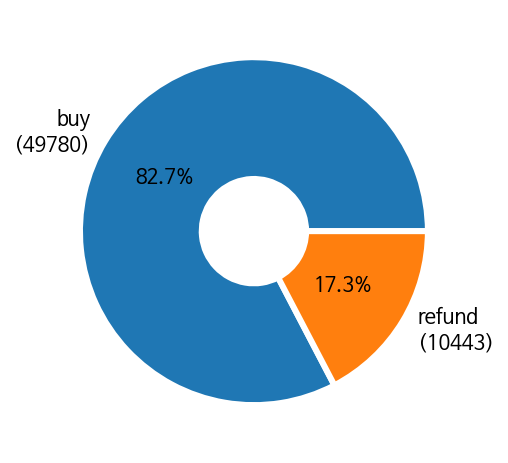

In [ ]:
# 순 구매율
p1 = len(df[df['type']=='PAYMENT']) # 총 판매량
p2 = len(df[df['purchased']==True]) # 순 구매량
a = [p2, p1-p2] #순 구매량, 환불량
labels = ['buy'+f'\n({p2})','refund'+f'\n({p1-p2})']
wedgeprops = {'width': 0.7, 'edgecolor': 'w', 'linewidth': 3}
plt.pie(a, labels=labels, autopct='%.1f%%', wedgeprops=wedgeprops)
plt.show()

**TOP 20**
- 상위 20개 강의가 전체 강의의 30%나 차지하는 것을 알 수 있다.

In [ ]:
ctt111 = pt[['course_title','category_title']].value_counts().head(20)

In [ ]:
# 가장 많이 구매한 강의 top 20
ctt = pt[['course_title','category_title']].value_counts().head(20)
ctt_lst = []
for i in range(20):
  ctt_lst.append(pt['course_title'].value_counts(normalize=True)[i]*100)

In [ ]:
ctt = pd.DataFrame(pt[['course_title','category_title']].value_counts().head(20))
ctt['percent'] = ctt_lst
ctt

,,0,percent
course_title,category_title,,
초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,1363,2.966203
초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터,프로그래밍,1357,2.953146
초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,1177,2.561424
The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,1017,2.213227
초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍,프로그래밍,783,1.703989
나의 칼퇴치트키 엑셀유치원,업무생산성,772,1.680050
올인원 패키지 : star741의 캐주얼 일러스트 드로잉,디자인,648,1.410198
초격차 패키지 : 한 번에 끝내는 엑셀 실무,업무생산성,641,1.394964
초격차 패키지 : 한번에 끝내는 디자인 툴,디자인,636,1.384083


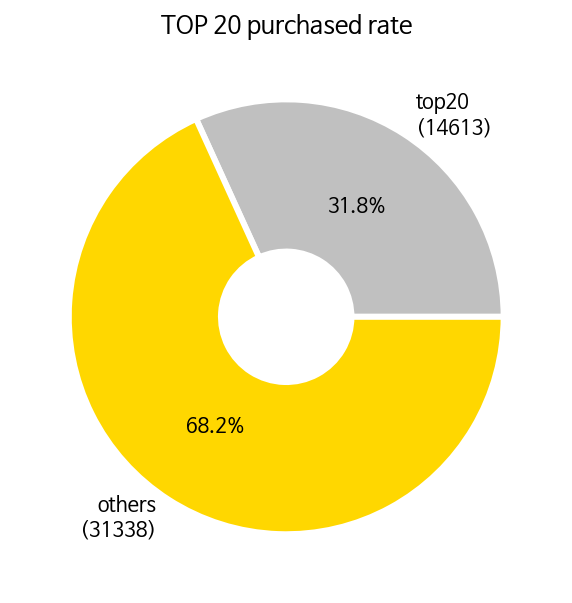

In [ ]:
# 상위 20개 강의의 구매 비율 (총 강의 개수 추가 필요)

p1 = sum(pt['course_title'].value_counts()[0:20]) # 상위 20개 구매량
p2 = sum(pt['course_title'].value_counts()[:]) # 전체 구매

a = [p1, p2-p1]
labels = ['top20'+f'\n({p1})','others'+f'\n({p2-p1})']
colors = ['silver', 'gold']
wedgeprops = {'width': 0.7, 'edgecolor': 'w', 'linewidth': 3}
plt.figure(figsize=(5,5))
plt.pie(a, labels=labels, colors=colors, autopct='%.1f%%', wedgeprops=wedgeprops)
plt.title('TOP 20 purchased rate')
plt.show()

**카테고리별 분석**
- 프로그래밍이 가장 큰 비중을 차지하고 있다.
- 상위 3개 카테고리 (프로그래밍, 데이터사이언스, 업무생산성)이 전체 구매 강의의 50% 이상 차지

In [ ]:
pt['category_title'].value_counts()

프로그래밍      14182
업무생산성       6255
데이터사이언스     6178
디자인         5397
영상/3D       4898
마케팅         4325
부동산/금융      2707
투자/재테크      1401
크리에이티브       549
지식콘텐츠         23
비즈니스          20
파이낸스          16
Name: category_title, dtype: int64

In [ ]:
pt['category_title'].value_counts().index.tolist()

['프로그래밍',
 '업무생산성',
 '데이터사이언스',
 '디자인',
 '영상/3D',
 '마케팅',
 '부동산/금융',
 '투자/재테크',
 '크리에이티브',
 '지식콘텐츠',
 '비즈니스',
 '파이낸스']

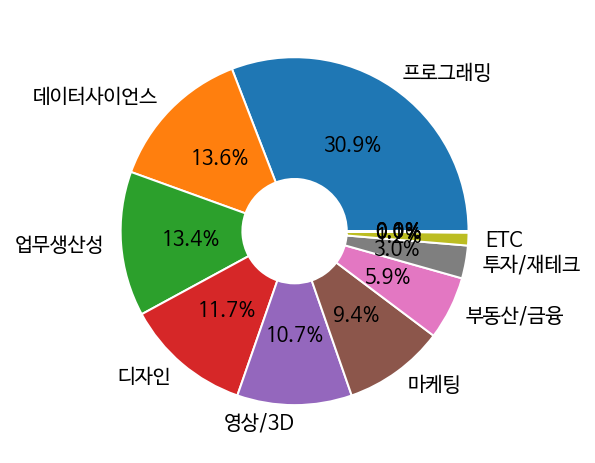

In [ ]:
# 카테고리 별 구매율
b = pt['category_title'].value_counts()

labels = ['프로그래밍','데이터사이언스','업무생산성','디자인',
 '영상/3D', '마케팅', '부동산/금융', '투자/재테크', 'ETC','','',''] 
# 가독성 문제로 '크리에이티브','지식콘텐츠','비즈니스','파이낸스' -> ETC로 대체
wedgeprops = {'width': 0.7, 'edgecolor': 'w', 'linewidth': 1}
plt.pie(b, labels=labels, autopct='%.1f%%', wedgeprops=wedgeprops)
plt.show()

### VIP

**VIP 선정 기준** 
- 구매량이 많은 순으로 선정하려 했으나, 강의를 1,2개만 구매했는데 100만원 이상 구매한 고객도 있고, 반대의 경우도 있었다.
- 'revenue' 값이 40만원 이상일 경우, 약 1561개의 값이 나오고, 전체 구매자 수의 4.46% 가량이므로 vip의 기준으로 선정

In [ ]:
# id 당 구매수
t = pt.groupby("customer_id").agg({"revenue": "sum","id":'count'}).sort_values(by=["id","revenue"], ascending=False)
t

,revenue,id
customer_id,,
98685,7040750.0,53
50769,4805950.0,38
40783,4424095.0,34
65665,2958900.0,27
20784,3445050.0,26
...,...,...
648707,0.0,1
651365,0.0,1
653145,0.0,1


In [ ]:
# 상위 5% 도출
t["revenue"].sort_values(ascending=False)[:len(t)//20]

customer_id
98685     7040750.0
50769     4805950.0
40783     4424095.0
20784     3445050.0
72501     3235150.0
            ...    
617276     376600.0
637854     376500.0
279648     376200.0
484480     376000.0
483393     376000.0
Name: revenue, Length: 1748, dtype: float64

- 실제 수익에서 상위 5퍼센트의 마지막 value를 찾고, 범위 설정

In [ ]:
# 40만원 이상 구매자 확인
t2 = t[(t["revenue"]>=400000)].sort_values(by=["revenue", "id"], ascending=False)
t2

,revenue,id
customer_id,,
98685,7040750.0,53
50769,4805950.0,38
40783,4424095.0,34
20784,3445050.0,26
72501,3235150.0,20
...,...,...
661840,401000.0,2
526317,400500.0,4
644372,400500.0,3


- 40만원을 기준으로 나누었을 때, 전체 고객 중 vip 고객의 비율이 4.46%

In [ ]:
print(f"상위 {round((len(t2)/len(t))*100, 2)}%")

상위 4.46%


In [ ]:
# 조건을 만족하는 값들 모아 'vip' column 생성
t3 = t[(t["revenue"]>=400000)].sort_values(by=["revenue", "id"], ascending=False)

def func(x):
    if x in t3.index:
        return True
    else:
        return False

pt['vip'] = pt["customer_id"].apply(func)

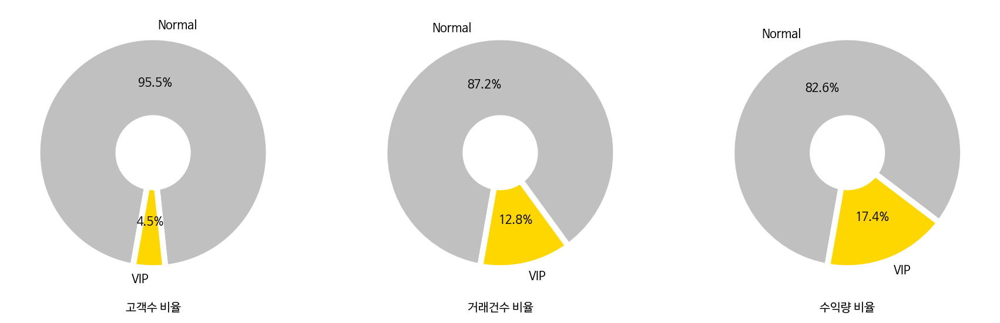

In [ ]:
# VIP 특징

t4 = pt.groupby("vip").agg({"id": "count", "revenue": "sum"})

plt.figure(figsize=(15, 5))

plt.subplot(1,3,1)
plt.pie([len(t)-len(t2), len(t2)], labels=["Normal", "VIP"], autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel("고객수 비율")

plt.subplot(1,3,2)
plt.pie(t4['id'], labels=["Normal", "VIP"], autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel("거래건수 비율")

plt.subplot(1,3,3)
plt.pie(t4['revenue'], labels=["Normal", "VIP"], autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel("수익량 비율")

plt.show()

- vip 고객이 일반 고객보다 수익이 약 5배정도 많음
- 일반 고객이 전체 수익의 82.6%, VIP는 17.4% 차지

# 판매 전략

1. 일반 고객을 vip로 만드는 전략 (순빈, 진규)
2. 일반 고객을 늘리는 전략 (지훈, 현규)
3. 기타 고객 (B2B,B2G) 늘리는 전략 (치현)

## 일반 고객 VIP로 만들기 (1)

### 목적
- vip와 normal 고객 사이의 특징을 찾고 vip고객을 더 유치시킬 수 있는 방법 찾기
- vip normal 고객이 구입한 강의들의 특징을 찾아보자 (카테고리,쿠폰 사용, 구매 시간(날짜) 등)


**사전 예상**
* **카테고리**: 차이가 없을 것으로 예상. -> 특정 카테고리가 vip고객에게 인기있다면 vip고객 유치 전략에 활용 가능

* **쿠폰 사용** : vip고객이 쿠폰을 강의 구매에 더 사용했을 것으로 예상 -> vip고객에게 높은 쿠폰 사용율이 확인되면 vip고객 확보를 위한 마케팅 목적으로 활용 가능 

* **구매시간대** : 차이가 없을 것으로 예상. -> vip고객들이 특정 날짜 or 시간대에 강의를 구매했을 경우 특정 날짜or시간에 따른 마케팅 가능 <br>※실제 데이터 차이가 있다고 해도 신뢰할 수 있는 데이터 분석 정보인가?

* **환불** : 해당 데이터셋에는 환불에 대한 단순한 수치 파악만 가능하다. **무엇 때문에 환불했는지 알 수 없음** -> 활용 불가 판단


completed_at 컬럼을 활용하여 월간 주간 일간 별로 새로운 컬럼을 만들어 구매 시간 분석에 활용

In [ ]:
data_df = pt.copy()
data_df['completed_at']= pd.to_datetime(data_df['completed_at'])

In [ ]:
data_df['Month'] = data_df['completed_at'].dt.month
data_df['Week'] = data_df['completed_at'].dt.week 
data_df['Day'] = data_df['completed_at'].dt.day

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  


In [ ]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45951 entries, 4 to 105418
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      45951 non-null  int64         
 1   customer_id             45951 non-null  int64         
 2   course_id               43973 non-null  float64       
 3   type                    45951 non-null  object        
 4   state                   45951 non-null  object        
 5   course_title            45951 non-null  object        
 6   category_title          45951 non-null  object        
 7   format                  45951 non-null  object        
 8   completed_at            45951 non-null  datetime64[ns]
 9   transaction_amount      45951 non-null  int64         
 10  coupon_title            21451 non-null  object        
 11  coupon_discount_amount  21451 non-null  float64       
 12  sale_price              45929 non-null  float

In [ ]:
data_df.head()

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,...,pg,method,subcategory_title,marketing_start_at,purchased,revenue,vip,Month,Week,Day
4,970658,478028,201797.0,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무생산성,올인원,2021-03-28 15:21:54,97500,...,NaN,CARD,PPT/보고서,2019-11-14,True,97500.0,False,3,12,28
8,970669,478033,203178.0,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-03-28 15:26:47,96000,...,NaN,CARD,영상 편집,2020-12-02,True,96000.0,False,3,12,28
10,970671,469860,203644.0,PAYMENT,COMPLETED,올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 기초(평생소장),부동산/금융,올인원,2021-03-28 15:27:17,263000,...,NaN,CARD,부동산/금융,2020-11-27,True,263000.0,False,3,12,28
18,970682,478031,NaN,PAYMENT,COMPLETED,프로모션 : 기초부터 시작하는 데이터분석 한끝세트 (3월 프리패스),데이터사이언스,올인원,2021-03-28 15:33:28,299000,...,NaN,CARD,데이터사이언스,NaT,True,299000.0,False,3,12,28
22,970695,455311,203146.0,PAYMENT,COMPLETED,The RED : 현실 세상의 TDD by 이규원,프로그래밍,RED,2021-03-28 15:43:59,149500,...,NaN,CARD,DevOps,2021-02-08,True,149500.0,False,3,12,28


In [ ]:
# VIP와 Normal고객을 각각의 테이블로 분리
vip_df = pt[pt['vip']==True]
vip_df = vip_df.sort_values(by='category_title', ascending=True)

normal_df = pt[pt['vip']==False]
normal_df = normal_df.sort_values(by='category_title', ascending=True)

### 구매 시간 분석 (월간 주간 일간)

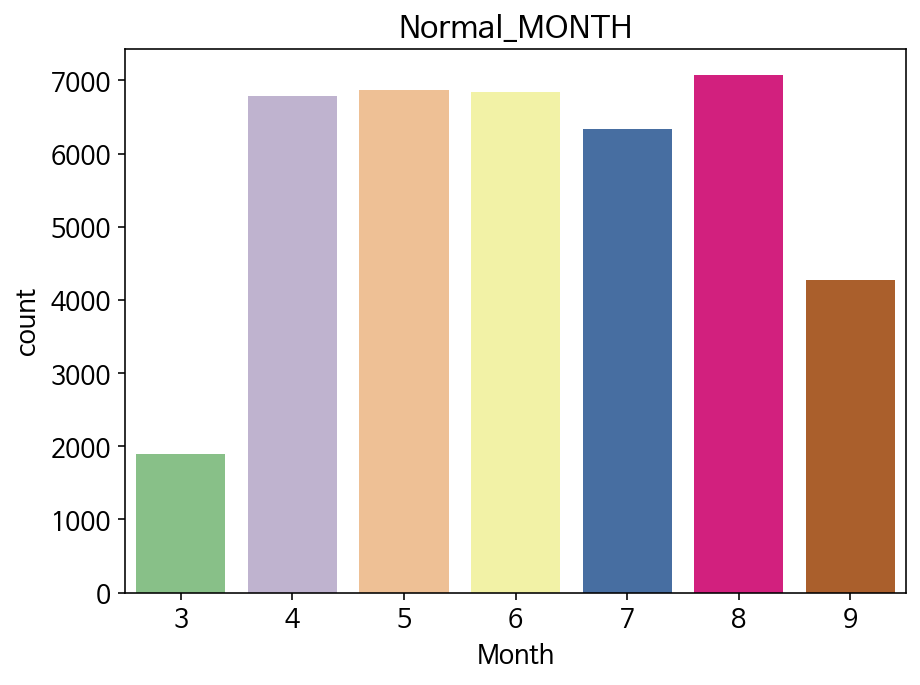

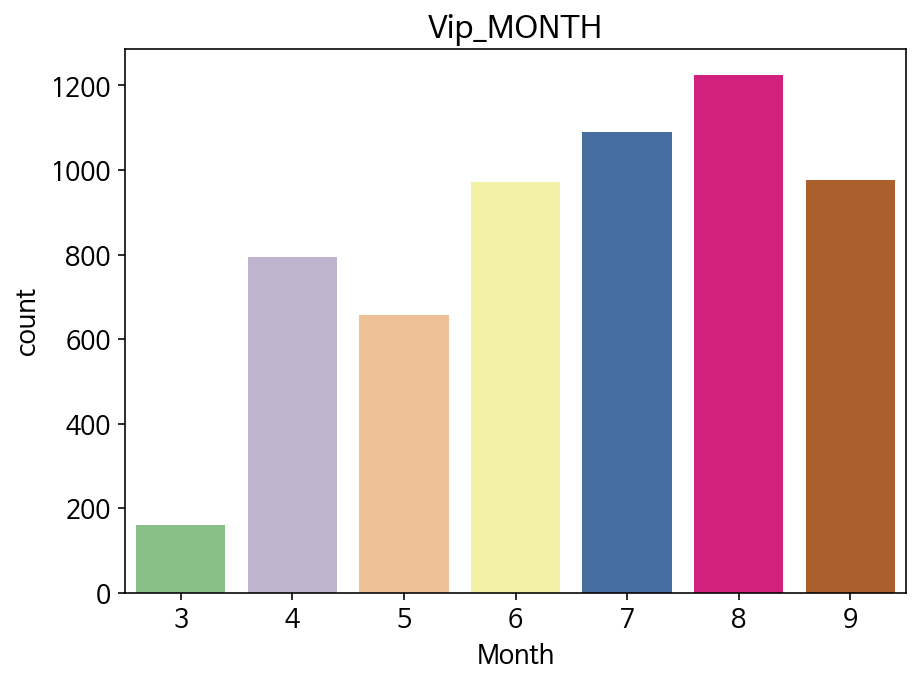

In [ ]:
#월간 구매량
plt.figure(figsize=(7, 5))
plt.rc('font', size=13)
sns.countplot(x="Month", palette='Accent',data=data_df[data_df['vip']==False])
plt.title('Normal_MONTH')
plt.show()

plt.figure(figsize=(7, 5))
plt.rc('font', size=13)
sns.countplot(x="Month", palette='Accent',data=data_df[data_df['vip']==True])
plt.title('Vip_MONTH')
plt.show()

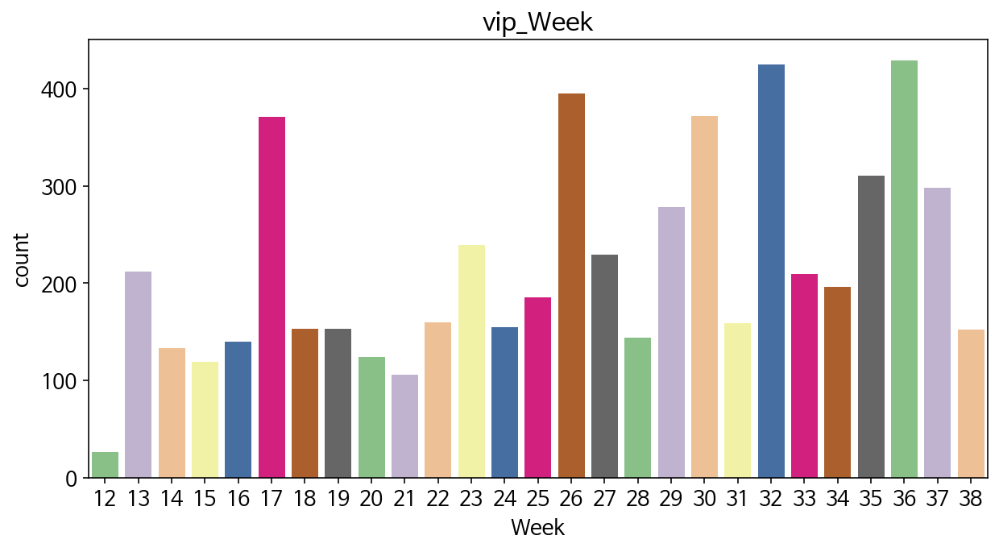

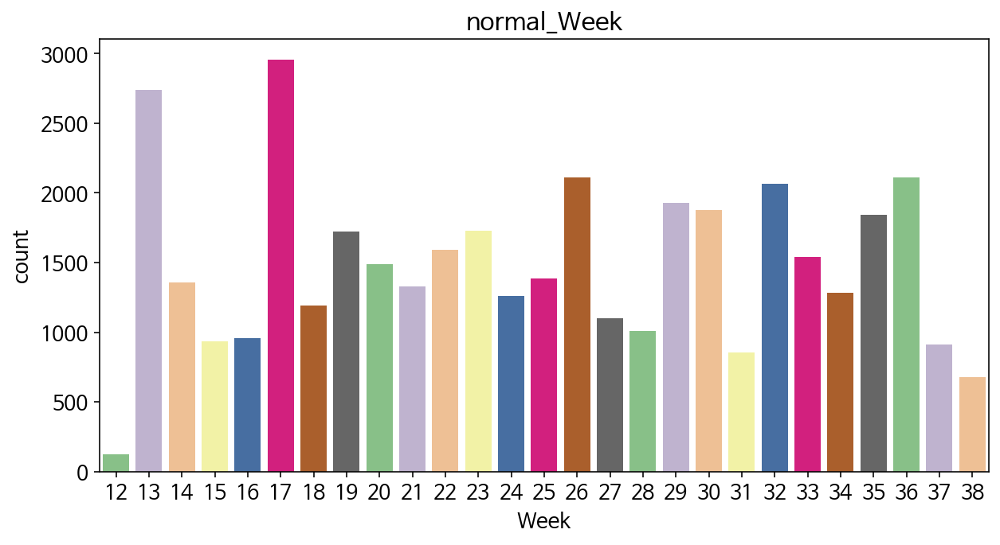

In [ ]:
#주간 구매량
plt.figure(figsize=(10, 5))
plt.rc('font', size=13)
sns.countplot(x="Week", palette='Accent',data=data_df[data_df['vip']==True])
plt.title('vip_Week')
plt.show()


plt.figure(figsize=(10, 5))
plt.rc('font', size=13)
sns.countplot(x="Week", palette='Accent',data=data_df[data_df['vip']==False])
plt.title('normal_Week')
plt.show()


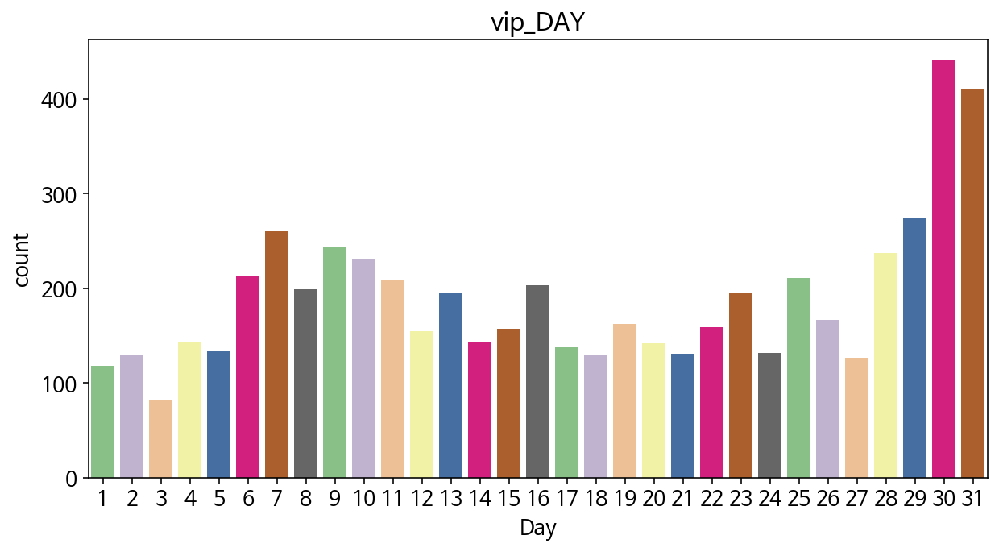

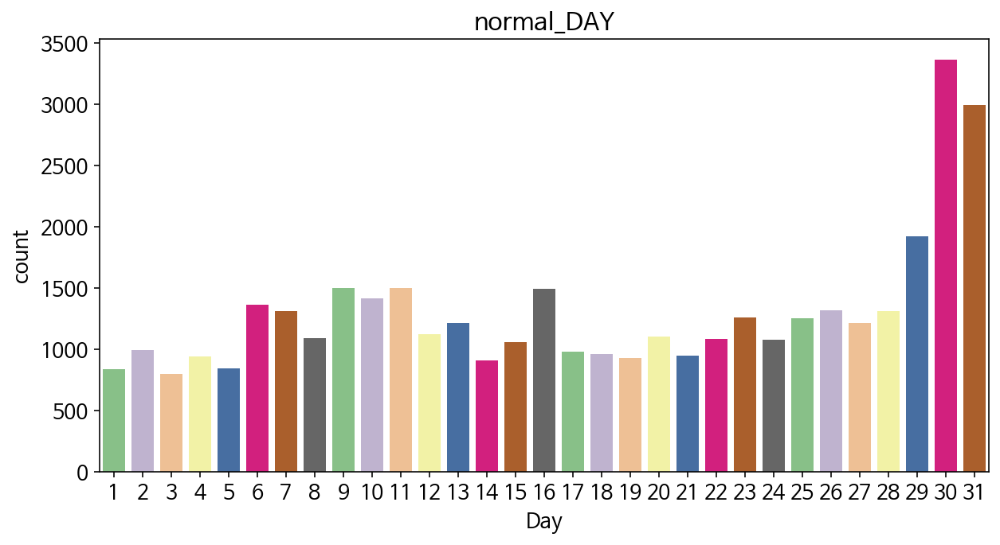

In [ ]:
#일간 평균 구매량
plt.figure(figsize=(10, 5))
plt.rc('font', size=13)
sns.countplot(x="Day", palette='Accent',data=data_df[data_df['vip']==True])
plt.title('vip_DAY')
plt.show()

plt.figure(figsize=(10, 5))
plt.rc('font', size=13)
sns.countplot(x="Day", palette='Accent',data=data_df[data_df['vip']==False])
plt.title('normal_DAY')
plt.show()

**정리 :** 
* vip고객과 normal고객의 구매 시점(월간 주간 일간)의 그래프가 거의 동일한 결과를 보인다. <br> 시간에 따른 vip고객과 normal고객 간의 차이는 없다. 

### 카테고리 분석

Text(0.5, 1.0, 'normal_category_title')

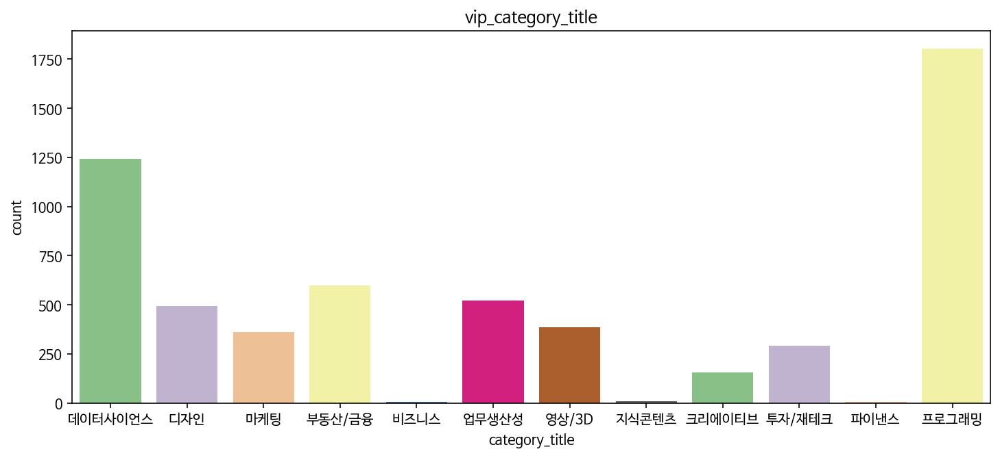

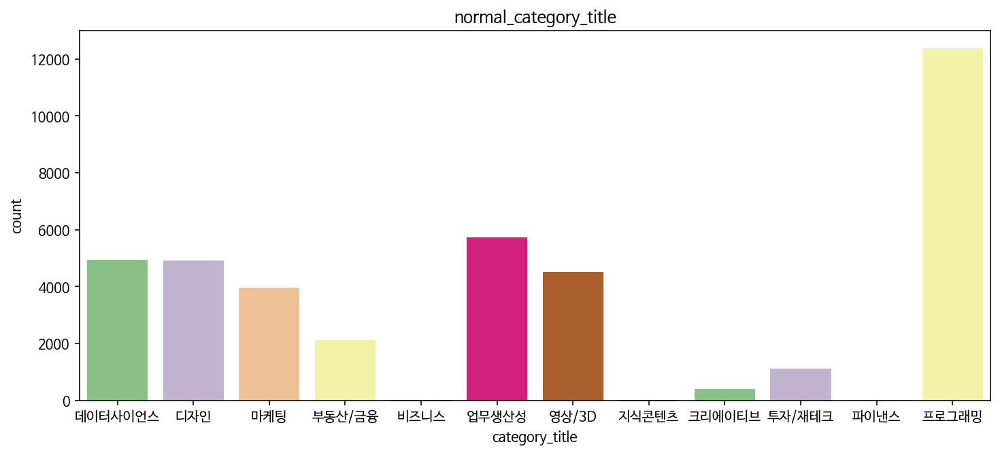

In [ ]:
plt.figure(figsize=(12, 5))
plt.rc('font', size=10)
sns.countplot(x="category_title", palette='Accent',data=vip_df)
plt.title('vip_category_title')

plt.figure(figsize=(12, 5))
plt.rc('font', size=10)
sns.countplot(x="category_title", palette='Accent',data=normal_df)
plt.title('normal_category_title')

* vip와 normal고객에게 가장 인기있는 강의 TOP 30 중에서 서로 중복되는 강좌는?
<br>

In [ ]:
#vip 인기 강의 TOP 30 (course_title)
vip_df2 = vip_df.copy()
vip_df2_ranked = vip_df2.groupby("course_title").agg({"revenue": "sum", "id": "count"}).sort_values(by='id', ascending=False)
vip_df2_ranked = vip_df2_ranked.iloc[:30,:]
vip_course_title_list = vip_df2_ranked.index
vip_df2_ranked = vip_df2_ranked.reset_index()
vip_df2_ranked

,course_title,revenue,id
0,올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 심화 (수강시간...,29674900.0,95
1,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,9487100.0,86
2,초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발,9217800.0,85
3,올인원 패키지 : 권오상의 금융 아카데미 - 권오상 회계사의 자금조달 분석 및 가치...,23071800.0,83
4,초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍,5652400.0,77
5,올인원 패키지 : 박세익 전무에게 배우는 주식 시장 분석 & 포트폴리오 운용 전략,21283200.0,75
6,올인원 패키지 : 김민태의 프론트엔드 아카데미 : 제 1강 JavaScript & ...,8210200.0,73
7,초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터,7381600.0,70
8,초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영,7875200.0,68
9,"올인원 패키지 : 김기현의 BERT, GPT-3를 활용한 자연어처리",9486000.0,64


In [ ]:
#Normal 인기 강의 TOP 30 (couse_title)
normal_df2 = normal_df.copy()
normal_df2_ranked = normal_df2.groupby("course_title").agg({"revenue": "sum", "id": "count"}).sort_values(by='id', ascending=False)
normal_df2_ranked = normal_df2_ranked.iloc[:30,:]

normal_course_title_list = normal_df2_ranked.index

normal_df2_ranked = normal_df2_ranked.reset_index()
normal_df2_ranked

,course_title,revenue,id
0,초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터,107043025.0,1287
1,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,139089300.0,1277
2,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,115279500.0,1128
3,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,150255500.0,992
4,나의 칼퇴치트키 엑셀유치원,85842000.0,735
5,초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍,34547100.0,706
6,올인원 패키지 : star741의 캐주얼 일러스트 드로잉,85028200.0,619
7,초격차 패키지 : 한 번에 끝내는 엑셀 실무,52743800.0,605
8,초격차 패키지 : 한번에 끝내는 디자인 툴,83844400.0,587
9,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,42591550.0,551


In [ ]:
intersection_course_title = normal_course_title_list & vip_course_title_list
print('중복되는 강좌의 수 : ',len(intersection_course_title),'개')
print(intersection_course_title)

중복되는 강좌의 수 :  14 개
Index(['초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터', '초격차 패키지 : 한 번에 끝내는 프론트엔드 개발',
       '초격차 패키지 : 한번에 끝내는 영상 촬영과 편집', '초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍',
       '초격차 패키지 : 한번에 끝내는 디자인 툴', '초격차 패키지 : 한 번에 끝내는 데이터 분석 툴',
       '초격차 패키지 : 일잘러 필수 스킬 모음.zip',
       '올인원 패키지 : 김민태의 프론트엔드 아카데미 : 제 1강 JavaScript & TypeScript Essential',
       '초격차 패키지 : 한번에 끝내는 UX/UI 디자인', '올인원 패키지 : 완전정복 시각디자인 기초',
       '초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin',
       '초격차 패키지 : 한 번에 끝내는 코딩테스트 369 Java편',
       '올인원 패키지 : 박세익 전무에게 배우는 주식 시장 분석 & 포트폴리오 운용 전략',
       '초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발'],
      dtype='object', name='course_title')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead
  """Entry point for launching an IPython kernel.


**서로 중복되는 카테고리와 강의명** 

|Categories|course_name|
|:---|:---|
|프로그래밍|초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터|
|프로그래밍|초격차 패키지 : 한 번에 끝내는 프론트엔드 개발|
|프로그래밍|초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발|
|프로그래밍|초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍|
|프로그래밍|초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin
|프로그래밍|올인원 패키지 : 김민태의 프론트엔드 아카데미 : 제 1강 JavaScript & TypeScript Essential
|
|디자인|초격차 패키지 : 한번에 끝내는 UX/UI 디자인|
|디자인|올인원 패키지 : 완전정복 시각디자인 기초|
|
|데이터사이언스|초격차 패키지 : 한 번에 끝내는 데이터 분석 툴|
|업무생산성|초격차 패키지 : 일잘러 필수 스킬 모음.zip|
|투자/재테크|올인원 패키지 : 박세익 전무에게 배우는 주식 시장 분석 & 포트폴리오 운용 전략|
|영상/3D|초격차 패키지 : 한번에 끝내는 영상 촬영과 편집|


- 프로그래밍 : 6개
- 디자인 : 2개
- 데이터사이언스 : 1개
- 업무생산성 : 1개
- 투자/재태크 : 1개
- 영상/3D : 1개

**결과**


* vip와 normal고객 각각의 인기 강의와 그 중 중복되는 강의의 카테고리를 비교했을 때 프로그래밍 카테고리의 강의의 비율이 압도적으로 가장 높았다.
* 단, 그래프를 통해 두 고객군을 비교했을 때 normal 고객은 프로그래밍과 함께 전반적으로 다양한 카테고리에 대해 관심이 있으며, vip고객의 경우 프로그래밍과 데이터사이언스 카테고리에 초점이 맞춰져있었다.

### 쿠폰

In [ ]:
vip_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5872 entries, 105406 to 69871
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      5872 non-null   int64         
 1   customer_id             5872 non-null   int64         
 2   course_id               5220 non-null   float64       
 3   type                    5872 non-null   object        
 4   state                   5872 non-null   object        
 5   course_title            5872 non-null   object        
 6   category_title          5872 non-null   object        
 7   format                  5872 non-null   object        
 8   completed_at            5872 non-null   datetime64[ns]
 9   transaction_amount      5872 non-null   int64         
 10  coupon_title            2030 non-null   object        
 11  coupon_discount_amount  2030 non-null   float64       
 12  sale_price              5870 non-null   fl

In [ ]:
vip_df['coupon_title'].notnull().sum()

2030

In [ ]:
vip_df['coupon_title'].isnull().sum()

3842

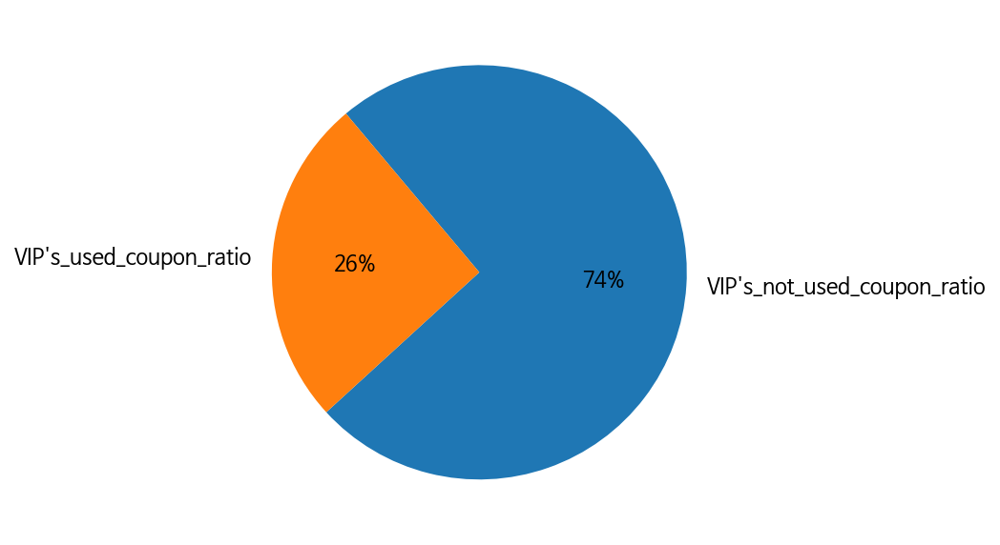

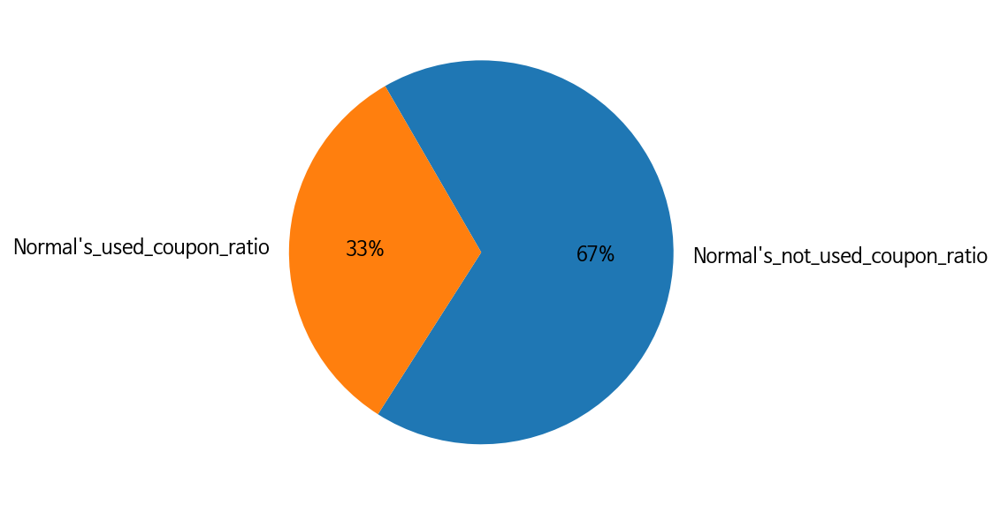

In [ ]:
#쿠폰 사용율
#전체인원수 / 쿠폰 사용자 수 
ratio = [len(vip_df), vip_df['coupon_title'].notnull().sum()]
labels = ["VIP's_not_used_coupon_ratio", "VIP's_used_coupon_ratio"]
plt.figure(figsize=(7, 5))
plt.rc('font', size=11)
plt.pie(ratio, labels=labels, autopct='%.0f%%', startangle=130, counterclock=False)
plt.show()

ratio2 = [len(normal_df), normal_df['coupon_title'].notnull().sum()]
labels2 = ["Normal's_not_used_coupon_ratio", "Normal's_used_coupon_ratio"]
plt.figure(figsize=(7, 5))
plt.rc('font', size=11)
plt.pie(ratio2, labels=labels2, autopct='%.0f%%', startangle=120, counterclock=False)
plt.show()

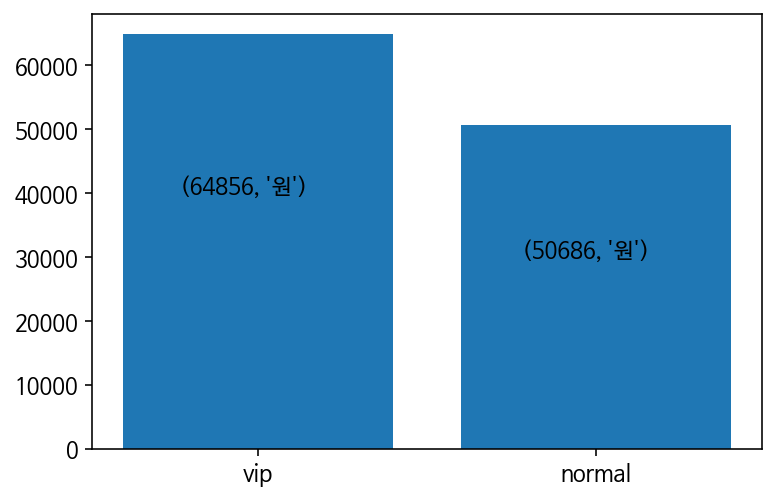

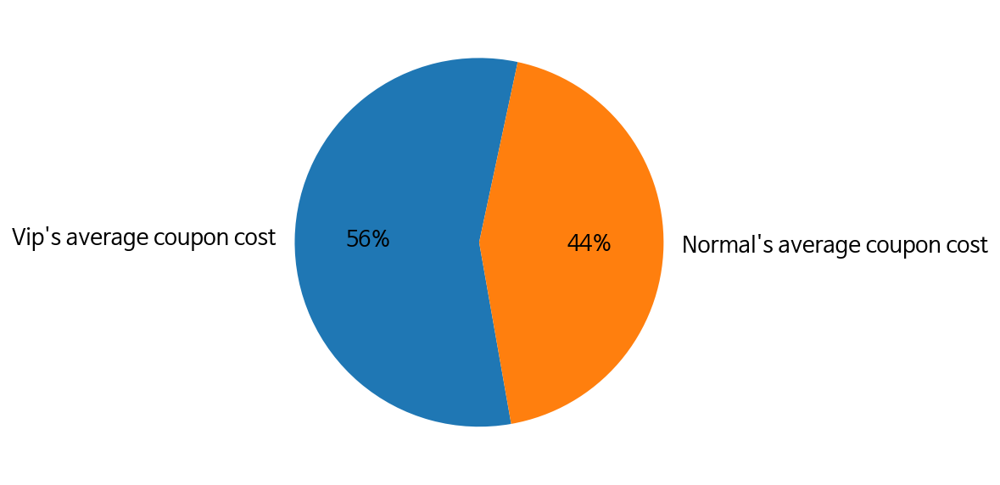

In [ ]:
#1인당 쿠폰 사용 금액
#총 쿠폰 사용 금액 / 쿠폰 사용자 수 
x = [1,2]
years = ['vip', 'normal']
values = [(vip_df['coupon_discount_amount'].sum() / vip_df['coupon_title'].notnull().sum()) , (normal_df['coupon_discount_amount'].sum() / normal_df['coupon_title'].notnull().sum()) ]

plt.bar(x, values)
plt.xticks(x, years)
plt.text(0.77,40000, (round(vip_df['coupon_discount_amount'].sum() / vip_df['coupon_title'].notnull().sum()),'원'))
plt.text(1.78,30000, (round(normal_df['coupon_discount_amount'].sum() / normal_df['coupon_title'].notnull().sum()),'원'))
plt.show()

ratio2 = [round(vip_df['coupon_discount_amount'].sum() / vip_df['coupon_title'].notnull().sum()), round(normal_df['coupon_discount_amount'].sum() / normal_df['coupon_title'].notnull().sum())]
labels2 = ["Vip's average coupon cost", "Normal's average coupon cost"]
plt.figure(figsize=(9, 5))
plt.rc('font', size=13)
plt.pie(ratio2, labels=labels2, autopct='%.0f%%', startangle=-80, counterclock=False)
plt.show()

In [ ]:
#전체 대상, 가장 많이 사용된 쿠폰 종류
df_coupon = df.groupby("coupon_title").agg({ "id": "count"}).sort_values(by='id', ascending=False)
df_coupon = df_coupon.reset_index()
df_coupon.head(10)

,coupon_title,id
0,[웰컴쿠폰] 올인원 패키지 2만원 할인 쿠폰,5498
1,[WELCOME] 온라인 강의 3만원 할인쿠폰,3206
2,[웰컴쿠폰] 올인원 패키지 1만원 할인 쿠폰,2469
3,[WELCOME] 온라인 강의 2만원 할인쿠폰,2325
4,[WELCOME] 온라인 강의 1만원 할인쿠폰,1900
5,8월 1+1 프로모션 쿠폰,1458
6,4월 1+1 페이백 이벤트 쿠폰,1350
7,[웰컴쿠폰] 올인원 패키지 3만원 할인 쿠폰,1284
8,[미래투자금] 온라인 강의 2만원 할인쿠폰,1274
9,5월 페이백 프로모션 쿠폰,1126


In [ ]:
#VIP대상, 가장 많이 사용된 쿠폰 종류
vip_coupon = vip_df.groupby("coupon_title").agg({ "id": "count"}).sort_values(by='id', ascending=False)
vip_coupon = vip_coupon.reset_index()
vip_coupon.head(10)

,coupon_title,id
0,8월 1+1 프로모션 쿠폰,230
1,7월 100% 페이백 프로모션 쿠폰,141
2,[WELCOME] 온라인 강의 1만원 할인쿠폰,129
3,[웰컴쿠폰] 올인원 패키지 1만원 할인 쿠폰,129
4,5월 페이백 프로모션 쿠폰,123
5,[웰컴쿠폰] 올인원 패키지 2만원 할인 쿠폰,118
6,4월 1+1 페이백 이벤트 쿠폰,117
7,[WELCOME] 온라인 강의 2만원 할인쿠폰,68
8,[WELCOME] 온라인 강의 3만원 할인쿠폰,66
9,[웰컴쿠폰] 올인원 패키지 3만원 할인 쿠폰,55


In [ ]:
#Normal대상, 가장 많이 사용된 쿠폰 종류
normal_coupon = normal_df.groupby("coupon_title").agg({ "id": "count"}).sort_values(by='id', ascending=False)
normal_coupon = normal_coupon.reset_index()
normal_coupon.head(10)

,coupon_title,id
0,[웰컴쿠폰] 올인원 패키지 2만원 할인 쿠폰,3562
1,[WELCOME] 온라인 강의 3만원 할인쿠폰,1972
2,[웰컴쿠폰] 올인원 패키지 1만원 할인 쿠폰,1577
3,[WELCOME] 온라인 강의 2만원 할인쿠폰,1513
4,[WELCOME] 온라인 강의 1만원 할인쿠폰,1153
5,4월 1+1 페이백 이벤트 쿠폰,1042
6,8월 1+1 프로모션 쿠폰,1024
7,5월 페이백 프로모션 쿠폰,850
8,[미래투자금] 온라인 강의 2만원 할인쿠폰,788
9,7월 100% 페이백 프로모션 쿠폰,787


**정리** 
* 쿠폰 사용량은 vip 고객과 normal 고객의 각각 28%, 32%로 30% 전 후 양상을 보이며 서로 큰 차이가 없어보인다.

* 1인 쿠폰 사용금액량에서는 vip고객이 약68,000원 normal  고객이 약 51,000원으로 vip고객이 normal 고객에 비해 30% 높은 결과가 나타났다.

* vip 고객이 가장 많이 사용한 쿠폰의 종류는 프로모션 쿠폰과 금액 할인권이 있다. 전반적으로 한쪽에 크게 치우지지 않는 경향을 보인다.

* normal 고객이 사용한 쿠폰의 종류에서 1위~5위의 금액 할인권이 전체의48%를 차지할 정도로 압도적으로 많다.  

### 결론
* 시간에 따른 구매 차이는 없다.
* vip normal 고객 모두 프로그래밍 카테고리는 가장 선호하며, 전반적으로 normal 고객군은 다양한 카테고리를 구입하는 경향이 있고, vip 고객군은 프로그래밍 & 데이터사이언스 카테고리에 더 집중된 구매 성향을 보인다.
* 쿠폰은 두 고객군 모두 비슷한 사용율을 보였으며, vip 고객군은 프로모션&금액 할인과 관련된 쿠폰 종류를 많이 사용한 반면, normal 고객군에서는 1위 부터 5위 까지가 금액할인과 관련된 쿠폰이다.

## 일반 고객 VIP로 만들기 (2)

### 타겟 설정

**vip에 근접한 타겟 분석**
- 고객들 중 vip에 가까운 고객들을 타겟으로 지정
- 특징 종합하여 vip로 만들기 위한 전략 제시 

**근접 타겟 분석**
- 현재 vip 기준은 revenue (순 이익 금액) 40만원 이상
- 기준에 부합하지 못했으나, 기준에 가장 근접한 대상들을 타겟으로 선정.
- 30~40만원 사이 결제한 고객들을 분석하여 이들의 관심사, 카테고리 등을 도출

- target 숫자는 약 4.9%, vip와 비슷

In [ ]:
tt1 = pt.groupby("customer_id").agg({"revenue": "sum","id":'count'}).sort_values(by=["revenue", "id"], ascending=False)

In [ ]:
# 조건을 만족하는 값들 모아 'pre_vip' column 생성, target 지정
tt2 = t[(t['revenue']>=300000)&(t['revenue']<400000)].sort_values(by=["revenue", "id"], ascending=False)

def func(x):
    if x in tt2.index:
        return True
    else:
        return False

pt['pre_vip'] = pt["customer_id"].apply(func)
target = pt[pt['pre_vip']==True]

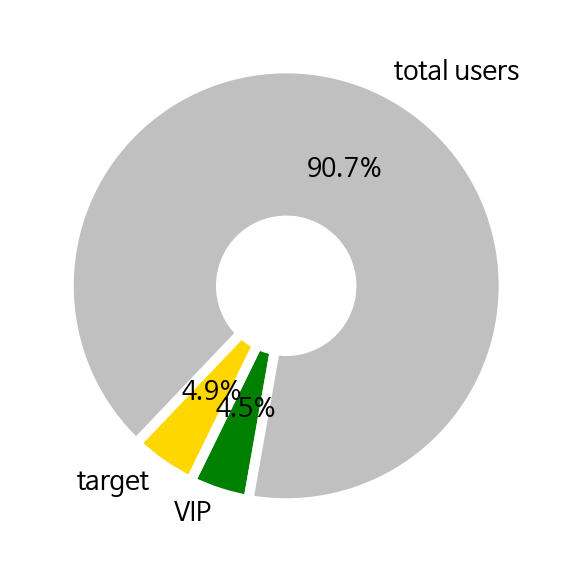

In [ ]:
# 전체 비율의 약 4.9%
plt.figure(figsize=(5, 5))
colors = ['green','gold','silver']
plt.pie([len(t2),len(tt2), len(t)-len(tt2)-len(t2)], labels=["VIP","target", "total users"], autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.show()

### 타겟 분석

- 카테고리

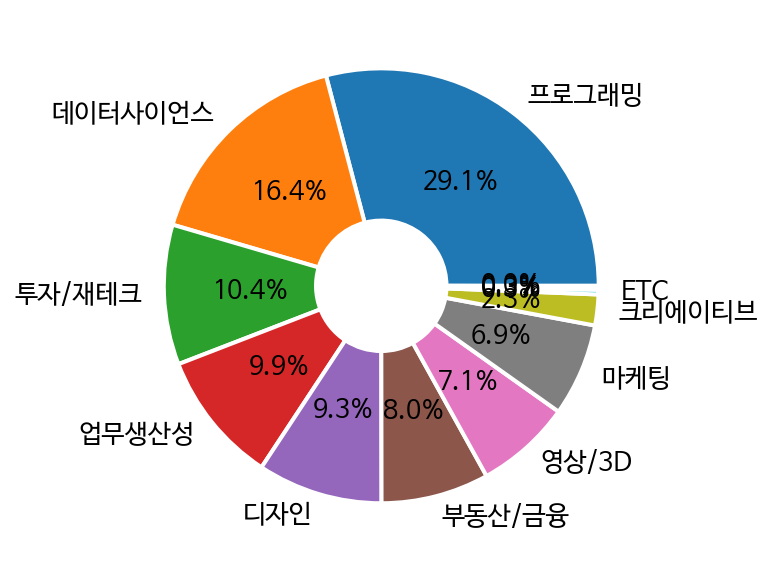

In [ ]:
# 전체적인 카테고리별 판매량과 유사한 패턴을 가짐
ttt = target['category_title'].value_counts()

plt.figure(figsize=(5, 5))
a = ['프로그래밍','데이터사이언스','투자/재테크','업무생산성','디자인','부동산/금융',
 '영상/3D','마케팅','크리에이티브','ETC','',''] # 가독성을 위해 '비즈니스','파이낸스','지식콘텐츠' -> ETC로 대체
wedgeprops = {'width': 0.7, 'edgecolor': 'w', 'linewidth': 2}
plt.pie(ttt, labels=a, autopct='%.1f%%', wedgeprops=wedgeprops)

plt.show()

- 세부 카테고리

In [ ]:
# 세부 카테고리 조사, 조사를 위해 새로운 column 생성
aaaa = target.groupby("subcategory_title").agg({"id": "count"}).sort_values(by='id', ascending=False)
aaaa["target_category"] = ""
aaaa["target_category"][:10] = target["subcategory_title"].value_counts()[:10].index.to_list()
aaaa["target_category"][10:] = "etc"

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [ ]:
# TOP10 세부 카테고리를 추리기 위해 다시 그룹 만듦
a2222 = aaaa.groupby("target_category").agg({"id": "sum"}).sort_values(by='id', ascending=False)

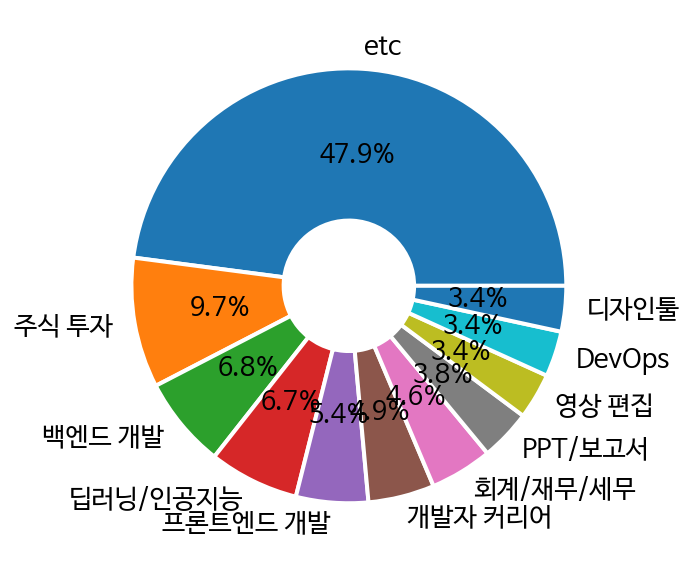

In [ ]:
# 세부 카테고리 TOP10, 단일 비율은 주식 투자, 크리에이티브가 가장 높음

plt.figure(figsize=(5, 5))
# TOP 10 외 항목은 ETC로 대체
wedgeprops = {'width': 0.7, 'edgecolor': 'w', 'linewidth': 2}
plt.pie(a2222["id"],labels=a2222.index,autopct='%.1f%%', wedgeprops=wedgeprops)

plt.show()

- TOP 10

In [ ]:
# 가장 많이 들은 강좌 TOP 10
target['course_title'].value_counts().head(10)

올인원 패키지 : 박세익 전무에게 배우는 주식 시장 분석 & 포트폴리오 운용 전략                 236
초격차 패키지 : 한 번에 끝내는 프론트엔드 개발                                    72
올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 심화 (수강시간 제한)             71
초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터                         65
올인원 패키지 : 15명의 전문 애널리스트에게 배우는 산업&매크로 분석과 투자 전략                 65
올인원 패키지 : 권오상의 금융 아카데미 - 권오상 회계사의 자금조달 분석 및 가치평가 (수강시간 제한)     54
올인원 패키지 : 완전정복 시각디자인 기초                                        52
초격차 패키지 : 일잘러 필수 스킬 모음.zip                                     44
초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발                                    42
초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍                             41
Name: course_title, dtype: int64

- 소비 패턴 (소비 금액, 강의 갯수, 쿠폰 사용 등)

In [ ]:
# target의 평균 소비 금액
# 평균적으로 33.7만원 정도 소비
target['revenue'].sum()/target['customer_id'].nunique()

337475.1437793427

In [ ]:
# 강의 한 개당 평균 가격은 29.5만원 선
target['sale_price'].sum()/target['course_id'].nunique()

2956612.727272727

In [ ]:
# 타겟 유저들의 평균 강의 수강 수
print(f"purchased_counts: \n{target['customer_id'].value_counts()}")
print('')
print(f"user_counts: {target['customer_id'].nunique()}")
print('')
print(f"lecture_counts_rate: {len(target)/target['customer_id'].nunique()}")

purchased_counts: 
495383    7
515059    7
279483    7
494310    6
444486    6
         ..
624029    1
77604     1
623774    1
538391    1
12719     1
Name: customer_id, Length: 1704, dtype: int64

user_counts: 1704

lecture_counts_rate: 2.0252347417840375


In [ ]:
target['coupon_title'].value_counts()

[웰컴쿠폰] 올인원 패키지 2만원 할인 쿠폰                      121
8월 1+1 프로모션 쿠폰                                111
[WELCOME] 온라인 강의 1만원 할인쿠폰                     105
[미래투자금] 온라인 강의 2만원 할인쿠폰                        83
[WELCOME] 온라인 강의 3만원 할인쿠폰                      82
                                             ... 
[재결제쿠폰]올인원 패키지 : 딥러닝을 활용한 추천시스템 구현              1
[할인쿠폰] 재테크 카테고리 AOP 30% 할인 (금융 아카데미 제외)         1
[시크릿쿠폰] 산돌 런칭기념 30% 할인쿠폰                        1
[할인 쿠폰] 게임 개발자 취업의 모든 것 20% 할인                  1
[20%할인] The RED : Hadoop & Spark 아키텍처 딥다이브      1
Name: coupon_title, Length: 99, dtype: int64

In [ ]:
# 쿠폰 사용 여부
# 66% 정도가 쿠폰을 써서 결제한 사실을 알 수 있다.
print(f"coupon_used : {target['coupon_title'].isna().sum()}")
print(f"used_rate : {(target['coupon_title'].isna().sum())/len(target)*100}%")

coupon_used : 2295
used_rate : 66.50246305418719%


In [ ]:
# 쿠폰 할인 비율
# 11.6% 정도 할인 받은 사실을 알 수 있다.
print(f"purchased_amount: {target['revenue'].sum()}")
print(f"coupon_discount_amount: {target['coupon_discount_amount'].sum()}")
print(f"coupon_discount_amount_rate: {target['coupon_discount_amount'].sum()/target['revenue'].sum()*100}%")

purchased_amount: 575057645.0
coupon_discount_amount: 66696855.0
coupon_discount_amount_rate: 11.598290289663048%


In [ ]:
# 타겟들의 결제 방식
print(target['pg'].value_counts())
print()
print(target['method'].value_counts())

INICIS    2024
KAKAO      578
NAVER      396
PAYCO      141
CHAI         3
Name: pg, dtype: int64

CARD         2569
POINT         474
VBANK         189
PROMOTION     105
TRANSFER       67
TRANS          45
ONSITE          2
Name: method, dtype: int64


**정리**
- 카테고리별 판매량은 전체적인 판매량과 비슷
- 세부 카테고리 조사 결과, 단일 주제로는 주식 시장 분석 강의가 수요가 가장 많았음 -> pre_vip 공략을 위한 주식 관련 강의 증강
- vip 목표 금액은 40만원 선이고, 현재 pre_vip의 평균 소비 금액은 33.7만원 선 -> 소비를 촉진하기 위한 전략 필요
- 강의 한 개당 평균 가격은 29.5만원 선 -> 평균 소비 금액과 차이가 크지 않음
- pre_vip는 평균적으로 2개 정도의 강의를 수강 
- pre_vip가 많이 사용한 쿠폰 중에 1+1 쿠폰이 있음 -> 쿠폰을 사용해 2개 이상의 강의를 많이 사용했다고 볼 수 있음
- pre_vip의 66% 정도가 쿠폰을 사용하였고, 이들은 합하여 11.6% 정도 할인을 받았다.

###**결론**
- pre_vip의 평균 소비 금액은 33.7만원 선으로, 조금만 더 소비를 촉진한다면 충분히 vip가 될 수 있다.
- 단일 강의로서 주식이 인기가 많으니, 퀄리티 좋은 주식 강의를 몇 개 런칭해서 공급을 늘리면 결제를 늘릴 수 있다.
- pre_vip는 쿠폰을 적극적으로 사용하는 편이다. 해당 강의를 결제 시 추가로 쿠폰을 주는 전략을 사용하면 vip 숫자를 늘릴 수 있을 것이라 생각한다.

## 일반 고객 늘리기 (1)

- 일반적인 고객의 특성을 파악하고 insight를 도출

#### format 분석

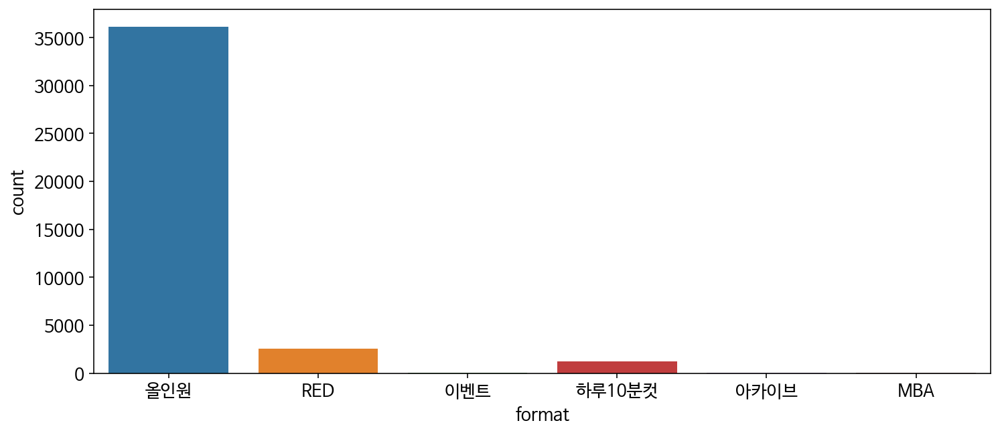

In [ ]:
plt.figure(figsize=(12,5))
sns.countplot(x=pt[pt['vip']==False]['format'],data=pt)
plt.show()

- 올인원의 인기가 가장 많음
- 올인원에 속한 강의나 카테고리 확인해보기

In [ ]:
# vip 아닌 고객들의 category 조사
all_cnt = pt[(pt['vip']==False)&(pt['format']=='올인원')]['category_title']

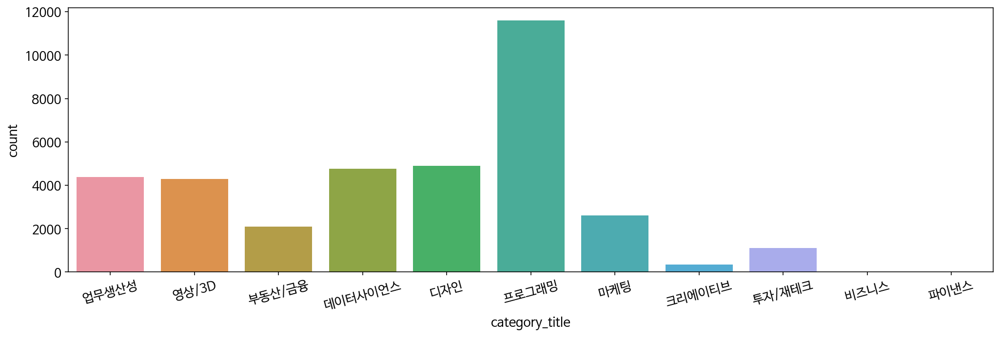

In [ ]:
plt.figure(figsize=(17,5))
plt.xticks(rotation = 15)
sns.countplot(x=all_cnt,data=pt)

- 프로그래밍이 다른 카테고리에 비해 2~3배 이상 구매율이 좋다
- 많은 수강생이 프로그래밍에 관심이 있다고 생각되며, 프로그래밍 카테고리의 다른 강의를 판매한다면 다른 카테고리에 비해 더 많은 구매율을 얻을 수 있을 것이라 판단됨.

- 프로그래밍 강의 중에서 세부적으로 확인을 해볼 필요가 있다고 생각함.

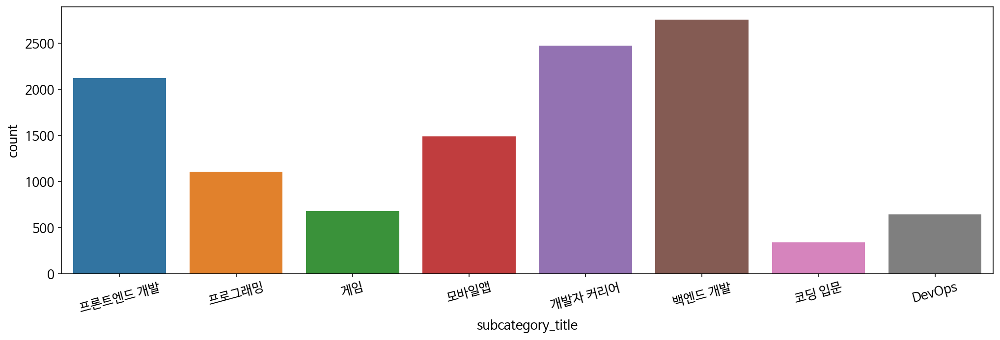

In [ ]:
sub_cnt = pt[(pt['vip']==False)&(pt['format']=='올인원')&(pt['category_title']=='프로그래밍')]['subcategory_title']

plt.figure(figsize=(17,5))
plt.xticks(rotation = 15)
sns.countplot(x=sub_cnt,data=pt)

- 위 그래프로 보아 어느정도 프로그래밍에 대해 이미 알고 강의를 구매하는 수강생이 주를 이루는 것으로 보인다.
- 강의영상의 방향성도 알 수 있을 것 같다.

#### completed_at 분석

In [ ]:
# 날짜를 일 단위까지 정리하기.
def func(x):
    return x.strftime("%Y-%m-%d")

pt["completed_at"] = pt["completed_at"].apply(func)

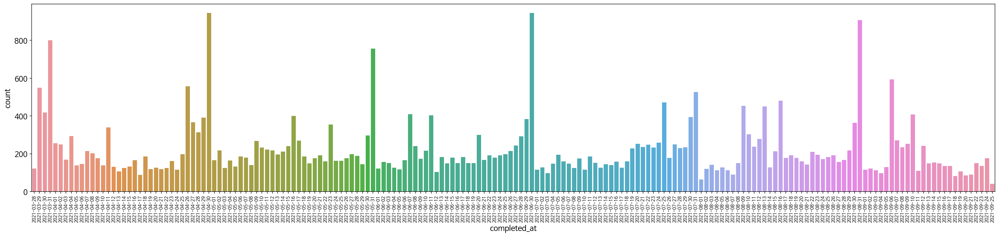

In [ ]:
plt.figure(figsize=(30,6))
plt.xticks(size=8, rotation = 90)
sns.countplot(x=pt[pt['vip']==False]['completed_at'],data=pt)

- 매달 말에 아주 높은 구매 그래프를 확인 할 수 있다.
- 매달 말에 구매율이 높은 이유 찾기

#### coupon_title 분석

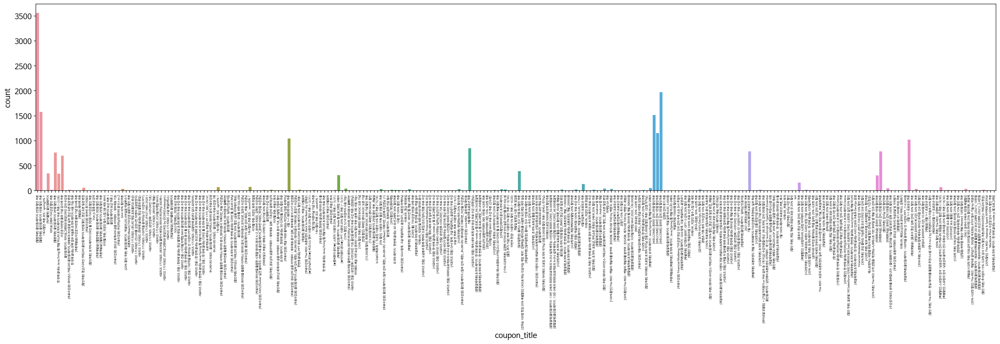

In [ ]:
plt.figure(figsize=(30,6))
plt.xticks(size=5, rotation = 90)
sns.countplot(x=pt[pt['vip']==False]['coupon_title'],data=pt)
plt.show()

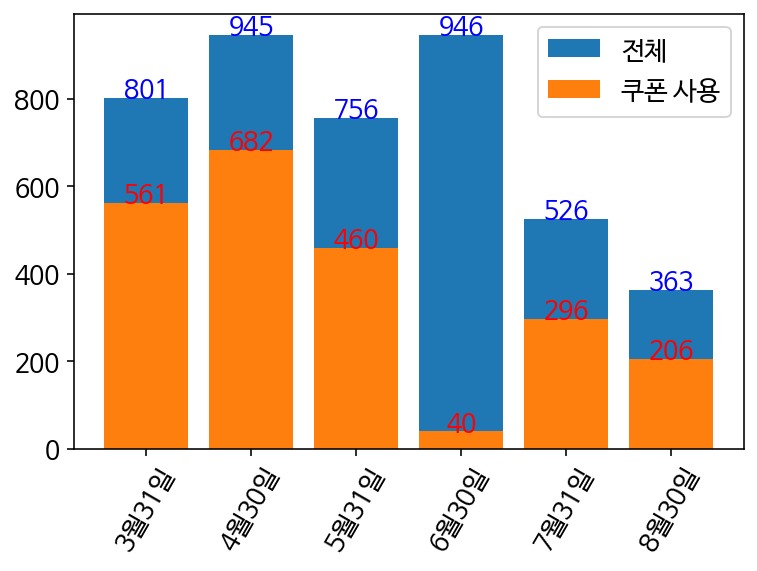

In [ ]:
x= [] # 날짜
y= [] # 총 구매량
y1= [] # 쿠폰사용 구매량
for i in range(3,9):
    if i%2 ==0:
        x.append(f'{i}월30일')
        y.append(len(pt[(pt['vip']==False)&(pt['completed_at']==f'2021-0{i}-30')]))
        y1.append(len(pt[(pt['vip']==False)&(pt['completed_at']==f'2021-0{i}-30')].dropna(subset=['coupon_title'])))
    else:
        x.append(f'{i}월31일')
        y.append(len(pt[(pt['vip']==False)&(pt['completed_at']==f'2021-0{i}-31')]))
        y1.append(len(pt[(pt['vip']==False)&(pt['completed_at']==f'2021-0{i}-31')].dropna(subset=['coupon_title'])))
        
bar1 = plt.bar(x,y, label= "전체")
bar2 = plt.bar(x,y1, label= "쿠폰 사용")
plt.xticks(rotation=60)
plt.legend()

for idx, rect in enumerate(bar1):
    plt.text(idx, rect.get_height()+ 0.5,y[idx], ha= 'center', color= 'blue')
    
for idx, rect in enumerate(bar2):
    plt.text(idx, rect.get_height()+ 0.5,y1[idx], ha= 'center', color= 'red')

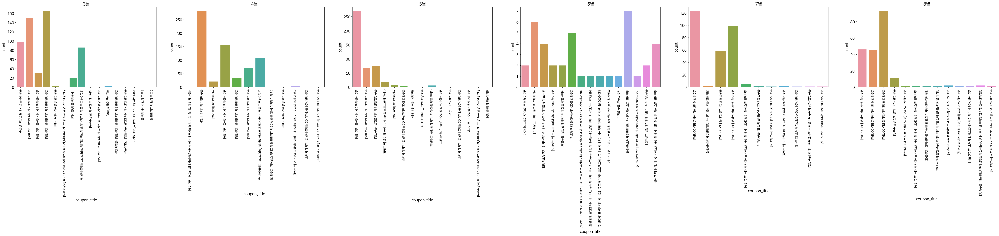

In [ ]:
plt.figure(figsize=(70,5))
for i in range(3,9):
    plt.subplot(1,7,i-2)
    plt.xticks(size=10, rotation = 90)
    plt.title(f'{i}월')
    if i%2 == 0:
        sns.countplot(x=pt[(pt['vip']==False)&(pt['completed_at']==f'2021-0{i}-30')]['coupon_title'],data=pt[(pt['vip']==False)&(pt['completed_at']==f'2021-0{i}-30')])
    else:
        sns.countplot(x=pt[(pt['vip']==False)&(pt['completed_at']==f'2021-0{i}-31')]['coupon_title'],data=pt[(pt['vip']==False)&(pt['completed_at']==f'2021-0{i}-31')])

-  6월 말의 경우 가장 높은 판매량을 기록했지만 그에 비해 쿠폰사용량은 제일 적다. 
- 위 그래프로 보아 쿠폰이 구매의 영향을 끼치지 않을 수 있다 라는 생각이 들지만 위 분석으로 판단하기에 섣부름.
- 달 단위로 데이터를 정리하여 구매와 쿠폰사용의 관계 확인

#### 월단위 completed_at 과 coupon_title의 관계 분석

In [ ]:
# 결제 데이터 달단위 분석.(따로 카피데이터 사용)
import copy

mon = copy.copy(pt)

In [ ]:
def func_m(x):
    return x[:7]

mon["completed_at"] = mon["completed_at"].apply(func_m)

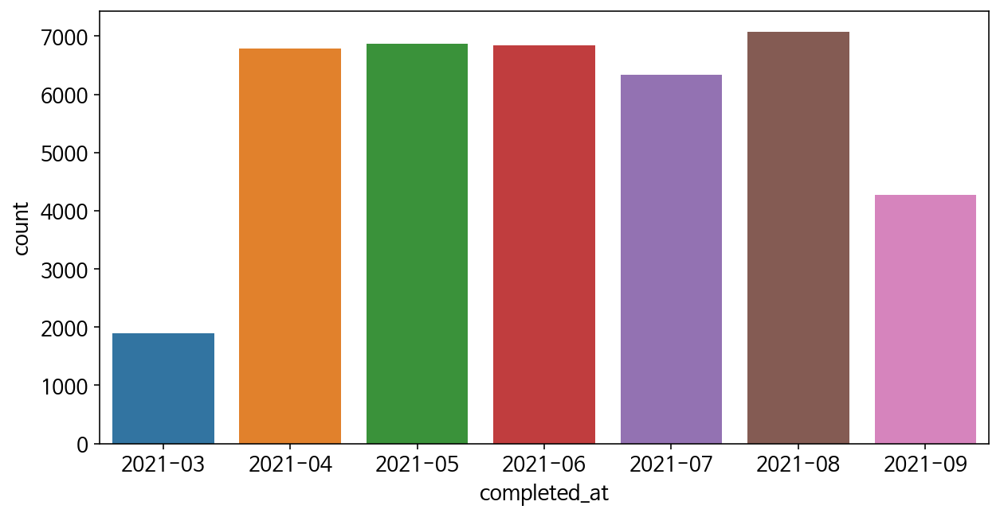

In [ ]:
# 3월 전체, 9월 말 (25일 이후) 데이터는 특정 구간이 생략되어 있음, 해석 시 주의 요망 
plt.figure(figsize=(10,5))
sns.countplot(x=mon[mon['vip']==False]['completed_at'],data=mon)
plt.show()

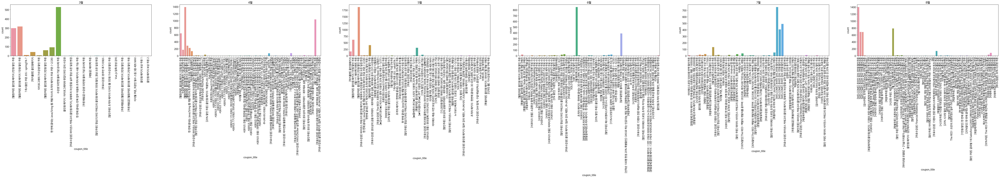

In [ ]:
# 매월 쿠폰사용
plt.figure(figsize=(110,5))
for i in range(3,9):
    plt.subplot(1,7,i-2)
    plt.xticks(rotation = 90)
    plt.title(f'{i}월')
    sns.countplot(x=mon[(mon['vip']==False)&(mon['completed_at']==f'2021-0{i}')]['coupon_title'],data=mon[(mon['vip']==False)&(mon['completed_at']==f'2021-0{i}')])

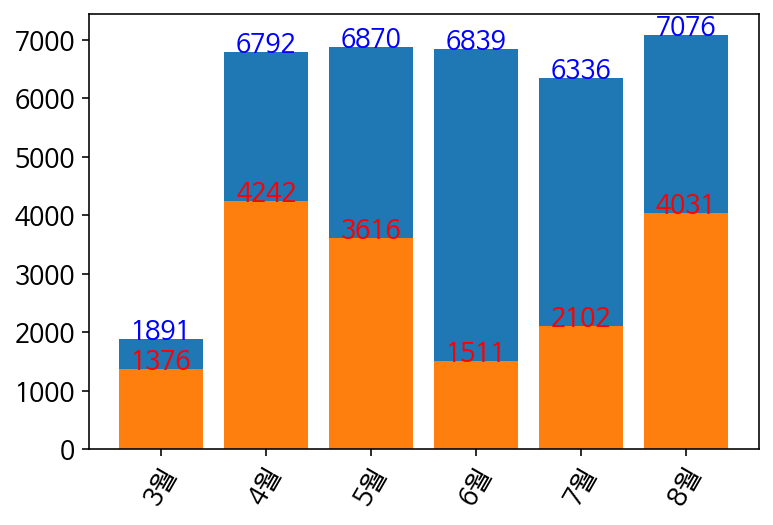

In [ ]:
x_m= [] # 날짜
y_m= [] # 총 구매량
y1_m= [] # 쿠폰사용 구매량
for i in range(3,9):
        x_m.append(f'{i}월')
        y_m.append(len(mon[(mon['vip']==False)&(mon['completed_at']==f'2021-0{i}')]))
        y1_m.append(len(mon[(mon['vip']==False)&(mon['completed_at']==f'2021-0{i}')].dropna(subset=['coupon_title'])))

bar3 = plt.bar(x_m,y_m, label= "전체")
bar4 = plt.bar(x_m,y1_m, label= "쿠폰 사용")
plt.xticks(rotation=60)

for idx, rect in enumerate(bar3):
    plt.text(idx, rect.get_height()+ 0.5,y_m[idx], ha= 'center', color= 'blue')
    
for idx, rect in enumerate(bar4):
    plt.text(idx, rect.get_height()+ 0.5,y1_m[idx], ha= 'center', color= 'red')

- 위 데이터를 토대로 쿠폰의 마케팅 영향은 그리 크지 않다고 생각됨.(있으면 사용하고 없어도 구매를 하는 것으로 보임)
- 높았던 올인원에 포함되어있던 프로그래밍 카테고리가 영향이 있었을 것이라 생각되어 분석 진행

#### format 과 course_title 분석

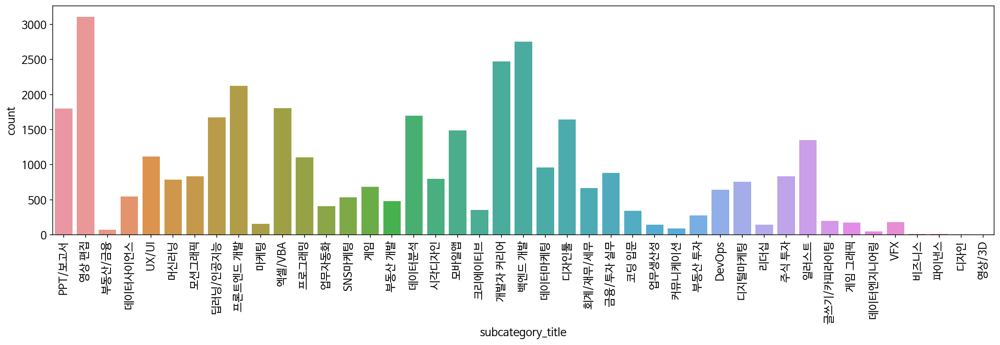

In [ ]:
pt[(pt['vip']==False)&(pt['format']=='올인원')]['subcategory_title']


plt.figure(figsize=(20,5))
plt.xticks(rotation = 90)
sns.countplot(x=pt[(pt['vip']==False)&(pt['format']=='올인원')]['subcategory_title'],data=pt)
plt.show()

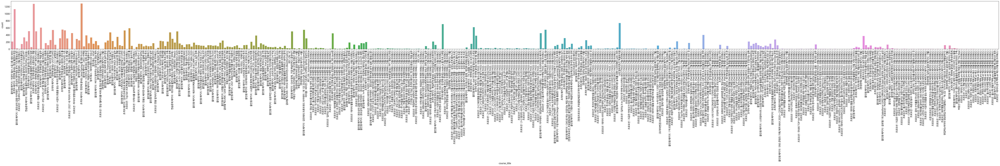

In [ ]:
plt.figure(figsize=(100,5))
plt.xticks(rotation = 90)
sns.countplot(x=pt[(pt['vip']==False)&(pt['format']=='올인원')]['course_title'],data=pt)
plt.show()

In [ ]:
pt[(pt['vip']==False)&(pt['format']=='올인원')]['revenue'].mean()

117603.12643550932

vip가 아닌 고객들이 구매한 Top 3 강의명을 기준으로 평균가격  -> 신규고객 또는 기존고객이 강의를 구매할 때 부담이 없을 것이라 판단

In [ ]:
# 영상 촬영 편집 강의의 평균구매가격
a= int(pt[(pt['vip']==False)&(pt['format']=='올인원')&(pt['course_title']=='초격차 패키지 : 한번에 끝내는 영상 촬영과 편집')]['revenue'].mean())
# 프론트엔드 강의의 평균구매가격
b= int(pt[(pt['vip']==False)&(pt['format']=='올인원')&(pt['course_title']=="초격차 패키지 : 한 번에 끝내는 프론트엔드 개발")]['revenue'].mean())
# 웹 개발 강의의 평균구매가격
c= int(pt[(pt['vip']==False)&(pt['format']=='올인원')&(pt['course_title']=='초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터')]['revenue'].mean())

print('올인원 Top 3 강의 평균 구매가격:',(a+b+c)/3,'원')

올인원 Top 3 강의 평균 구매가격: 98096.0 원


### 결론

- 주어진 데이터 분석 결과, 쿠폰 사용이 적었던 달에도 구매율이 눈에 띄게 낮지 않았음 -> '쿠폰의 영향이 적다' 라고 판단 -> 주어진 데이터에서는 쿠폰 보단 다른 조건 (강의와 가격)이 더 관계가 있는 것으로 보임
- 약 6개월 기준(21.03~09)으로 올인원 포맷의 강의가 가장 인기가 좋으며, 그 중 강의 top 3(1,000명 이상 구매한 강의)의 평균 구매가격은 약 10만원
- 21년 9월 이후로 위와 같은 인기있는 강의의 카테고리와 가격대를 형성하여 판매한다면 신규고객과 기존고객의 유치하기에 적합해 보임

- **올인원 타이틀을 앞세워 강의를 판매하는 전략이 유효하다.**

## 일반 고객 늘리기 (2)

**쿠폰 사용에 따른 분석**

In [ ]:
pt.loc[pt['vip']==True,'vip'] = "VIP"
pt.loc[pt['vip']==False,'vip'] = "Normal"
t = pt[~pt["coupon_title"].isnull()]
t2 = pt[pt["coupon_title"].isnull()]

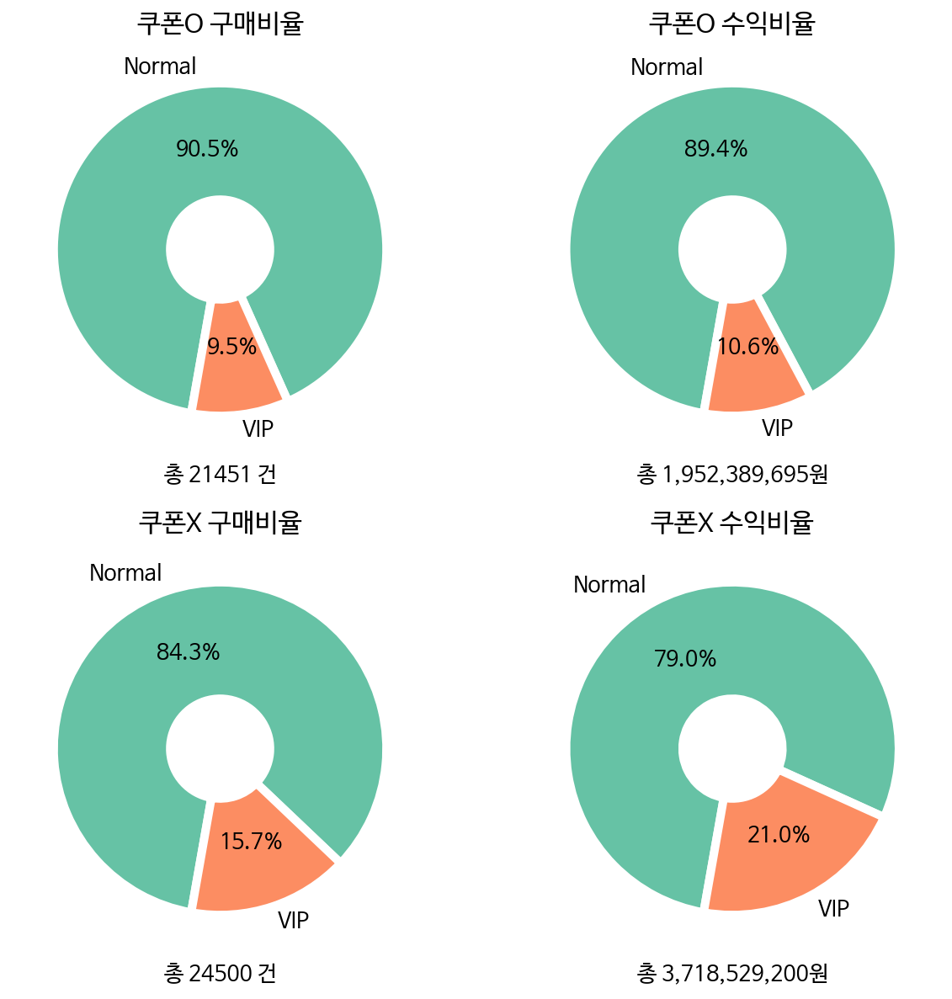

In [ ]:
plt.figure(figsize=(10, 10))
colors = sns.color_palette('Set2')[0:8]

t3 = t.groupby("vip").agg({"id": "count", "revenue": "sum"})
plt.subplot(2,2,1)
plt.title("쿠폰O 구매비율")
plt.pie(t3['id'], labels=t3.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"총 {t3['id'].sum()} 건")

plt.subplot(2,2,2)
plt.title("쿠폰O 수익비율")
plt.pie(t3['revenue'], labels=t3.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"총 {t3['revenue'].astype(int).sum():,}원")

t3 = t2.groupby("vip").agg({"id": "count", "revenue": "sum"})
plt.subplot(2,2,3)
plt.title("쿠폰X 구매비율")
plt.pie(t3['id'], labels=t3.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"총 {t3['id'].sum()} 건")

plt.subplot(2,2,4)
plt.title("쿠폰X 수익비율")
plt.pie(t3['revenue'], labels=t3.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"총 {t3['revenue'].astype(int).sum():,}원")

plt.show()

- 쿠폰 거래데이터 중 구매비율은 VIP 9.5%, 일반고객 90.5%이다
- 쿠폰 거래데이터 중 수익비율은 VIP 10.6%, 일반고객 89.4%이다
- 참고로 고객 비율은 VIP가 4.66%이다

### 일반고객 카테고리별 비율

- 쿠폰 미사용

In [ ]:
t = pt[pt["coupon_title"].isnull() & (pt["vip"]=='Normal')]

In [ ]:
t2 = t.groupby("category_title").agg({"id": "count", "revenue": "sum"})
t2.drop(["비즈니스", "지식콘텐츠", "파이낸스"], inplace=True) # 비즈니스 15건, 지식콘텐츠 14건, 파이낸스 12건
t2

,id,revenue
category_title,,
데이터사이언스,2662,416284900.0
디자인,2026,307387700.0
마케팅,2610,370433400.0
부동산/금융,1148,230437500.0
업무생산성,3393,302852700.0
영상/3D,1906,273969600.0
크리에이티브,376,95799400.0
투자/재테크,407,105265500.0
프로그래밍,6095,825216700.0


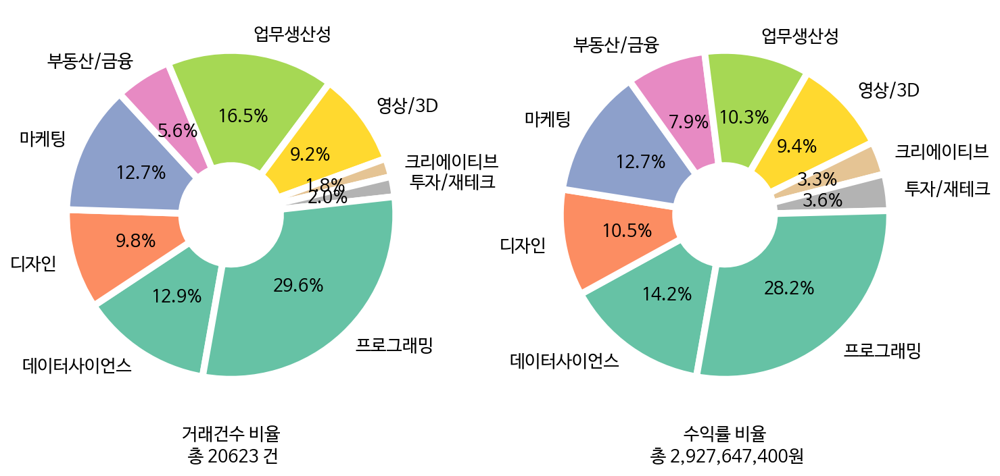

In [ ]:
plt.figure(figsize=(12, 6))
colors = sns.color_palette('Set2')[0:8]

plt.subplot(1,2,1)
plt.pie(t2['id'], labels=t2.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"거래건수 비율\n 총 {t2['id'].sum()} 건")

plt.subplot(1,2,2)
plt.pie(t2['revenue'], labels=t2.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"수익률 비율\n 총 {t2['revenue'].astype(int).sum():,}원")

plt.show()

**일반고객 쿠폰미사용**
- 거래데이터 중 카테고리별 거래량은 프로그래밍 > 업무생산성 > 데이터사이언스 순으로 많다
- 거래데이터 중 카테고리별 수익은 프로그래밍 > 데이터사이언스 > 마케팅 순으로 많다
- 프로그래밍이 수익비율이 거래건수 비율보다 적은걸보니 평균적으로 강의가 싼 편이다

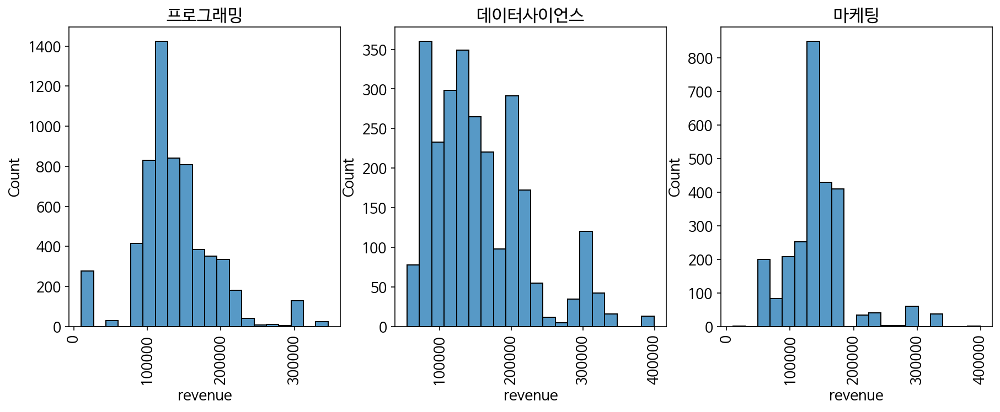

In [ ]:
plt.figure(figsize=(15,5))


plt.subplot(1, 3, 1)
t2 = t[t['category_title']=='프로그래밍']
plt.title("프로그래밍")
plt.xticks(rotation='vertical')
sns.histplot(t2, x="revenue", bins=20)

plt.subplot(1, 3, 2)
t2 = t[t['category_title']=='데이터사이언스']
plt.title("데이터사이언스")
plt.xticks(rotation='vertical')
sns.histplot(t2, x="revenue", bins=20)

plt.subplot(1, 3, 3)
t2 = t[t['category_title']=='마케팅']
plt.title("마케팅")
plt.xticks(rotation='vertical')
sns.histplot(t2, x="revenue", bins=20)

In [ ]:
t[t['category_title']=='프로그래밍']['revenue'].mean()

135392.40360951598

In [ ]:
t[t['category_title']=='데이터사이언스']['revenue'].mean()

156380.5033809166

In [ ]:
t[t['category_title']=='마케팅']['revenue'].mean()

141928.50574712644

- 쿠폰 미사용 거래데이터 중 수익량은 15만 정도에 분포하다
- 거래 가격은 데이터사이언스 > 마케팅 > 프로그래밍 순으로 높다

- 쿠폰 사용

In [ ]:
t = pt[~pt["coupon_title"].isnull() & (pt["vip"]=='Normal')]

In [ ]:
t2 = t.groupby("category_title").agg({"id": "count", "revenue": "sum"})
t2.drop(["비즈니스", "지식콘텐츠"], inplace=True) # 비즈니스 3건, 지식콘텐츠 1건
t2

,id,revenue
category_title,,
데이터사이언스,2274,197571200.0
디자인,2879,317568620.0
마케팅,1353,110505155.0
부동산/금융,960,115651950.0
업무생산성,2340,187682975.0
영상/3D,2607,241862300.0
크리에이티브,19,1268600.0
투자/재테크,702,118909000.0
프로그래밍,6283,454700490.0


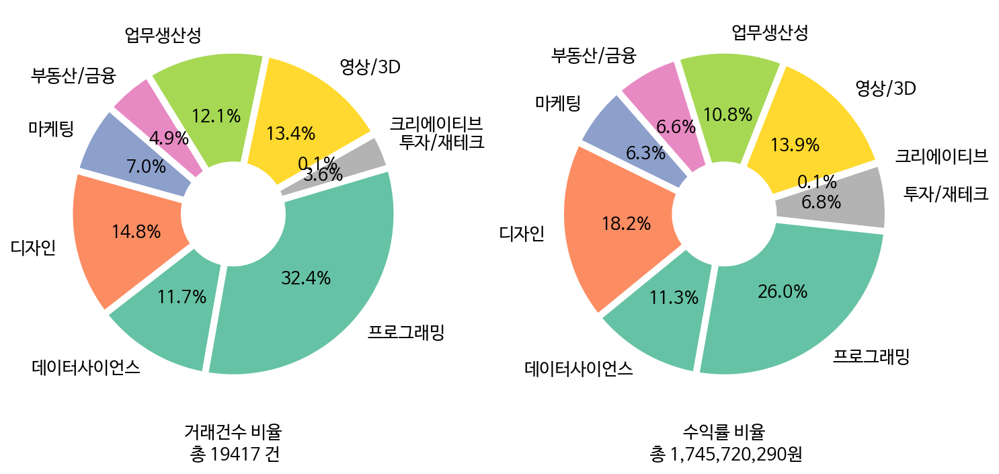

In [ ]:
plt.figure(figsize=(12, 6))
colors = sns.color_palette('Set2')[0:8]

plt.subplot(1,2,1)
plt.pie(t2['id'], labels=t2.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"거래건수 비율\n 총 {t2['id'].sum()} 건")

plt.subplot(1,2,2)
plt.pie(t2['revenue'], labels=t2.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"수익률 비율\n 총 {t2['revenue'].astype(int).sum():,}원")

plt.show()

**일반고객 쿠폰사용**
- 거래데이터 중 카테고리별 거래량은 프로그래밍 > 디자인 > 영상/3D 순으로 많다
- 거래데이터 중 카테고리별 수익은 프로그래밍 > 디자인 > 영상/3D 순으로 많다
- 프로그래밍이 수익비율이 거래건수 비율보다 적은걸보니 평균적으로 가격이 싸거나 할인이 많은 것으로 예상

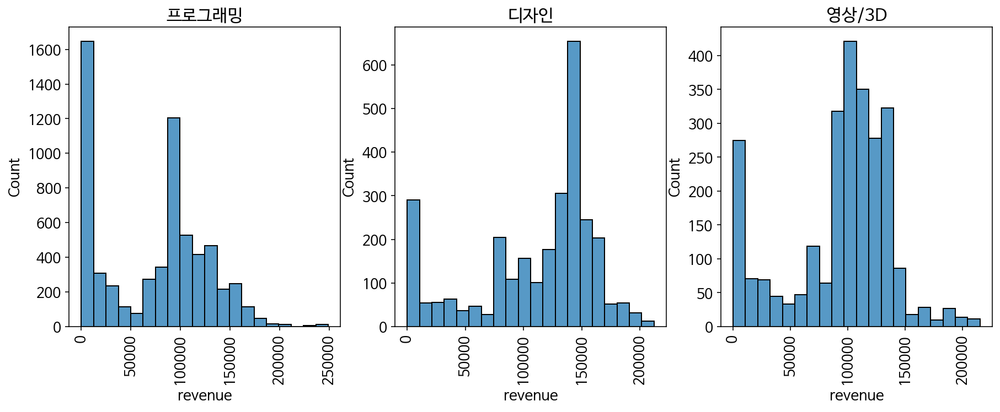

In [ ]:
plt.figure(figsize=(15,5))


plt.subplot(1, 3, 1)
t2 = t[t['category_title']=='프로그래밍']
plt.title('프로그래밍')
plt.xticks(rotation='vertical')
sns.histplot(t2, x="revenue", bins=20)

plt.subplot(1, 3, 2)
t2 = t[t['category_title']=='디자인']
plt.title('디자인')
plt.xticks(rotation='vertical')
sns.histplot(t2, x="revenue", bins=20)

plt.subplot(1, 3, 3)
t2 = t[t['category_title']=='영상/3D']
plt.title('영상/3D')
plt.xticks(rotation='vertical')
sns.histplot(t2, x="revenue", bins=20)

In [ ]:
t[t['category_title']=='프로그래밍']['revenue'].mean()

72369.96498487983

In [ ]:
t[t['category_title']=='디자인']['revenue'].mean()

110305.18235498437

In [ ]:
t[t['category_title']=='영상/3D']['revenue'].mean()

92774.18488684311

- 쿠폰 거래데이터 중 수익량 Top3에서 평균 강의가격은 디자인 > 영상/3D > 프로그래밍 순이다
- 프로그래밍에서 쿠폰 미사용 강의와 가격차이가 별로 안나는걸 보니 5~10퍼 할인쿠폰 사용이 많다고 유추가능

### 1개 강의 구매 vs 2개 이상 구매

In [ ]:
t = pt[~pt["coupon_title"].isnull() & (pt["vip"]=='Normal')]

In [ ]:
t2 = t.groupby("customer_id").agg({"id": "count", "revenue": "sum"})
t3 = pt[pt["customer_id"].isin(t2.index)]

In [ ]:
t2 = t3.groupby("customer_id").agg({"id": "count", "revenue": "sum"})

In [ ]:
def func(x):
    if x>=2:
        return "나머지"
    else:
        return "1개구매"
t2["buy"] = t2['id'].apply(func)

In [ ]:
t3 = t2.groupby("buy").agg({"id": "count", "revenue": "sum"})
t3

,id,revenue
buy,,
1개구매,12935,1.295708e+09
나머지,3869,7.729333e+08


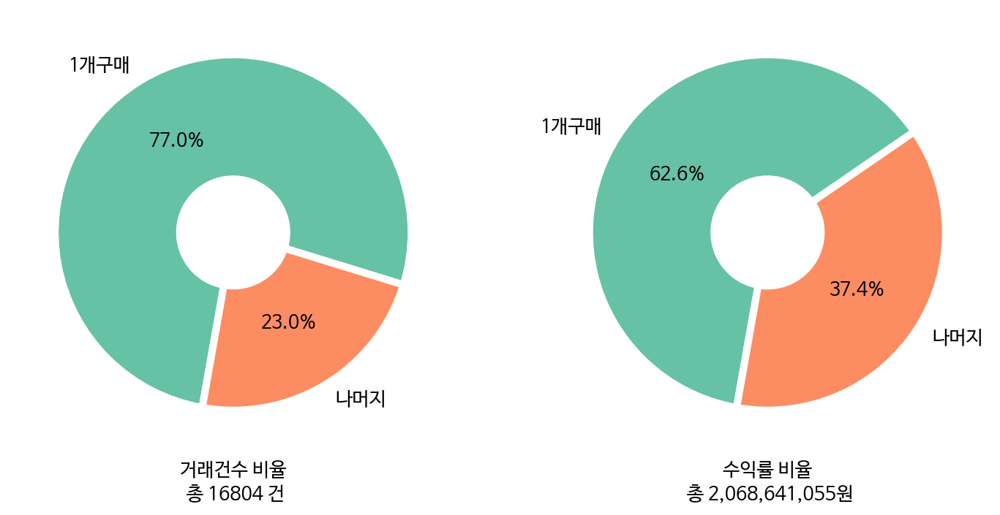

In [ ]:
plt.figure(figsize=(12, 6))
colors = sns.color_palette('Set2')[0:8]

plt.subplot(1,2,1)
plt.pie(t3['id'], labels=t3.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"거래건수 비율\n 총 {t3['id'].sum()} 건")

plt.subplot(1,2,2)
plt.pie(t3['revenue'], labels=t3.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"수익률 비율\n 총 {t3['revenue'].astype(int).sum():,}원")

plt.show()

- 3/4 이상의 고객이 강의를 1개만 구입했음
- 1개만 더 구매하게 해도 충분히 매출이 상승할 것으로 예상

### 월별 쿠폰

In [ ]:
t = pt[~pt["coupon_title"].isnull() & (pt["vip"]=='Normal')]

In [ ]:
def func(x):
    if "2021-04-01"<=x and x<"2021-05-01":
        return "4월"
    elif "2021-05-01"<=x and x<"2021-06-01":
        return "5월"
    elif "2021-06-01"<=x and x<"2021-07-01":
        return "6월"
    elif "2021-07-01"<=x and x<"2021-08-01":
        return "7월"
    elif "2021-08-01"<=x and x<"2021-09-01":
        return "8월"
    elif "2021-09-01"<=x and x<"2021-10-01":
        return "9월"
    else:
        return "나머지"

t["coupon_month"] = t['completed_at'].apply(func)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


- 쿠폰 사용 월별 비율

In [ ]:
t2 = t.groupby('coupon_month').agg({"revenue": "sum", "id": "count"})
t2.drop("나머지", inplace=True)
t2

,revenue,id
coupon_month,,
4월,295855795.0,4242
5월,325842780.0,3616
6월,77939980.0,1511
7월,247955950.0,2102
8월,462762750.0,4031
9월,252305700.0,2543


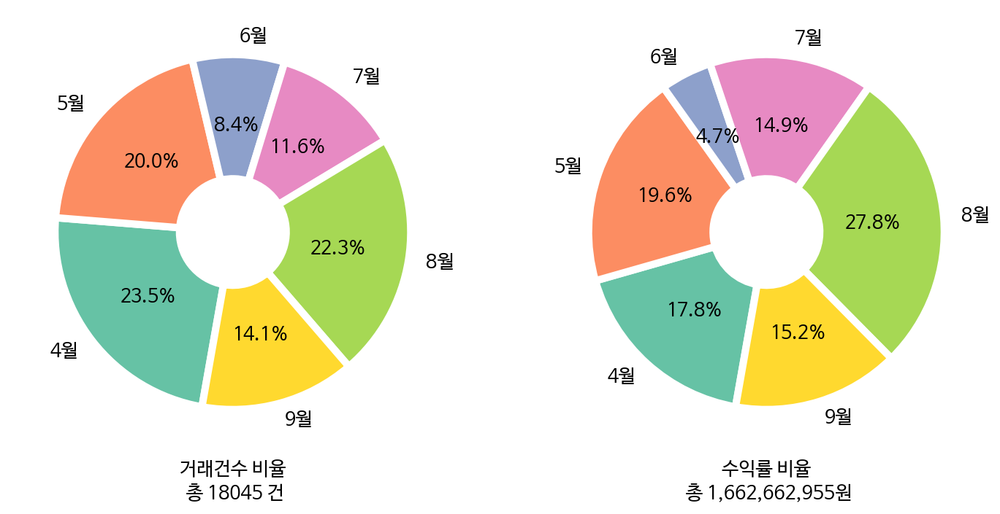

In [ ]:
plt.figure(figsize=(12, 6))
colors = sns.color_palette('Set2')[0:8]

plt.subplot(1,2,1)
plt.pie(t2['id'], labels=t2.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"거래건수 비율\n 총 {t2['id'].sum()} 건")

plt.subplot(1,2,2)
plt.pie(t2['revenue'], labels=t2.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"수익률 비율\n 총 {t2['revenue'].astype(int).sum():,}원")

plt.show()

- 쿠폰거래데이터가 6월이 나머지 달에 비해 수요가 없다
- 쿠폰을 사용하지 않았을 떄 어떤지 확인해보자

- 예상과 다르게 쿠폰 미사용 데이터 중 6월이 가장 많다
- 수입 극대화 전략

### 'x월' 쿠폰

- 쿠폰 이름에 'X월'이 포함된 쿠폰 거래 데이터 분석

In [ ]:
t = pt[~pt["coupon_title"].isnull() & (pt["vip"]=='Normal')]

In [ ]:
def func(x):
    if x.startswith("4월"):
        return "4월"
    elif x.startswith("5월"):
        return "5월"
    elif x.startswith("6월"):
        return "6월"
    elif x.startswith("7월"):
        return "7월"
    elif x.startswith("8월"):
        return "8월"
    else:
        return "해당없음"

t["coupon_month"] = t['coupon_title'].apply(func)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


In [ ]:
t2 = t.groupby('coupon_month').agg({"revenue": "sum", "id": "count"})
t2.drop("해당없음", inplace=True)
t2

,revenue,id
coupon_month,,
4월,18235700.0,1042
5월,15365780.0,865
6월,9389200.0,135
7월,18123950.0,788
8월,26377650.0,1024


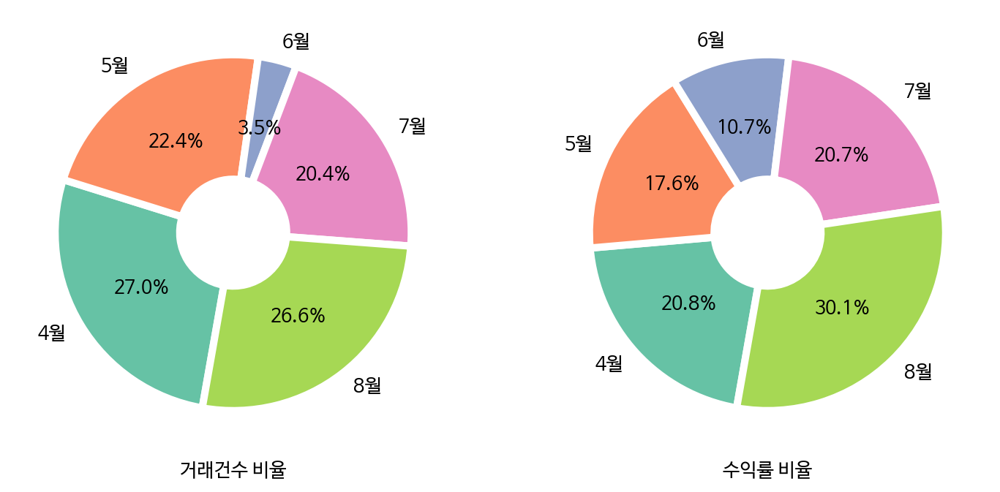

In [ ]:
plt.figure(figsize=(12, 6))
colors = sns.color_palette('Set2')[0:6]

plt.subplot(1,2,1)
plt.pie(t2['id'], labels=t2.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"거래건수 비율")

plt.subplot(1,2,2)
plt.pie(t2['revenue'], labels=t2.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"수익률 비율")

plt.show()

- 6월은 나머지달과 거래량 차이가 5배이상 나지만 실제 수익량 차이가 별로 없다
- 6월에 전체적으로 쿠폰을 사용한 데이터가 없다
- 6월이 수입이 많아서 1+1 페이백 이벤트 등 쿠폰 이벤트를 안한거같다

- 4월과 8월 거래건수는 비슷한데 수익차이가 약 1.85배난다 <br>
 -> **4월, 8월 데이터 집중 분석**

In [ ]:
# 'X월' 쿠폰
print(t[t["coupon_month"] == '4월']['coupon_title'].value_counts())
print()
print(t[t["coupon_month"] == '5월']['coupon_title'].value_counts())
print()
print(t[t["coupon_month"] == '6월']['coupon_title'].value_counts())
print()
print(t[t["coupon_month"] == '7월']['coupon_title'].value_counts())
print()
print(t[t["coupon_month"] == '8월']['coupon_title'].value_counts())

4월 1+1 페이백 이벤트 쿠폰    1042
Name: coupon_title, dtype: int64

5월 페이백 프로모션 쿠폰        850
5월 5일 어른이날 기념 5%쿠폰     15
Name: coupon_title, dtype: int64

6월 반값특가 프로모션 쿠폰    135
Name: coupon_title, dtype: int64

7월 100% 페이백 프로모션 쿠폰       787
7월 100% 페이백 프로모션 쿠폰_복구      1
Name: coupon_title, dtype: int64

8월 1+1 프로모션 쿠폰    1024
Name: coupon_title, dtype: int64


- '8월'쿠폰이 수익이 더 많은 이유

In [ ]:
t = pt[~pt["coupon_title"].isnull() & (pt["vip"]=='Normal')]

In [ ]:
def func(x):
    if x.startswith("4월"):
        return "4월"
    elif x.startswith("5월"):
        return "5월"
    elif x.startswith("6월"):
        return "6월"
    elif x.startswith("7월"):
        return "7월"
    elif x.startswith("8월"):
        return "8월"
    else:
        return "해당없음"

t["coupon_month"] = t['coupon_title'].apply(func)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


In [ ]:
t3 = t[(t['coupon_month']=="4월")|(t['coupon_month']=="8월")]

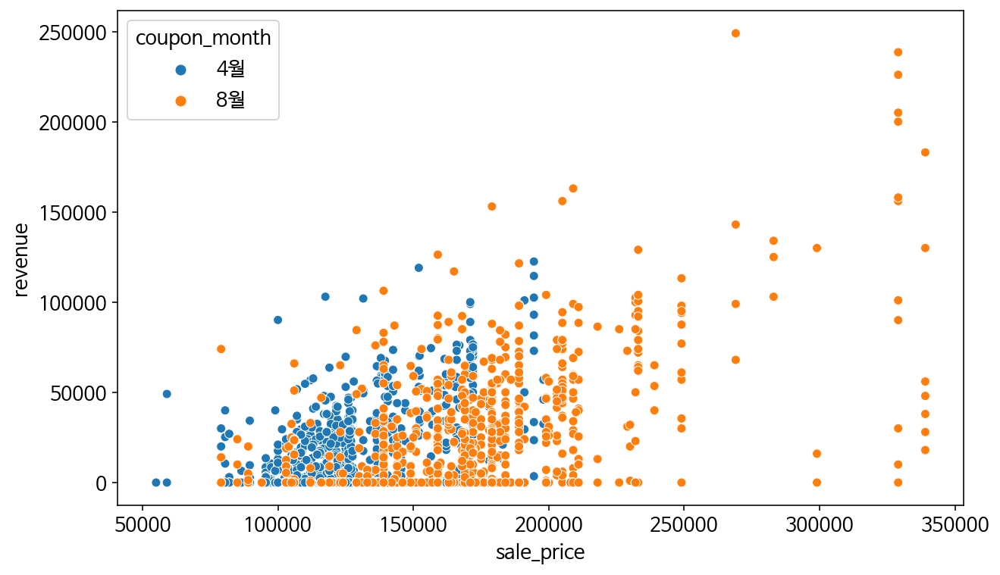

In [ ]:
# 4월, 8월의 'X월' 쿠폰 사용 빈도
plt.figure(figsize=(10,6))
sns.scatterplot(data=t3, x="sale_price", y="revenue", hue="coupon_month")

- 8월이 4월에 비해 상대적으로 비싼 강의가 많이 팔림
- 8월의 경우 비싼 강의에 1+1 프로모션 이벤트를 진행함

### 결론
1. 쿠폰 거래 데이터 중 강의 1개만 구매한 고객의 수익이 강의 2개 이상 구매한 고객의 수익보다 약 1.8배 많음 <br>
  -> 단일 쿠폰 구매 고객의 수입이 좋음
2. 월별 쿠폰사용, 쿠폰 미사용 거래 데이터 중 6월이 반대 성향을 띔 <br> -> 6월은 거래량이 많아서 쿠폰이벤트를 안 한 것으로 예상 <br>
  -> 실제로 월별 페이백 이벤트에서 6월은 페이백 이벤트를 진행하지 않음
3. 쿠폰 거래 데이터 중 4월과 8월은 거래량은 비슷한데 수익이 1.5배 차이남 <br> -> 분포도를 그려보니 8월이 4월에 비해 비싼 강의에 쿠폰이 많이 사용됨 <br>     -> 비싼 강의에 이벤트를 많이하면 수익도 많아짐

## 기타고객 분석
- b2b, b2g, 패스트 캠퍼스 내부 강의 (온라인 완주반, 캠프, school)
- 사업을 따내야 하거나, 자체 프로그램 운영 필요 <br>     -> 일반 고객들과는 다름
- 이들을 분석하고 일반 고객으로 전환시키는 전략 수립


*   사업 = b2b + b2g
*   프로그램 = 온라인 완주반 + 캠프 + school



### 사업/프로그램 분석

In [ ]:
# 사업, 프로그램별 구매데이터 합치기
df_b2 = pd.concat([df_b2b, df_b2g])
df_program = pd.concat([df_finish, df_camp, df_school])

In [ ]:
df = pd.concat([pt, df_b2, df_program]).sort_values(by=["id"])

In [ ]:
t = df_program.groupby("customer_id").agg({"revenue": "sum", "id": "count"})
t[(t["revenue"]>=400000)].sort_values(by=["revenue", "id"], ascending=False)

,revenue,id
customer_id,,
509993,1902600.0,2
42009,1821000.0,2
29094,1800000.0,1
277943,1620000.0,1
53748,1530000.0,1
...,...,...
64646,400000.0,1
120463,400000.0,1
430107,400000.0,1


In [ ]:
# vip고객 분리
t = pt.groupby("customer_id").agg({"revenue": "sum", "id": "count"})
t2 = t[(t["revenue"]>=400000)].sort_values(by=["revenue", "id"], ascending=False)
t2_r = t[(t["revenue"]<400000)].sort_values(by=["revenue", "id"], ascending=False)
t2

,revenue,id
customer_id,,
98685,7040750.0,53
50769,4805950.0,38
40783,4424095.0,34
20784,3445050.0,26
72501,3235150.0,20
...,...,...
661840,401000.0,2
526317,400500.0,4
644372,400500.0,3


In [ ]:
# vip 고객 라벨링
def func(x):
    if x in t2.index:
        return "vip"
    else:
        return "normal"

pt['vip'] = pt["customer_id"].apply(func)

In [ ]:
# 사업, 프로그램 라벨링
df_b2['vip'] = "사업"
df_program['vip'] = "프로그램"

In [ ]:
t5 = df.groupby('vip').agg({"id": "count", "revenue": "sum"})

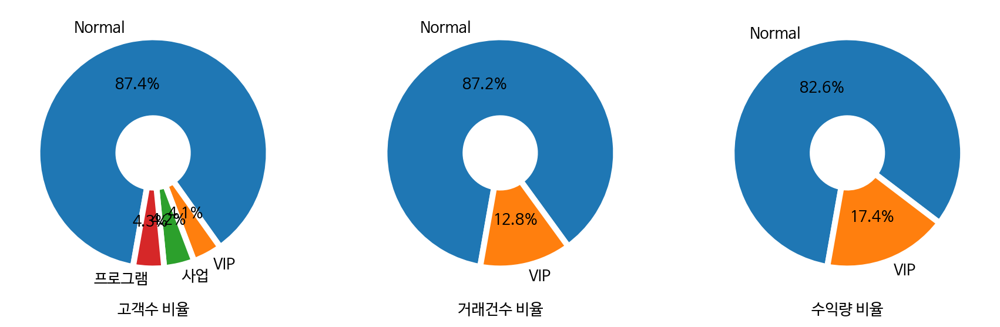

,id,revenue
vip,,
Normal,40079,4.683223e+09
VIP,5872,9.876963e+08


In [ ]:
# VIP 특징

plt.figure(figsize=(15, 10))

plt.subplot(1,3,1)
plt.pie([len(t2_r), len(t2), len(df_b2), len(df_program)], labels=["Normal", "VIP", "사업", "프로그램"], autopct='%.1f%%', startangle=260, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel("고객수 비율")

plt.subplot(1,3,2)
plt.pie(t5['id'], labels=t5.index, autopct='%.1f%%', startangle=260, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel("거래건수 비율")

plt.subplot(1,3,3)
plt.pie(t5['revenue'], labels=t5.index, autopct='%.1f%%', startangle=260, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel("수익량 비율")

plt.show()
t5

- 프로그램 참여 고객의 비율은 전체 비율중 4.3%, 사업 참여 고객은 4.2%로 매우 낮음
- 반면에 수익에 대해서는 각각 6.6%, 24.6%로 많은 부분을 차지


### 고객전환 분석

- 프로그램(온라인 완주반, 캠프, 스쿨) -> 일반고객



In [ ]:
# 1502명중 450명이 개인고객으로 전환
from_program = pt[pt["customer_id"].isin(df_program["customer_id"])]

In [ ]:
len(df_program["customer_id"].unique())

1502

In [ ]:
len(from_program["customer_id"].unique())

450

프로그램 참여자의 경우 일반고객으로 전환된 사람이 매우 많다.

In [ ]:
# 이중 vip 고객이 된 사람 탐색
len(from_program[from_program["vip"]=="vip"]["customer_id"].unique())

79

In [ ]:
# 프로그램에서 넘어온 모든 구매자들의 첫 구매가 프로그램이였는지 확인
first = pd.DataFrame([])
for id in from_program["customer_id"].unique():
   first = pd.concat([df[df["customer_id"]==id].head(1), first])

In [ ]:
# 온라인 완주반 프로그램을 통해 일반고객으로 전환된 고객이 다수 측정됨
first["format"].value_counts()

온라인 완주반    179
올인원        171
스쿨 온라인      85
RED          6
하루10분컷       6
캠프           1
MBA          1
이벤트          1
Name: format, dtype: int64

- 사업(b2b,b2g) -> 일반고객



In [ ]:
# 1502명중 97명이 개인고객으로 전환
from_b2 = pt[pt["customer_id"].isin(df_b2["customer_id"])]

In [ ]:
len(df_b2["customer_id"].unique())

1502

In [ ]:
len(from_b2["customer_id"].unique())

97

b2사업 결제데이터의 경우

1. 구매자가 단체인 경우와 개인인 경우가 나뉘어져 있음
2. vip 선정시 사업 결제 내역을 포함하지 않음

-> 비율이 상대적으로 적게 나옴

In [ ]:
# b2사업 참여자 중 vip 고객이 된 사람의 수
len(from_b2[from_b2["vip"]=="vip"]["customer_id"].unique())

7

마찬가지로 b2결제 내역까지 합쳐서 vip를 선정했다면 더 많다는 결과가 나왔을 것으로 예상

In [ ]:
# b2 사업에서 넘어온 모든 구매자들의 첫 구매가 b2 사업이였는지 확인
first = pd.DataFrame([])
for id in from_b2["customer_id"].unique():
   first = pd.concat([df[df["customer_id"]==id].head(1), first])

In [ ]:
# 기존 고객인 경우가 대다수
first["format"].value_counts()

올인원        66
B2B        12
B2G         7
하루10분컷      5
RED         3
온라인 완주반     2
B2B 온라인     1
이벤트         1
Name: format, dtype: int64

### 전환고객 분석

- 전환고객 데이터 추출


In [ ]:
df_etc = pd.concat([df_b2, df_program])

In [ ]:
# 사업/프로그램 참여 고객들중 우선 해당 구매가 패스트 캠퍼스에서의 첫 구매인 고객들을 뽑아오자.
first = pd.DataFrame([])

for id in df_etc["customer_id"].unique():
   first = pd.concat([df[df["customer_id"]==id].head(1), first])

lst = ["B2B", "B2G", "B2B 온라인", "온라인 완주반", '캠프', '스쿨 온라인', '스쿨']

etc_new = first[first["format"].isin(lst)]

이렇게 새로 만들어진 데이터에서 새로운 컬럼(moved)을 생성

*   True : 사업/프로그램 고객에서 일반 고객으로 전환
*   False : 사업/프로그램에만 참여



In [ ]:
# 전환고객 추출
from_etc = pt[pt["customer_id"].isin(etc_new["customer_id"])]

In [ ]:
# 라벨링
def func(x):
    if x in from_etc["customer_id"].unique():
        return True
    else:
        return False

etc_new['moved'] = etc_new["customer_id"].apply(func)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
# 변환 확인
etc_new["moved"].value_counts()

False    2453
True      285
Name: moved, dtype: int64

In [ ]:
t = pd.pivot_table(data=etc_new, index=["format"], values ="id", columns=["moved"], aggfunc=["count"])
t["ratio"] = t[('count',  True)] / t[('count', False)] *100
t

count             ratio
moved    False   True           
format                          
B2B      258.0   12.0   4.651163
B2B 온라인  921.0    1.0   0.108578
B2G      222.0    7.0   3.153153
스쿨        10.0    NaN        NaN
스쿨 온라인   157.0   85.0  54.140127
온라인 완주반  873.0  179.0  20.504009
캠프        12.0    1.0   8.333333

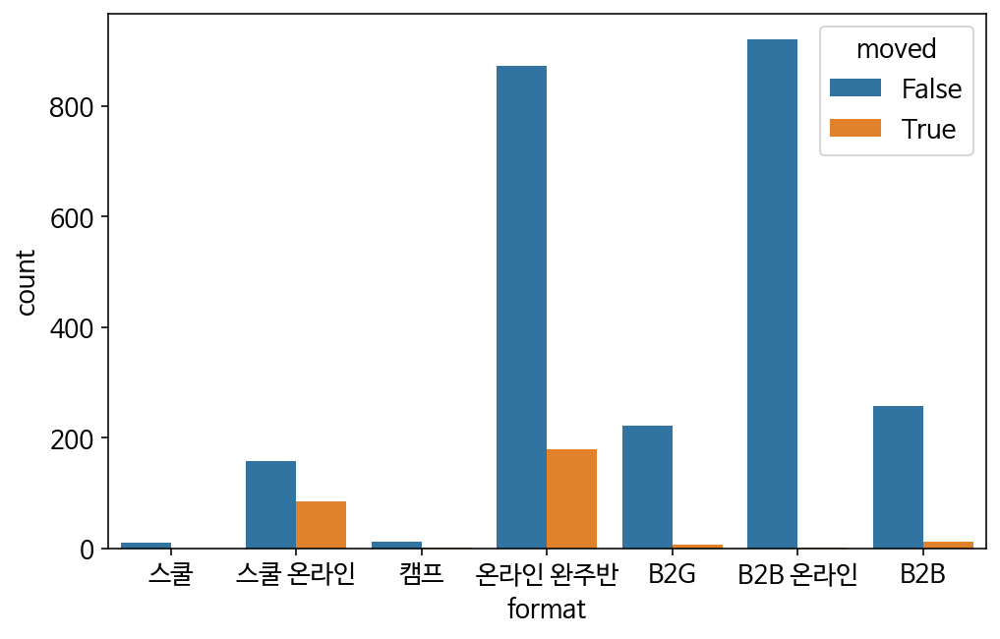

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(data = etc_new, x="format", hue="moved")
plt.show()

일반고객으로 가장 많은 전환이 이루어진 것은 온라인 완주반(179명)

일반고객으로 가장 많은 비율이 전환된 것은 스쿨 온라인(53.5%)

- 전환고객 카테고리별 분석

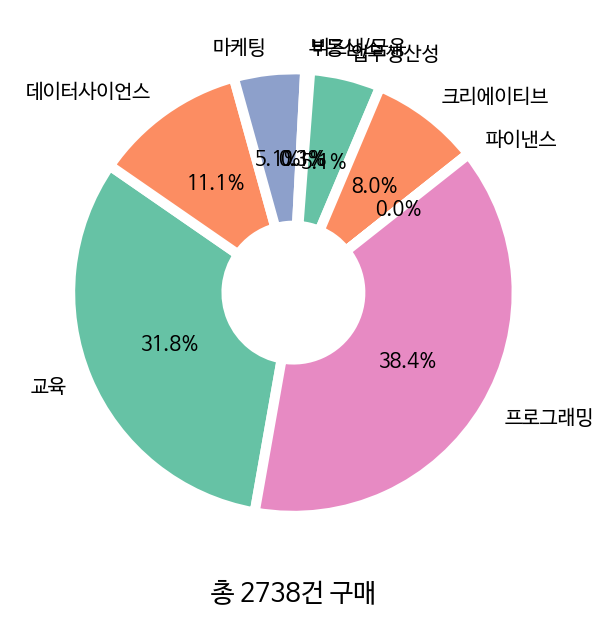

In [ ]:
# 사업/프로그램 구매 데이터 기준 카테고리 분석
t = pd.pivot_table(data=etc_new, index = ['category_title'], values=['id'],  aggfunc = "count").reset_index()
plt.figure(figsize=(5,7))
colors = sns.color_palette('Set2')[0:5]
plt.pie(t['id'], labels=t['category_title'], autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, textprops={'fontsize': 10
}, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"총 {t['id'].sum()}건 구매")
plt.show()

카테고리 "교육"이 세분화 되지 않고 큰 부분을 차지해 분석의 의미가 크지 않다.

In [ ]:
# 전환고객의 카테고리 분석
pd.pivot_table(data=from_etc, index=["category_title", "subcategory_title"], values=["revenue"], aggfunc=["count", "sum"])

count         sum
                                 revenue     revenue
category_title subcategory_title                    
데이터사이언스        데이터분석                  29   3303650.0
               데이터사이언스                 6   1802000.0
               데이터엔지니어링                8   2273800.0
               딥러닝/인공지능               31   3564800.0
               머신러닝                   12   1559300.0
디자인            UX/UI                   7    881000.0
               디자인툴                    9   1261100.0
               시각디자인                   3    382000.0
               일러스트                    5    695000.0
마케팅            SNS마케팅                  2     75000.0
               글쓰기/카피라이팅               3    424000.0
               데이터마케팅                  5    573500.0
               디지털마케팅                  3    689000.0
               마케팅                     1     45000.0
부동산/금융         금융/투자 실무                4    550100.0
               부동산/금융                  1    299000.0
               회계/재무/세무               10   1735300.0
업무생산성          PPT/보고서                15   1489225.0
               리더십                     4    509400.0
               업무생산성                  13    265825.0
               업무자동화                   7    338500.0
               엑셀/VBA                  9    944000.0
               커뮤니케이션                  1     14200.0
영상/3D          VFX                     4    501200.0
               게임 그래픽                  2    304200.0
               영상 편집                   8    633000.0
크리에이티브         크리에이티브                  3    818000.0
투자/재테크         부동산 투자                  1     15500.0
               주식 투자                   8   1467000.0
프로그래밍          DevOps                 31   3860900.0
               개발자 커리어                49   4311000.0
               게임                      5    403500.0
               모바일앱                   21   2353300.0
               백엔드 개발                 91  10391600.0
               코딩 입문                  10    911600.0
               프로그래밍                  23   4348100.0
               프론트엔드 개발               69   8308550.0

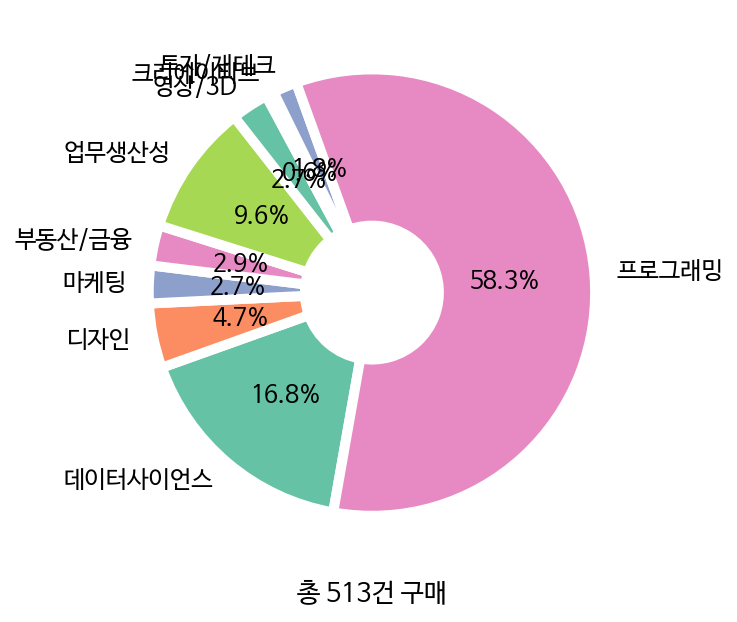

In [ ]:
t = pd.pivot_table(data=from_etc, index = ['category_title'], values=['id'],  aggfunc = "count").reset_index()
plt.figure(figsize=(5,7))
colors = sns.color_palette('Set2')[0:5]
plt.pie(t['id'], labels=t['category_title'], autopct='%.1f%%', textprops={'fontsize': 12}, startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"총 {t['id'].sum()}건 구매")
plt.show()

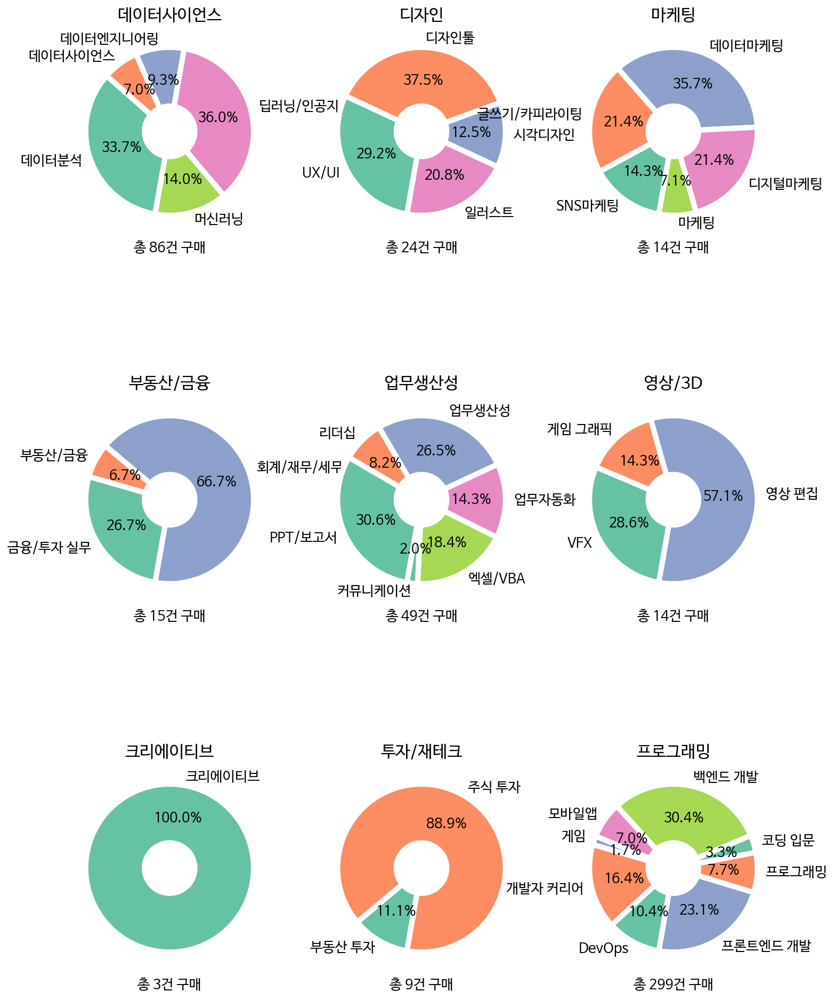

In [ ]:
t = pd.pivot_table(data=from_etc, index = ['category_title','subcategory_title'], values=['id'],  aggfunc = "count").reset_index()
ct = list(t['category_title'].unique())
plt.figure(figsize=(12,18))
colors = sns.color_palette('Set2')[0:5]
for i, title in enumerate(ct):
    plt.subplot(3, 3, i+1)
    plt.title(f"{title}")
    t1 = t[t['category_title']==title]
    plt.pie(t1['id'], labels=t1['subcategory_title'], autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
    plt.xlabel(f"총 {t1['id'].sum()}건 구매")
plt.show()

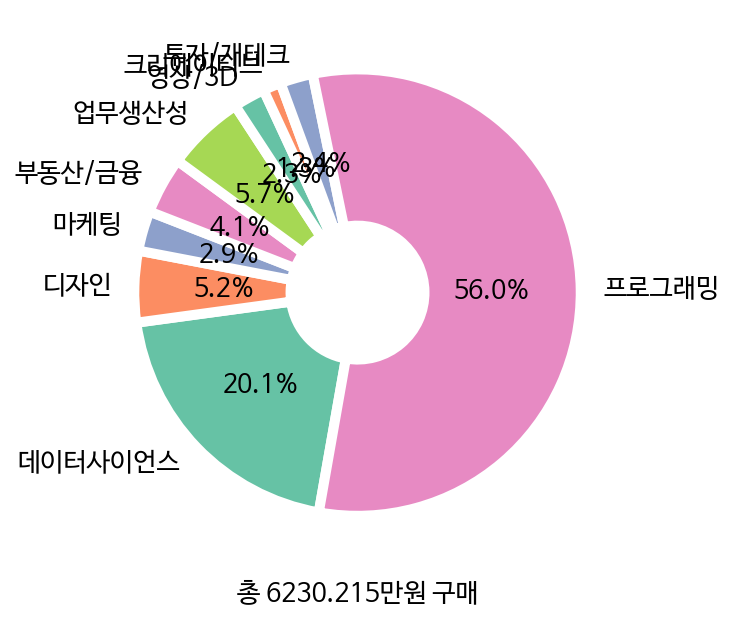

In [ ]:
t = pd.pivot_table(data=from_etc, index = ['category_title'], values=['revenue'],  aggfunc = "sum").reset_index()
plt.figure(figsize=(5,6))
colors = sns.color_palette('Set2')[0:5]
plt.pie(t['revenue'], labels=t['category_title'], autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"총 {t['revenue'].sum()/10000}만원 구매")
plt.show()

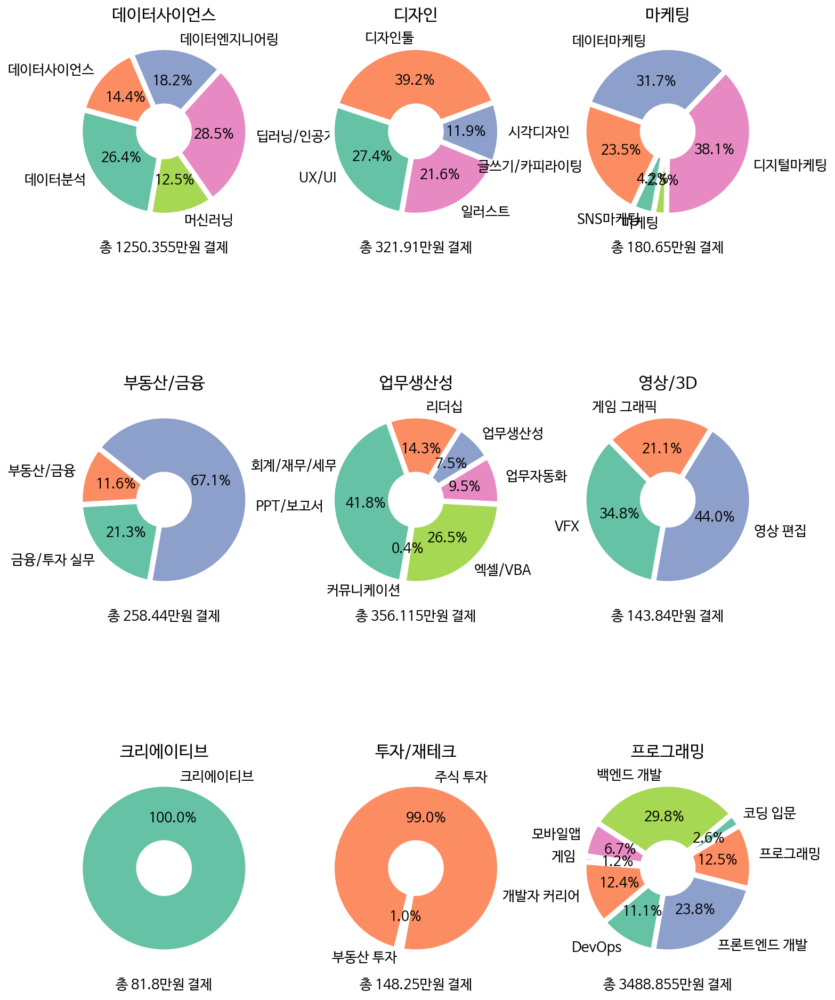

In [ ]:
t = pd.pivot_table(data=from_etc, index = ['category_title','subcategory_title'], values=['revenue'],  aggfunc = "sum").reset_index()
ct = list(t['category_title'].unique())
plt.figure(figsize=(12,18))
colors = sns.color_palette('Set2')[0:5]
for i, title in enumerate(ct):
    plt.subplot(3, 3, i+1)
    plt.title(f"{title}")
    t1 = t[t['category_title']==title]
    plt.pie(t1['revenue'], labels=t1['subcategory_title'], autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
    plt.xlabel(f"총 {t1['revenue'].sum()/10000}만원 결제")
plt.show()

프로그래밍, 데이터사이언스 카테고리에 관심을 가지는 전환고객의 비율이 대다수이다.

해당 카테고리에서의 결제액도 대다수를 차지한다.

- 전환고객 쿠폰 분석

In [ ]:
# 쿠폰 사용여부 라벨링
from_etc["coupon_used"] = True
from_etc.loc[from_etc["coupon_title"].isnull(),"coupon_used"] = False

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
# pt 데이터 쿠폰 사용여부 라벨링
pt["coupon_used"] = True
pt.loc[pt["coupon_title"].isnull(),"coupon_used"] = False

In [ ]:
t0 = from_etc.groupby("coupon_used").agg({"id": "count"})

In [ ]:
t00 = pt.groupby("coupon_used").agg({"id": "count"})

In [ ]:
pt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45951 entries, 4 to 105418
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      45951 non-null  int64         
 1   customer_id             45951 non-null  int64         
 2   course_id               43973 non-null  float64       
 3   type                    45951 non-null  object        
 4   state                   45951 non-null  object        
 5   course_title            45951 non-null  object        
 6   category_title          45951 non-null  object        
 7   format                  45951 non-null  object        
 8   completed_at            45951 non-null  object        
 9   transaction_amount      45951 non-null  int64         
 10  coupon_title            21451 non-null  object        
 11  coupon_discount_amount  21451 non-null  float64       
 12  sale_price              45929 non-null  float

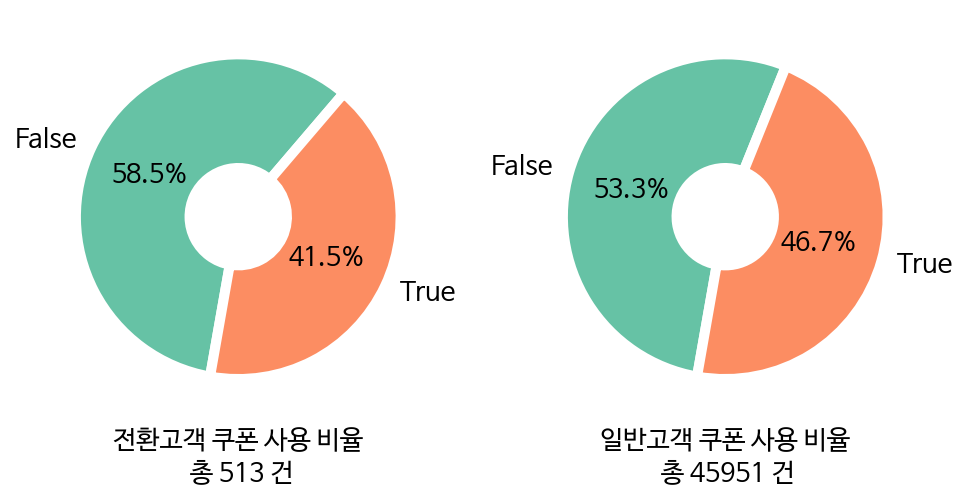

In [ ]:
plt.figure(figsize=(8, 6))
colors = sns.color_palette('Set2')[0:8]

plt.subplot(1,2,1)
plt.pie(t0['id'], labels=t0.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"전환고객 쿠폰 사용 비율\n 총 {t0['id'].sum()} 건")

plt.subplot(1,2,2)
plt.pie(t00['id'], labels=t00.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"일반고객 쿠폰 사용 비율\n 총 {t00['id'].sum()} 건")

plt.show()

일반고객의 쿠폰 사용 비율과 전환고객의 쿠폰 사용 비율 사이에는 큰 차이가 없다.

쿠폰이 전환 고객에 미치는 영향을 다른 관점에서 보아야 할듯 하다.

In [ ]:
# 비슷하게 쿠폰 사용 고객 비율을 계산해 보자
t0 = from_etc.groupby("customer_id").agg({"coupon_used": "sum"})
t00 = pt.groupby("customer_id").agg({"coupon_used": "sum"})

In [ ]:
def func(x):
    if x ==0 :
        return False
    else:
        return True

t0["coupon_used"] = t0["coupon_used"].apply(func)
t00["coupon_used"] = t00["coupon_used"].apply(func)

In [ ]:
t0 = from_etc.groupby("coupon_used").agg({"customer_id": "count"})
t00 = pt.groupby("coupon_used").agg({"customer_id": "count"})

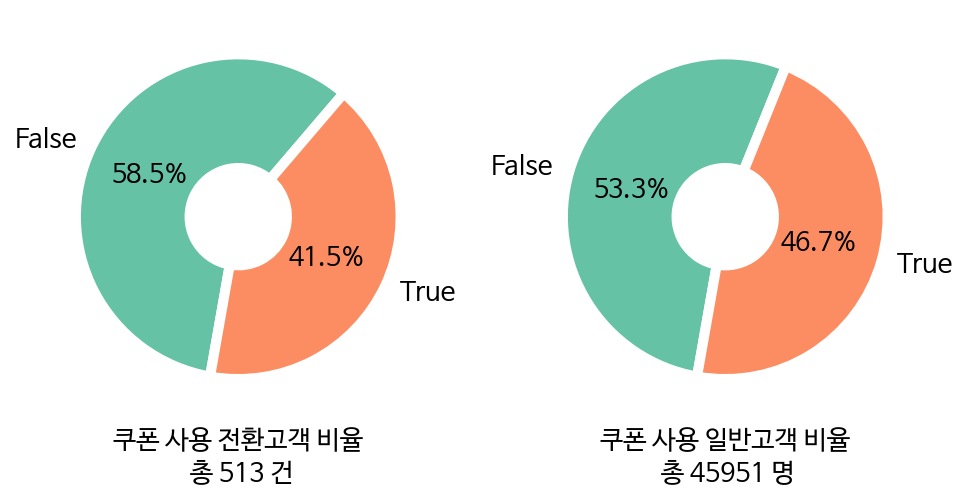

In [ ]:
plt.figure(figsize=(8, 6))
colors = sns.color_palette('Set2')[0:8]

plt.subplot(1,2,1)
plt.pie(t0['customer_id'], labels=t0.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"쿠폰 사용 전환고객 비율\n 총 {t0['customer_id'].sum()} 건")

plt.subplot(1,2,2)
plt.pie(t00['customer_id'], labels=t00.index, autopct='%.1f%%', startangle=260, colors=colors, counterclock=False, wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5})
plt.xlabel(f"쿠폰 사용 일반고객 비율\n 총 {t00['customer_id'].sum()} 명")

plt.show()

마찬가지로 쿠폰 사용 일반고객 비율과 쿠폰 사용 전환고객 비율 사이에는 큰 차이가 없다.

### 결론

*   일반고객으로 가장 많은 전환이 이루어진 것은 온라인 완주반(179명)
*   일반고객으로 가장 많은 비율이 전환된 것은 스쿨 온라인(53.5%)
*   쿠폰은 사업/프로그램 고객의 일반고객 전환에 큰 기여를 하지 않음

**전략**

*   수익의 증대를 목적으로 한다면 b2b사업을,
*   일반고객의 유입을 늘리고자 한다면 스쿨 온라인 프로그램을,
*   둘 모두를 목적으로 한다면 온라인 완주반 프로그램을 더 기획하자
*   스쿨 온라인, 온라인 완주반 참여자들의 일반고객으로 전환이 많음
*   해당 프로그램 참여자들의 수료 시 위의 쿠폰 분석에서 가장 효과가 좋았던 1+1프로모션 쿠폰을 뿌리면 큰 효과를 볼 것으로 예상





# 최종 결론

## 과정
- 결측치 및 이상치 제거, 재가공하여 데이터를 전처리
- 타겟 변수 지정하고 비교 분석하여 insight 도출
- 전처리된 데이터를 이용하여 여러 각도에서 판매 전략 제시

## 분석 결과
- vip 고객은 전체 고객의 4.46% 정도, 총 결제 금액이 40만원 이상인 고객
- vip 고객은 일반 고객보다 5배 정도 많은 금액을 결제
- vip, normal 고객 모두 프로그래밍 카테고리를 가장 선호
- 전반적으로 normal 고객군은 다양한 카테고리를 구입하는 경향이 있음 
- vip 고객군은 프로그래밍 & 데이터사이언티스트 카테고리에 더 집중된 구매 성향을 보인다.
- 다양한 방면에서 분석 결과, 쿠폰을 사용할 시 수익에 긍정적인 영향을 끼친다.
- 특히 강의가 비싸더라도 '1+1','페이백 이벤트' 등의 쿠폰을 사용할 시, 전체적인 수익이 증가하였다.

## 판매 전략
1. 일반 고객을 VIP로 만드는 전략
- pre_vip의 평균 소비 금액은 33.7만원 선으로, 조금만 더 소비를 촉진한다면 충분히 vip가 될 수 있다.
- pre_vip의 경우 주식 관련 강의에 관심이 많으므로, 비싸더라도 퀄리티 좋은 주식 강의를 몇 개 런칭하여 공급을 늘린다.
- vip, 일반 고객에게 모두 인기가 많은 '프로그래밍','데이터사이언스','금융' 관련 강의들을 증강한다.
- 결제 시 또 다른 쿠폰을 제공해서 강의 결제 수를 늘린다.


2. 일반 고객을 늘리는 전략
- 강의를 1개만 구매한 경우가 많고, 이들 모두 쿠폰을 사용하였으므로, 홍보할 때 웰컴쿠폰을 좀 더 적극적으로 강조한다.
- '프로그래밍','업무생산성','데이터사이언스' 카테고리가 가장 인기가 많으므로, 해당 강의들을 중심으로 광고하고, 쿠폰을 배포한다.
- 월말에 구매율이 제일 높은 이유는, 'X월' 쿠폰의 유효기간이 월말이기 때문이다. 다른 쿠폰들의 유효기간도 월말로 지정하여 수익을 늘린다. (절판마케팅 적극적으로 활용)

3. 기타 고객을 일반 고객으로 유입시키는 전략
- 스쿨 온라인, 온라인 완주반 참여자들의 일반고객으로 전환이 많으므로 해당 프로그램 참여자들의 수료 시, 위의 쿠폰 분석에서 가장 효과가 좋았던 1+1프로모션, 웰컴 쿠폰 등을 배부하면 큰 효과를 볼 것으로 예상.